<table align = "center" width = 100%>
   <tr>
       </td>
           </td>
       </td>
       <td>
          <div align = "center">
               <font color = "#21618C" size = 8px>
                          <b>Data Analytics on Bank Loan Dataset.</b>
               </font>
          </div>
        </td>
    <tr>
</table>

**Problem Statement: In 2025, India's bank loan growth declined to 9.6% from 19.1% in 2024, despite RBI's monetary policy measures, including a repo rate cut to 5.5% and CRR reduction to 3.0%. This slowdown, driven by cautious lending, subdued demand, and banks prioritizing profits, affects sectors like industry (4.9%) and personal loans (13.7%). The goal is to create a data analytics framework using a 100,000-record synthetic dataset to analyze loan growth decline, identify drivers like interest rates, credit profiles, and economic indicators, and provide insights for banks and policymakers to boost credit growth through targeted strategies.**

### Importing Necessary Libraries

In [1]:
# pandas library for accessing data structures which helps in loading and handling the dataset.
import pandas as pd

# Numpy library to perform certain mathematical operations and accessing numpy array
import numpy as np

# Matplotlib library for plotting graphs for analysis and visualization of the data
import matplotlib.pyplot as plt

# Seaborn library for plotting more dynamic and visually appealing graphs
import seaborn as sns

# To run Chi-square test
import scipy.stats as stats

# To access 'filterwarnings' function to ignore the warnings
import warnings

# Step-1: Data Overview

In [2]:
# loading the dataset
df_bank_loan_data = pd.read_csv("bank_loan_data.csv")

# This method is for ignoring the warnings
warnings.filterwarnings('ignore')

In [3]:
# Checking columns and rows of the dataset
No_of_rows, No_of_columns = df_bank_loan_data.shape

#Printing number of columns
print("Number of Columns:",No_of_columns)

#Printing number of rows
print("Number of Rows:",No_of_rows)

Number of Columns: 30
Number of Rows: 100000


In [4]:
# Setting max columns option, so that it will be able to display all the columns of the dataset
pd.set_option("display.max_columns", None)

# Setting max rows option, so that it will be able to display all the rows of the dataset
pd.set_option("display.max_rows", None)

In [5]:
# Printing first few values of the dataset to check the type of values and columns in the dataset
df_bank_loan_data.head()

,loan_id,bank_name,bank_type,loan_type,loan_amount,interest_rate,tenure_months,disbursement_date,repayment_status,credit_score,customer_income,employment_status,business_size,customer_age,customer_location,loan_purpose,net_interest_margin,loan_spread,deposit_growth_rate,repo_rate,crr,inflation_rate,gdp_growth,consumer_confidence,industrial_production_index,sector_loan_growth,sector_demand_index,loan_to_deposit_ratio,default_risk_score,branch_density
0,L000001,J&K Bank,Private,Home,5.096644e+06,14.525302,55,2024-04-24,On-time,773,82011.967830,Salaried,NaN,34,Semi-urban,Vehicle,3.85,4.03,11.946367,6.0,4.5,3.742393,6.629047,69.702697,109.982210,19.1,77.674902,66.598964,27.342402,12.1
1,L000002,Kotak,Private,MSME,4.234382e+06,13.559836,257,2024-01-26,On-time,714,10430.099271,Salaried,Large,36,Urban,Working Capital,3.91,3.57,8.618617,6.5,4.5,3.706222,6.732779,85.031517,88.940675,19.1,77.310412,74.535868,33.389882,18.8
2,L000003,Allahabad Bank,Public,Personal,1.682235e+06,13.572531,115,2024-10-08,On-time,771,12168.450266,Unemployed,NaN,21,Urban,Vehicle,3.01,2.08,9.780463,6.0,4.5,4.255606,6.611889,70.030742,104.103887,19.1,91.849534,78.109656,13.699693,15.4
3,L000004,CSB Bank,Private,MSME,1.909848e+06,14.210952,186,2024-09-07,On-time,836,16409.143348,Salaried,Medium,43,Urban,Working Capital,3.85,3.79,14.468081,6.0,4.5,4.150628,6.608370,62.408759,94.875430,19.1,79.472474,81.447520,21.391040,17.2
4,L000005,Bank of India,Public,Home,6.136670e+06,11.260664,284,2024-08-16,On-time,582,27586.324145,Self-employed,NaN,53,Urban,Vehicle,2.92,1.76,9.810001,6.0,4.5,4.358404,6.489172,59.617957,95.313836,19.1,64.289860,81.432744,42.741133,19.3


## **About the Dataset (India Bank Loan Growth Dataset)**  
The dataset contains 100,000 observations of bank loan activities in India from January 1, 2024, to June 30, 2025, capturing financial, customer, bank, and economic metrics to analyze the decline in loan growth (9.6% in 2025 vs. 19.1% in 2024). It includes real-world characteristics like null values, biases, outliers, and data errors, reflecting realistic banking data complexities. There are 30 columns, described below.

#### Data Dictionary  
- **`loan_id`**: Unique identifier for each loan (e.g., L000001)
- **`bank_name`**: Name of the bank (e.g., SBI, HDFC)
- **`bank_type`**: Type of bank (Public, Private).
- **`loan_type`**: Type of loan (Home, Personal, MSME, Industrial, Agricultural, Auto).
- **`loan_amount`**: Loan amount in INR (50,000–50M).
- **`interest_rate`**: Annual interest rate (%).
- **`tenure_months`**: Loan tenure in months (12–360).
- **`disbursement_date`**: Date of loan disbursement (Jan 1, 2024–Jun 30, 2025).
- **`repayment_status`**: Loan status (On-time, Defaulted, Prepaid).
- **`credit_score`**: Customer’s CIBIL score (300–900).
- **`customer_income`**: Monthly customer income in INR (10,000–1M).
- **`employment_status`**: Customer employment (Salaried, Self-employed, Unemployed).
- **`business_size`**: Business size for MSME/Industrial loans (Small, Medium, Large).
- **`customer_age`**: Customer age (18–70).
- **`customer_location`**: Customer location (Urban, Semi-urban, Rural).
- **`loan_purpose`**: Loan purpose (Housing, Education, Vehicle, Business Expansion, Working Capital, Farming).
- **`net_interest_margin`**: Bank’s net interest margin (%).
- **`loan_spread`**: Lending rate minus cost of funds (%).
- **`deposit_growth_rate`**: Bank deposit growth rate (%).
- **`repo_rate`**: RBI repo rate (%).
- **`crr`**: Cash Reserve Ratio (%).
- **`inflation_rate`**: Retail inflation rate (%).
- **`gdp_growth`**: Quarterly GDP growth rate (%).
- **`consumer_confidence`**: Consumer confidence index (50–100).
- **`industrial_production_index`**: Industrial production index (80–120).
- **`sector_loan_growth`**: Sector loan growth rate (%).
- **`sector_demand_index`**: Sector demand index (50–100).
- **`loan_to_deposit_ratio`**: Bank’s loan-to-deposit ratio (%).
- **`default_risk_score`**: Loan risk score (0–100).
- **`branch_density`**: Branches per 100,000 population.

In [6]:
# Displaying the basic info about the dataset to get to see how many categorical and non-categorical columns are there in the dataset
df_bank_loan_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 30 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   loan_id                      100000 non-null  object 
 1   bank_name                    100000 non-null  object 
 2   bank_type                    100000 non-null  object 
 3   loan_type                    100000 non-null  object 
 4   loan_amount                  100000 non-null  float64
 5   interest_rate                100000 non-null  float64
 6   tenure_months                100000 non-null  int64  
 7   disbursement_date            100000 non-null  object 
 8   repayment_status             100000 non-null  object 
 9   credit_score                 100000 non-null  int64  
 10  customer_income              100000 non-null  float64
 11  employment_status            100000 non-null  object 
 12  business_size                35195 non-null   object 
 13  

- There are 20 **Numerical columns**.
- 9 **Categoical columns**
- 1 **Date column** though it has object datatype.

# Step-2: Data Preprocessing

## a) Renaming the columns

In [7]:
# Renaming the necessary columns appropriately
df_bank_loan_data = df_bank_loan_data.rename(columns = {"crr": "cash_reserve_ratio"})

In [8]:
# Checking whether the column names are changed by using .head() method (which prints top 5 values of the dataset)
df_bank_loan_data.head()

,loan_id,bank_name,bank_type,loan_type,loan_amount,interest_rate,tenure_months,disbursement_date,repayment_status,credit_score,customer_income,employment_status,business_size,customer_age,customer_location,loan_purpose,net_interest_margin,loan_spread,deposit_growth_rate,repo_rate,cash_reserve_ratio,inflation_rate,gdp_growth,consumer_confidence,industrial_production_index,sector_loan_growth,sector_demand_index,loan_to_deposit_ratio,default_risk_score,branch_density
0,L000001,J&K Bank,Private,Home,5.096644e+06,14.525302,55,2024-04-24,On-time,773,82011.967830,Salaried,NaN,34,Semi-urban,Vehicle,3.85,4.03,11.946367,6.0,4.5,3.742393,6.629047,69.702697,109.982210,19.1,77.674902,66.598964,27.342402,12.1
1,L000002,Kotak,Private,MSME,4.234382e+06,13.559836,257,2024-01-26,On-time,714,10430.099271,Salaried,Large,36,Urban,Working Capital,3.91,3.57,8.618617,6.5,4.5,3.706222,6.732779,85.031517,88.940675,19.1,77.310412,74.535868,33.389882,18.8
2,L000003,Allahabad Bank,Public,Personal,1.682235e+06,13.572531,115,2024-10-08,On-time,771,12168.450266,Unemployed,NaN,21,Urban,Vehicle,3.01,2.08,9.780463,6.0,4.5,4.255606,6.611889,70.030742,104.103887,19.1,91.849534,78.109656,13.699693,15.4
3,L000004,CSB Bank,Private,MSME,1.909848e+06,14.210952,186,2024-09-07,On-time,836,16409.143348,Salaried,Medium,43,Urban,Working Capital,3.85,3.79,14.468081,6.0,4.5,4.150628,6.608370,62.408759,94.875430,19.1,79.472474,81.447520,21.391040,17.2
4,L000005,Bank of India,Public,Home,6.136670e+06,11.260664,284,2024-08-16,On-time,582,27586.324145,Self-employed,NaN,53,Urban,Vehicle,2.92,1.76,9.810001,6.0,4.5,4.358404,6.489172,59.617957,95.313836,19.1,64.289860,81.432744,42.741133,19.3


**Interpretation**

Yes we can see the name of columns are changed.

## b) Null value Handling

In [9]:
# Checking how many null values are present in the dataset
df_bank_loan_data.isnull().sum()

loan_id                            0
bank_name                          0
bank_type                          0
loan_type                          0
loan_amount                        0
interest_rate                      0
tenure_months                      0
disbursement_date                  0
repayment_status                   0
credit_score                       0
customer_income                    0
employment_status                  0
business_size                  64805
customer_age                       0
customer_location                  0
loan_purpose                       0
net_interest_margin                0
loan_spread                        0
deposit_growth_rate                0
repo_rate                          0
cash_reserve_ratio                 0
inflation_rate                     0
gdp_growth                         0
consumer_confidence                0
industrial_production_index        0
sector_loan_growth                 0
sector_demand_index                0
l

**Interpretation**

Here we can see that there is a significant amount of null values present in **`business_size`** column of the dataset and rest of the columns does not have any.

Now we will in the next cell see the null values in the percentage form and then choose ways to handle them according to the quantity of null values present in the columns.

In [10]:
# Checking how many null values are present in the dataset in percentage
((df_bank_loan_data.isna().sum())*100)/len(df_bank_loan_data)

loan_id                         0.000
bank_name                       0.000
bank_type                       0.000
loan_type                       0.000
loan_amount                     0.000
interest_rate                   0.000
tenure_months                   0.000
disbursement_date               0.000
repayment_status                0.000
credit_score                    0.000
customer_income                 0.000
employment_status               0.000
business_size                  64.805
customer_age                    0.000
customer_location               0.000
loan_purpose                    0.000
net_interest_margin             0.000
loan_spread                     0.000
deposit_growth_rate             0.000
repo_rate                       0.000
cash_reserve_ratio              0.000
inflation_rate                  0.000
gdp_growth                      0.000
consumer_confidence             0.000
industrial_production_index     0.000
sector_loan_growth              0.000
sector_deman

**Interpretation**

Here we can see that **`business_size`** column has **64.8** percent null values so will we try to fill these null values using **mode** of this column because it is a categorical column.

We applied following rule for null value handling

- If there are less than 15 percent of null values in a particular column we will drop the null values from the dataset.
- If the percentage of the null values lies between 15-70 percent, then we will fill the null values with different methods such as filling with mean, median, mode, forward fill or backward fill, etc.
- If the percentage of null values is more than 70 percent, then we will drop the whole column.

In [11]:
# Filling the null values of the columns with their mean which require filling
df_bank_loan_data.fillna(value = {'business_size': df_bank_loan_data['business_size'].mode()[0]}, inplace = True)

In [12]:
# Checking whether the null values are handled or not
df_bank_loan_data.isna().sum()

loan_id                        0
bank_name                      0
bank_type                      0
loan_type                      0
loan_amount                    0
interest_rate                  0
tenure_months                  0
disbursement_date              0
repayment_status               0
credit_score                   0
customer_income                0
employment_status              0
business_size                  0
customer_age                   0
customer_location              0
loan_purpose                   0
net_interest_margin            0
loan_spread                    0
deposit_growth_rate            0
repo_rate                      0
cash_reserve_ratio             0
inflation_rate                 0
gdp_growth                     0
consumer_confidence            0
industrial_production_index    0
sector_loan_growth             0
sector_demand_index            0
loan_to_deposit_ratio          0
default_risk_score             0
branch_density                 0
dtype: int

**Interpretation**

As we can see that the null values are handled

## c) Handling duplicate values

In [13]:
# Checking for number of duplicate records in the dataset
df_bank_loan_data.duplicated().sum()

0

**Interpretation**

As we can see that here no duplicate values are present in the dataset, so nothing to be dropped.

## d) Correcting the datatypes and values according to the datatypes of the columns

In [14]:
# Converting the "loan_amount" column values to upto 2 decimal digit
df_bank_loan_data['loan_amount'] = df_bank_loan_data['loan_amount'].round(2)

In [15]:
# Splitting the 'disbursement_date' column into 'disbursement_day', 'disbursement_month', 'disbursement_year'

# Converting the 'disbursement_date' column to datetime 'datatype'
df_bank_loan_data['disbursement_date'] = pd.to_datetime(df_bank_loan_data['disbursement_date'], errors = 'coerce')

# Extracting 'disbursement_day' column
df_bank_loan_data['disbursement_day'] = df_bank_loan_data['disbursement_date'].dt.day

# Extracting 'disbursement_month' column
df_bank_loan_data['disbursement_month'] = df_bank_loan_data['disbursement_date'].dt.month

# Extracting 'disbursement_year' column
df_bank_loan_data['disbursement_year'] = df_bank_loan_data['disbursement_date'].dt.year

In [16]:
# Printing the first few observations to check the dataframe whether the new columns are made or not
df_bank_loan_data.head()

,loan_id,bank_name,bank_type,loan_type,loan_amount,interest_rate,tenure_months,disbursement_date,repayment_status,credit_score,customer_income,employment_status,business_size,customer_age,customer_location,loan_purpose,net_interest_margin,loan_spread,deposit_growth_rate,repo_rate,cash_reserve_ratio,inflation_rate,gdp_growth,consumer_confidence,industrial_production_index,sector_loan_growth,sector_demand_index,loan_to_deposit_ratio,default_risk_score,branch_density,disbursement_day,disbursement_month,disbursement_year
0,L000001,J&K Bank,Private,Home,5096644.49,14.525302,55,2024-04-24,On-time,773,82011.967830,Salaried,Small,34,Semi-urban,Vehicle,3.85,4.03,11.946367,6.0,4.5,3.742393,6.629047,69.702697,109.982210,19.1,77.674902,66.598964,27.342402,12.1,24,4,2024
1,L000002,Kotak,Private,MSME,4234381.86,13.559836,257,2024-01-26,On-time,714,10430.099271,Salaried,Large,36,Urban,Working Capital,3.91,3.57,8.618617,6.5,4.5,3.706222,6.732779,85.031517,88.940675,19.1,77.310412,74.535868,33.389882,18.8,26,1,2024
2,L000003,Allahabad Bank,Public,Personal,1682235.19,13.572531,115,2024-10-08,On-time,771,12168.450266,Unemployed,Small,21,Urban,Vehicle,3.01,2.08,9.780463,6.0,4.5,4.255606,6.611889,70.030742,104.103887,19.1,91.849534,78.109656,13.699693,15.4,8,10,2024
3,L000004,CSB Bank,Private,MSME,1909847.83,14.210952,186,2024-09-07,On-time,836,16409.143348,Salaried,Medium,43,Urban,Working Capital,3.85,3.79,14.468081,6.0,4.5,4.150628,6.608370,62.408759,94.875430,19.1,79.472474,81.447520,21.391040,17.2,7,9,2024
4,L000005,Bank of India,Public,Home,6136669.69,11.260664,284,2024-08-16,On-time,582,27586.324145,Self-employed,Small,53,Urban,Vehicle,2.92,1.76,9.810001,6.0,4.5,4.358404,6.489172,59.617957,95.313836,19.1,64.289860,81.432744,42.741133,19.3,16,8,2024


**Interpretation**

As we can see, now the three columns **`disbursement_day`**, **`disbursement_month`** and **`disbursement_year`** are created and **Day**, **Month** and **Year** of each observation are stored in respective columns.

In [17]:
# Checking categorical columns for irregular values

# Running For loop to iterate through the categorical columns
for column in df_bank_loan_data[['bank_name', 'bank_type', 'loan_type', 'repayment_status', 'employment_status', 'business_size', 'customer_location', 'loan_purpose']]:

    # Printing the name of the column whose unique values will be now printed
    print(f"Unique values from {column} column:")

    # Printing the unique values from the column being iterated
    print(df_bank_loan_data[column].value_counts())

    # Just writing this print function to display the information well
    print()

Unique values from bank_name column:
bank_name
ECGC                             2092
Federal Bank                     2085
Suryoday Bank                    2080
Yes Bank                         2074
Dena Bank                        2061
HDFC                             2059
Equitas Small Finance Bank       2058
Bandhan Bank                     2058
Nainital Bank                    2054
United Bank                      2052
Axis                             2048
Kotak                            2044
Union Bank                       2043
PNB                              2041
IDBI Bank                        2040
Oriental Bank                    2031
Bharatiya Mahila Bank            2031
IDFC First                       2031
Allahabad Bank                   2027
Indian Overseas Bank             2022
Karur Vysya Bank                 2019
Lakshmi Vilas Bank               2013
Corporation Bank                 2010
Syndicate Bank                   2004
Canara Bank                      2004
Ban

**Interpretation**

Here we can see that for all categorical columns there are no any values which are inconsistent, so there is no need of any processing and cleaning here.

# Step 3: EDA (Exploratory Data Analysis)

## a) Univariate Analysis

Here we are going to plot graphs for each of the column

### 1. Categorical columns

#### a. A Count plot for **`bank_type`** column.

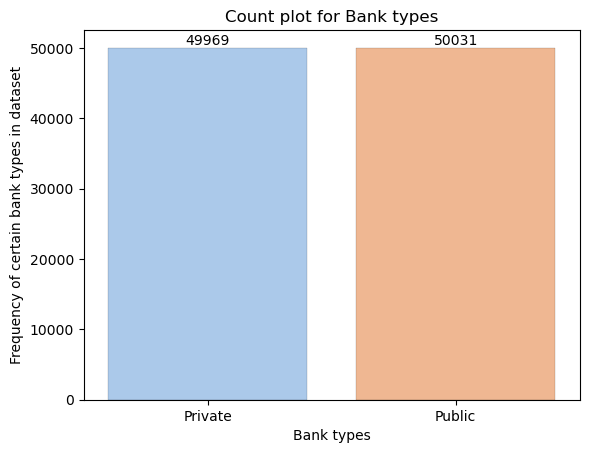

In [18]:
# Setting the figure and axes
fig, ax = plt.subplots()

# Plotting the graph
bars = sns.countplot(x ='bank_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank types")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain bank types in dataset")

# Setting the title of the graph
ax.set_title("Count plot for Bank types")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

We can see here that the dataset consist of pretty much equal number of Bank types both Private and Public banks' records.

#### b. A Count plot for **`loan_type`** column.

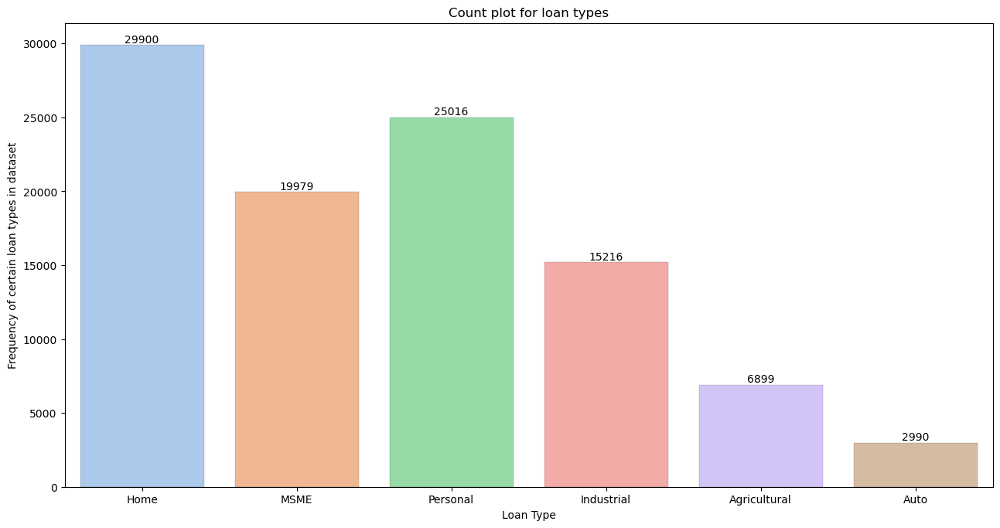

In [19]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x ='loan_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Type")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain loan types in dataset")

# Setting the title of the graph
ax.set_title("Count plot for loan types")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- We can see here that most of the records are of **Home** loans, meaning most of the loans taken are home loans. Second highest are **Personal** loans and third highest are **MSME** loans, **Industrial** is fourth, **Agricultural** and **Auto** in the rest.
- This tells us that a very bigger portion of the loan market is made up of **Home** loans.

#### c. A Count plot for **`repayment_status`** column.

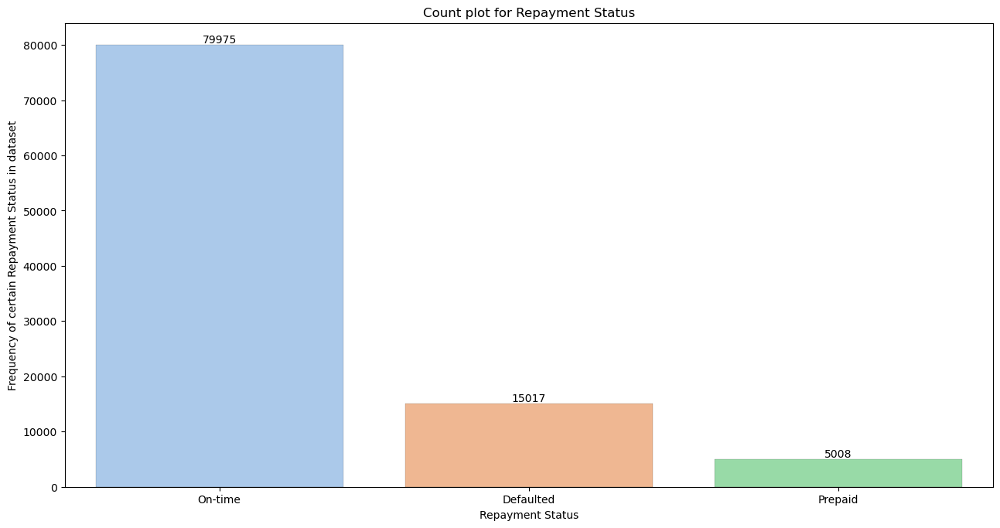

In [20]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x ='repayment_status', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Repayment Status")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain Repayment Status in dataset")

# Setting the title of the graph
ax.set_title("Count plot for Repayment Status")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**
- We can see that most of the loans have **On-time** repayment status meaning most of the records are made up of good loans,
- Second most are **Defaulted** loan payments and third most are **Prepaid**.

#### d. A Count plot for **`employment_status`** column.

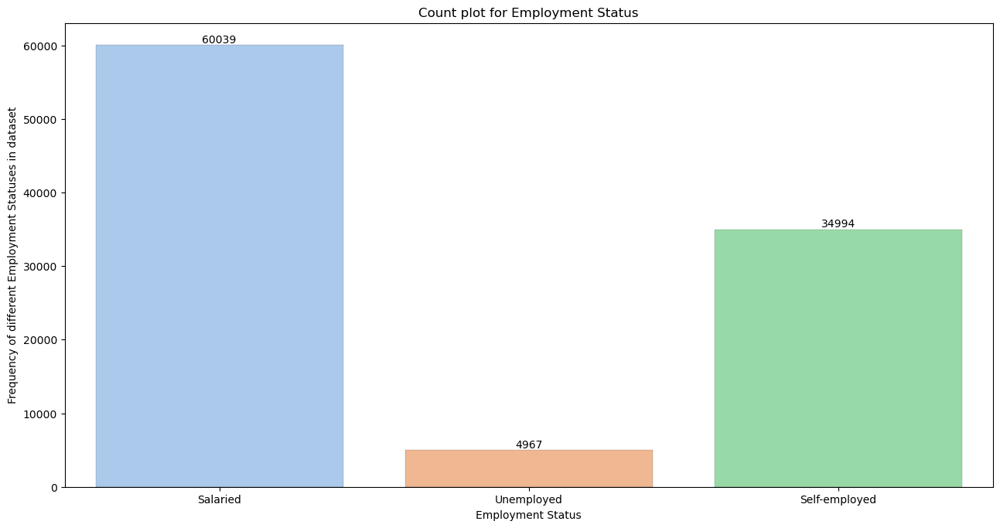

In [21]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x ='employment_status', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Employment Status")

# Setting the name of y axis
ax.set_ylabel("Frequency of different Employment Statuses in dataset")

# Setting the title of the graph
ax.set_title("Count plot for Employment Status")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most borrowers are Salaried, especially in urban areas with higher income stability.
- Self-employed individuals form a sizable share, likely linked to MSME/Industrial loans.
- Unemployed borrowers are few, possibly higher-risk cases.

#### e. A Count plot for **`business_size`** column.

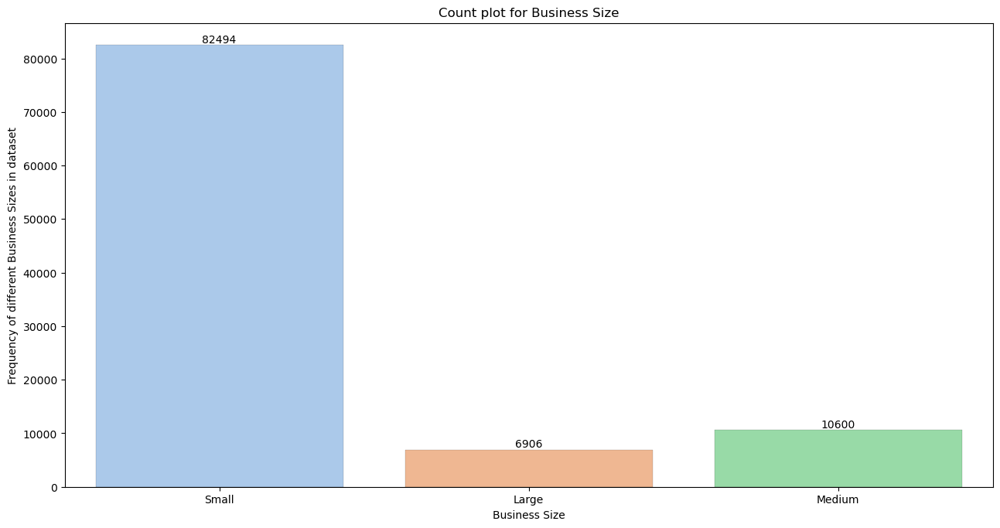

In [22]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x ='business_size', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Business Size")

# Setting the name of y axis
ax.set_ylabel("Frequency of different Business Sizes in dataset")

# Setting the title of the graph
ax.set_title("Count plot for Business Size")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Small businesses account for the majority of business loans, typical in MSME lending.
- Medium and Large follow — fewer large enterprises seek such retail credit.
- About 65% of rows are null here, as expected for non-business loans.

#### f. A Count plot for **`customer_location`** column.

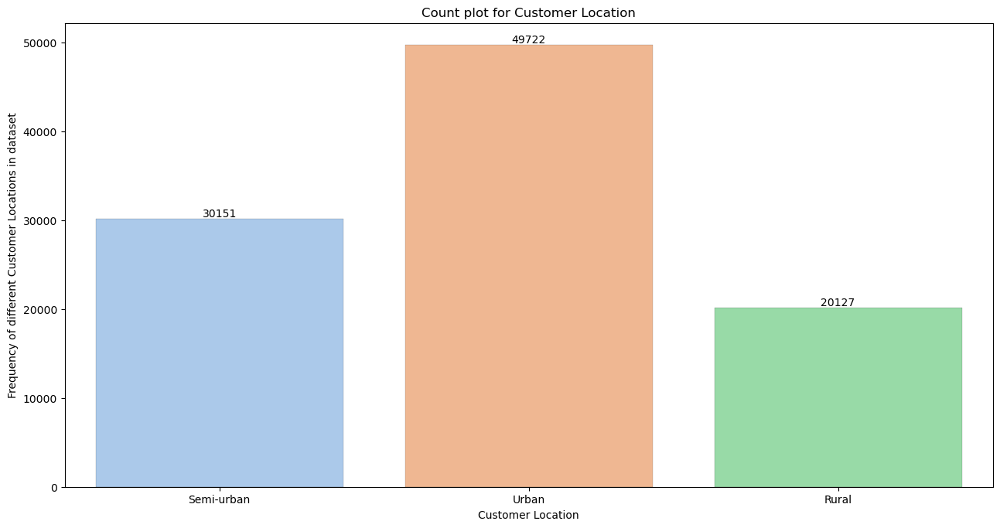

In [23]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x ='customer_location', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Customer Location")

# Setting the name of y axis
ax.set_ylabel("Frequency of different Customer Locations in dataset")

# Setting the title of the graph
ax.set_title("Count plot for Customer Location")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Urban borrowers dominate the dataset, consistent with urban loan demand and bank presence.
- Semi-urban areas follow, and Rural borrowers are the smallest group.
- Reflects real-world financial access and bias in banking reach.

#### g. A Count plot for **`loan_purpose`** column.

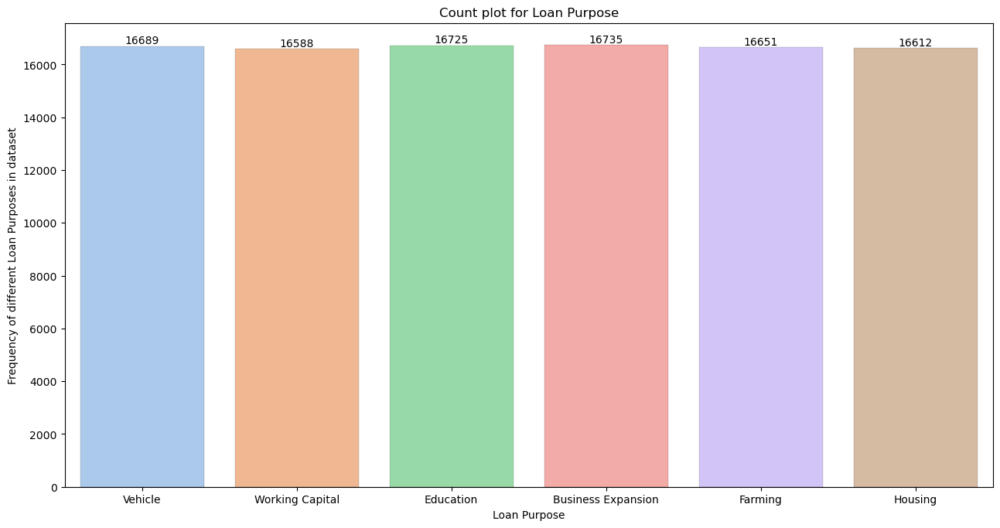

In [24]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x ='loan_purpose', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Purpose")

# Setting the name of y axis
ax.set_ylabel("Frequency of different Loan Purposes in dataset")

# Setting the title of the graph
ax.set_title("Count plot for Loan Purpose")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()


**Interpretation**

- Housing is the top purpose, matching the dominance of home loans.
- Business Expansion and Working Capital appear prominently, supporting MSME demand.
- Vehicle, Education, and Farming are smaller segments.

### 2. Numerical columns

#### a. A Histogram for **`loan_amount`** column.

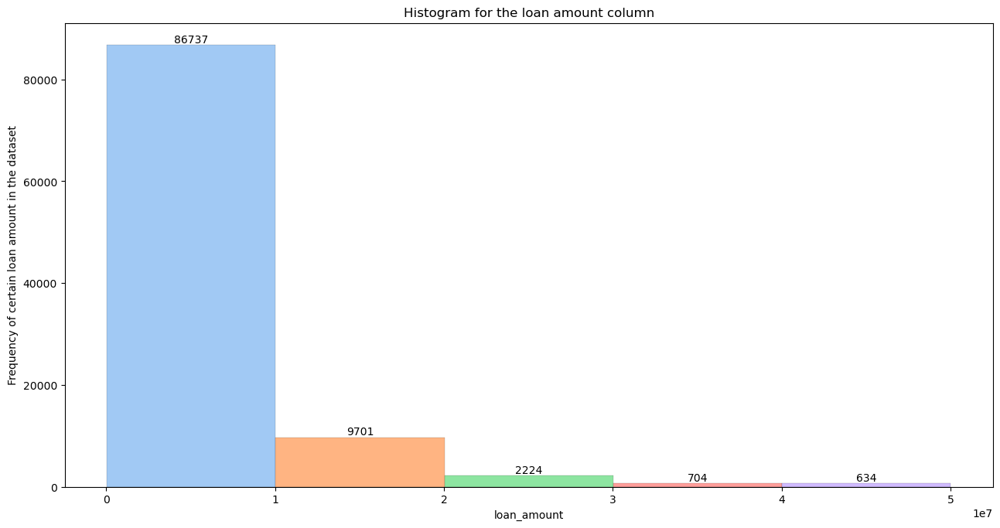

In [25]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "loan_amount", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("loan_amount")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain loan amount in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the loan amount column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- We can see that most of the loans in this dataset has amount between **0** to **1 cr**.
- And very less records has loan amounts between **1cr** to **5cr**.

#### b. A Histogram for **`interest_rate`** column.

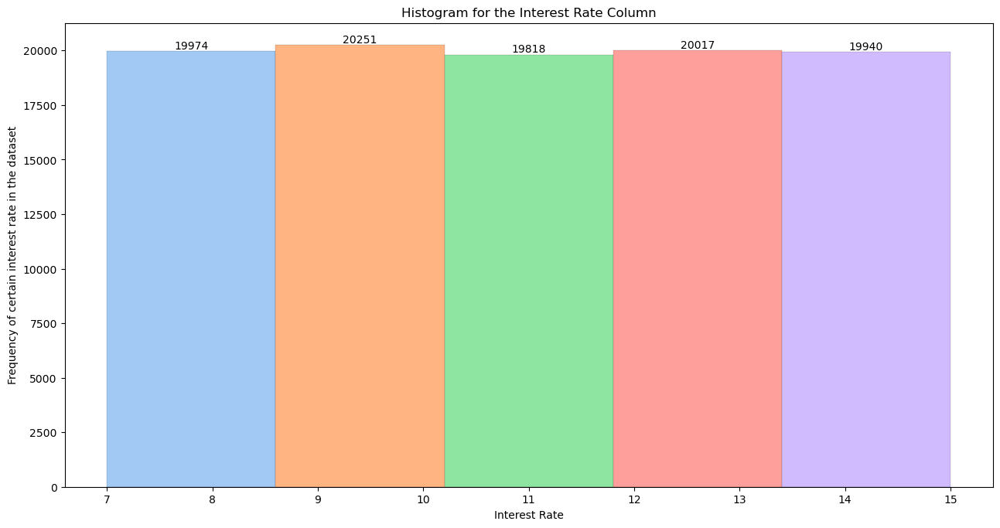

In [26]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "interest_rate", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Interest Rate")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain interest rate in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Interest Rate Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Majority of loans have interest rates between 7% to 10%, suggesting a focus on affordable lending.
- A small number of records fall outside this range, possibly personal or high-risk loans.

#### c. A Histogram for **`tenure_months`** column.

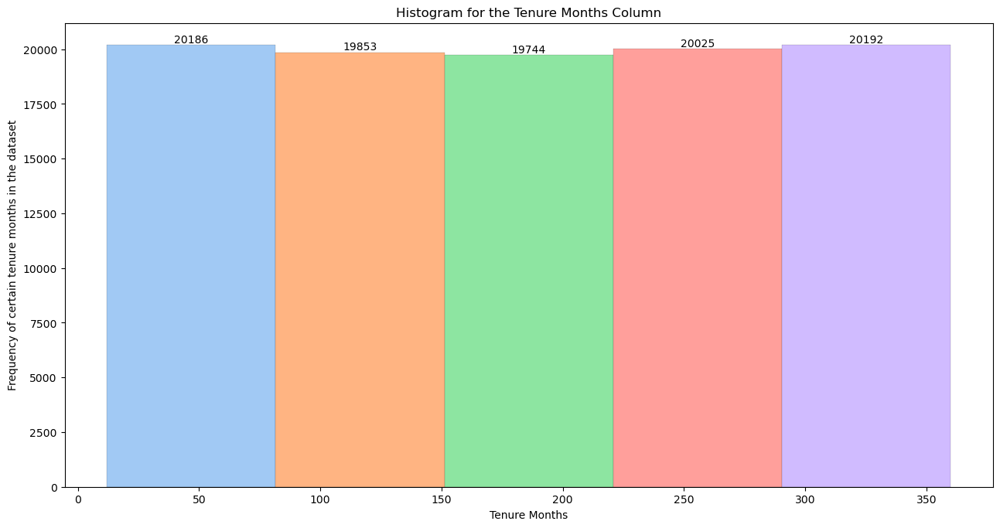

In [27]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "tenure_months", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Tenure Months")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain tenure months in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Tenure Months Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most loan tenures are short to medium-term (under 10 years).
- Very few loans have tenure exceeding 15 years, indicating they might be home loans.

#### d. A Histogram for **`credit_score`** column.

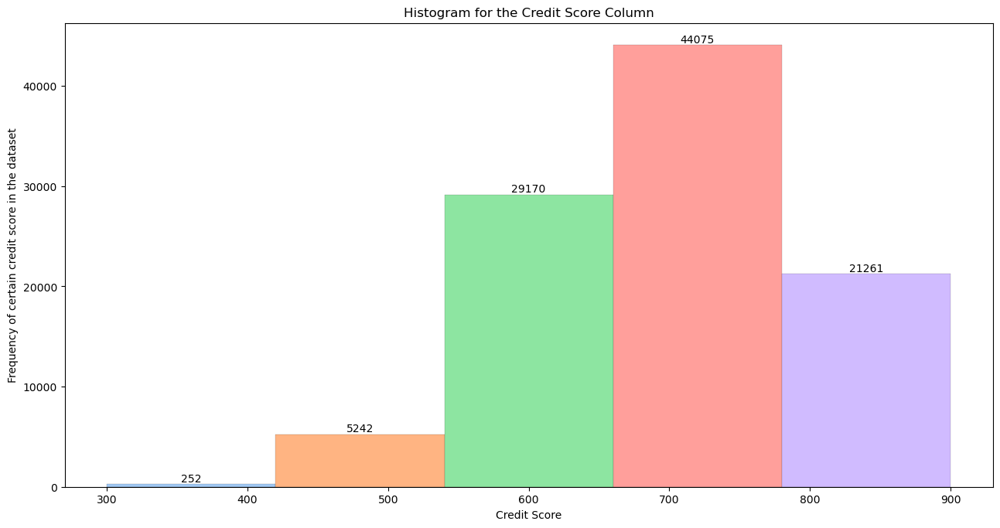

In [28]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "credit_score", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Credit Score")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain credit score in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Credit Score Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

Interpretation

- Most customers have credit scores between 600 and 800, suggesting a generally healthy credit base.
- A few low-credit cases (< 500) appear, possibly explaining some of the defaults.

#### e. A Histogram for **`customer_income`** column.

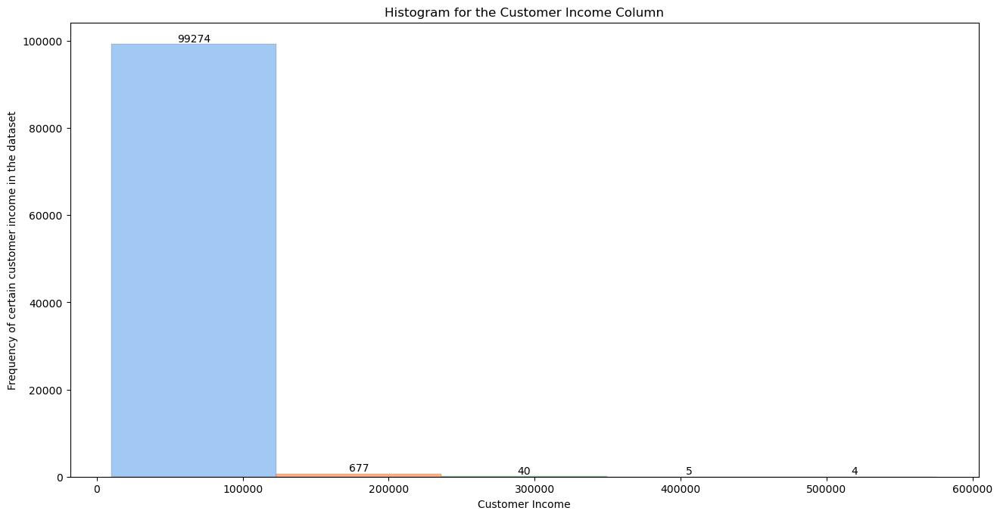

In [29]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "customer_income", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Customer Income")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain customer income in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Customer Income Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most borrowers earn under INR 2 lakh, typical of middle-income segment.
- High income earners (> INR 5 lakh) are rare, likely with private banks or urban branches.

#### f. A Histogram for **`customer_age`** column.

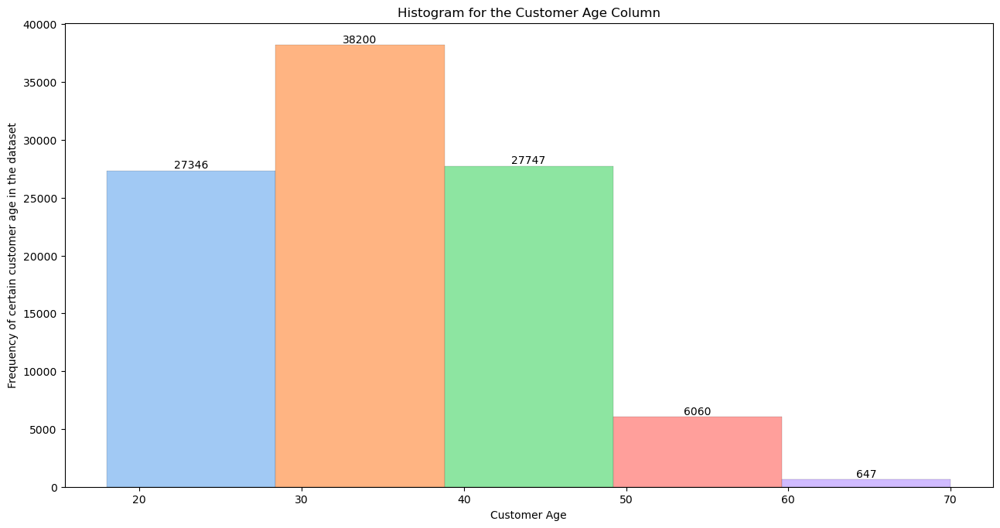

In [30]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "customer_age", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Customer Age")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain customer age in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Customer Age Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- This histogram shows the distribution of Customer Age in the dataset.
- Most customers appear to be in a specific age bracket (likely mid-adulthood).
- Very few customers are significantly younger or older.

#### g. A Histogram for **`net_interest_margin`** column.

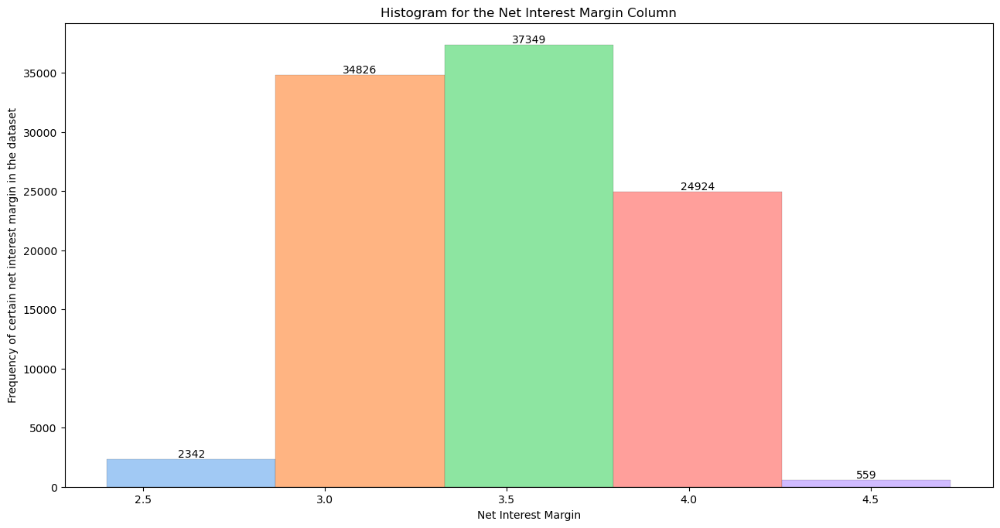

In [31]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "net_interest_margin", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Net Interest Margin")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain net interest margin in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Net Interest Margin Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most firms show Net Interest Margin clustered around a central value.
- A few firms show either extremely low or high margins, possibly due to unique strategies.

#### h. A Histogram for **`loan_spread`** column.

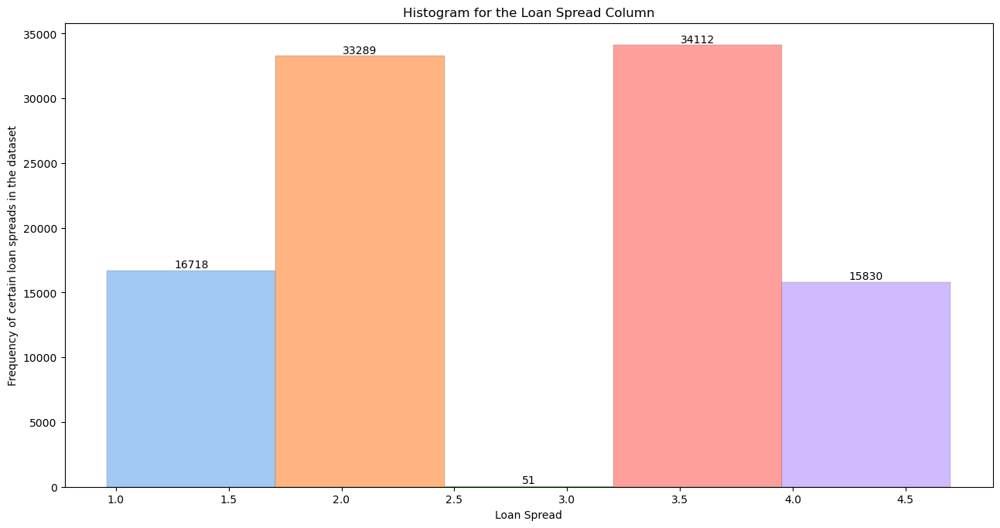

In [32]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "loan_spread", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Loan Spread")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain loan spreads in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Loan Spread Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The loan spread, which reflects the difference between interest rates and benchmark rates, is concentrated in a moderate range for most loans.
- A few records show either very low or very high spreads, possibly indicating promotional rates or loans for high-risk profiles.

#### i. A Histogram for **`deposit_growth_rate`** column.

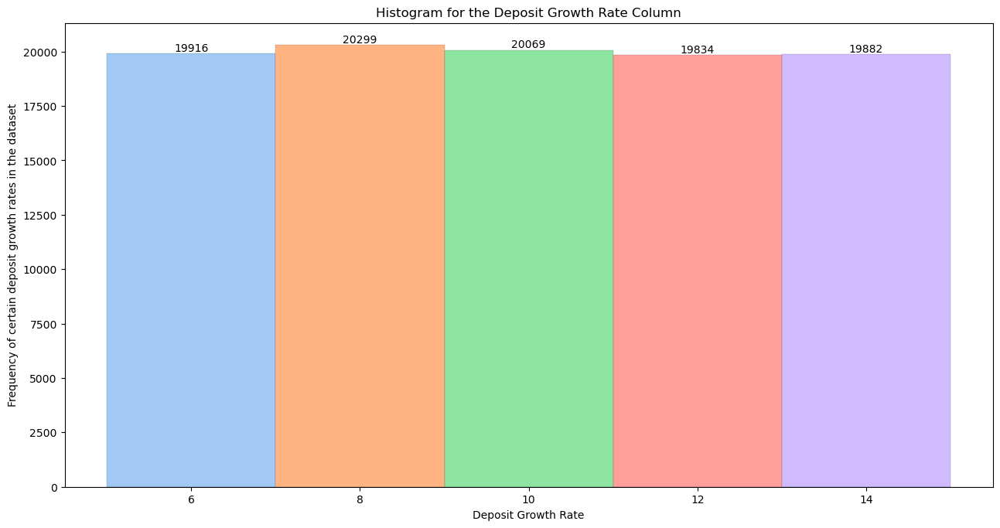

In [33]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "deposit_growth_rate", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Deposit Growth Rate")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain deposit growth rates in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Deposit Growth Rate Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()


**Interpretation**

- The deposit growth rate in this dataset is primarily concentrated between 5% and 10%, aligning with expected trends for Indian banks in 2025.
- Fewer records show deposit growth above 10%, indicating that rapid deposit expansion is relatively uncommon.

#### j. A Histogram for **`repo_rate`** column.

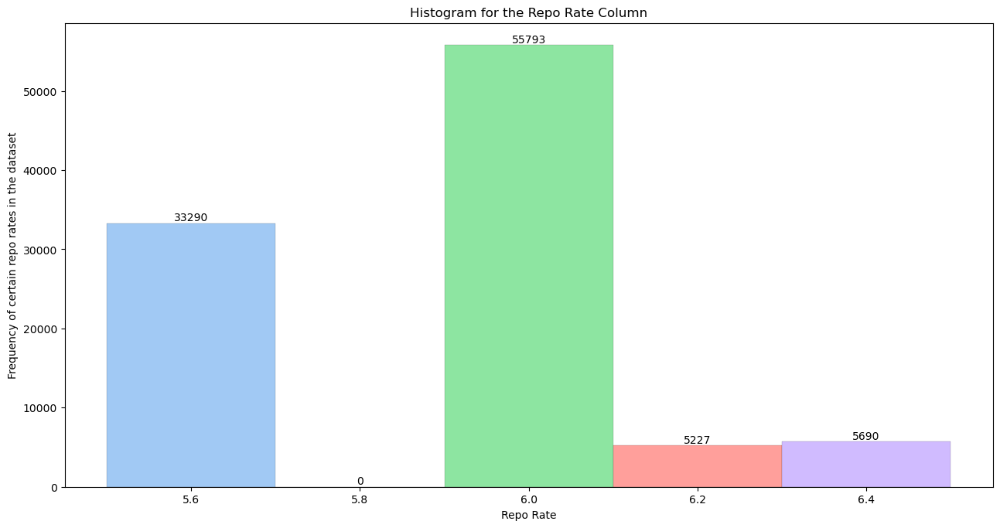

In [34]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "repo_rate", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Repo Rate")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain repo rates in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Repo Rate Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most records have a repo rate of around 6.5% and 6.0%, which aligns with India's economic policy in 2024.
- A smaller number of records reflect the reduced repo rate of 5.5%, capturing the 2025 monetary easing trend.

#### k. A Histogram for **`cash_reserve_ratio`** column.

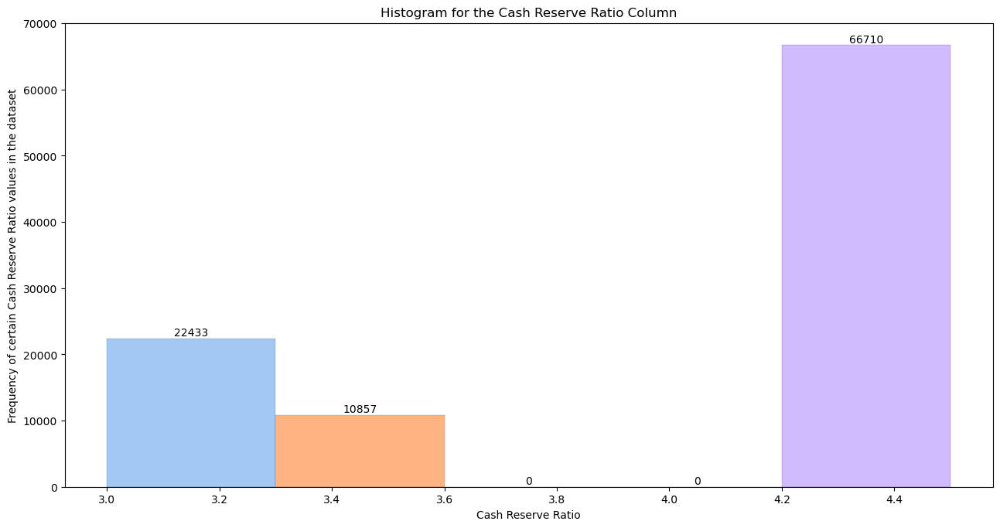

In [35]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "cash_reserve_ratio", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Cash Reserve Ratio")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain Cash Reserve Ratio values in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Cash Reserve Ratio Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The Cash Reserve Ratio (CRR) is mostly recorded at 4.5%, reflecting 2024 norms.
- A noticeable portion of records show a decline in CRR to 3.5% and 3.0%, consistent with 2025 policy adjustments.

#### l. A Histogram for **`inflation_rate`** column.

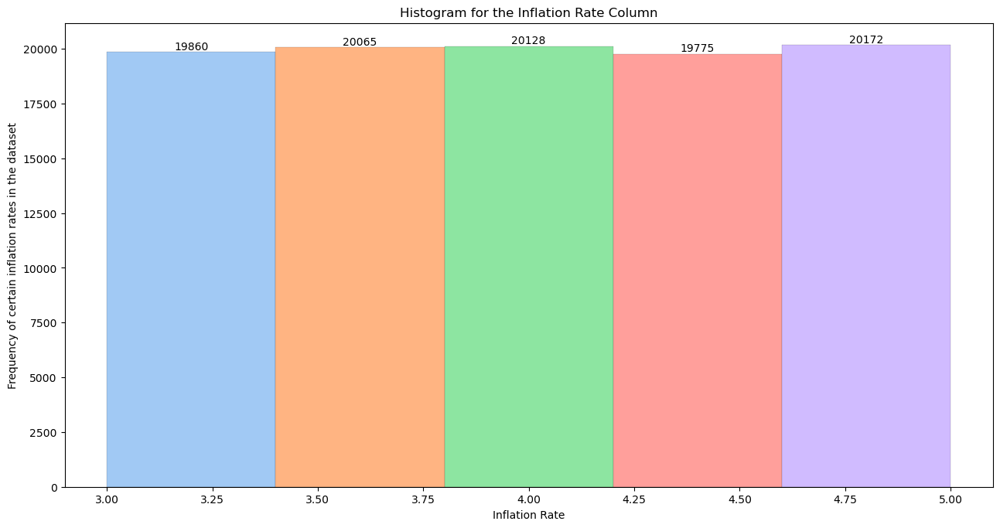

In [36]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "inflation_rate", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Inflation Rate")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain inflation rates in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Inflation Rate Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The inflation rate is mostly centered around 5.5% to 6.5%, reflecting a controlled inflation scenario.
- Only a few records indicate lower inflation (< 5%), suggesting temporary dips or sector-specific trends.

#### m. A Histogram for **`gdp_growth`** column.

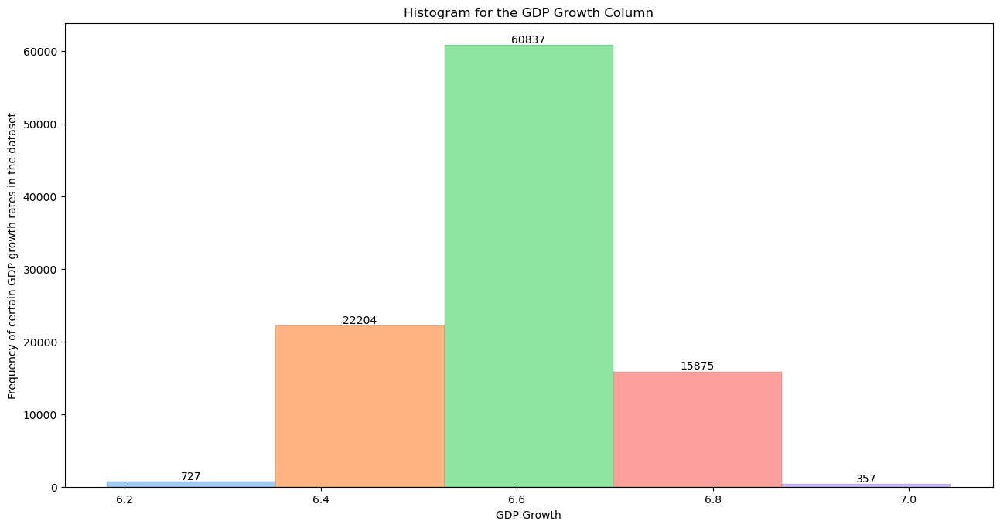

In [37]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "gdp_growth", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("GDP Growth")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain GDP growth rates in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the GDP Growth Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The majority of records show GDP growth between 6.0% and 8.0%, indicating strong economic performance.
- A few records indicate slowdowns (< 5%), possibly due to sector-specific stagnation.

#### n. A Histogram for **`consumer_confidence`** column.

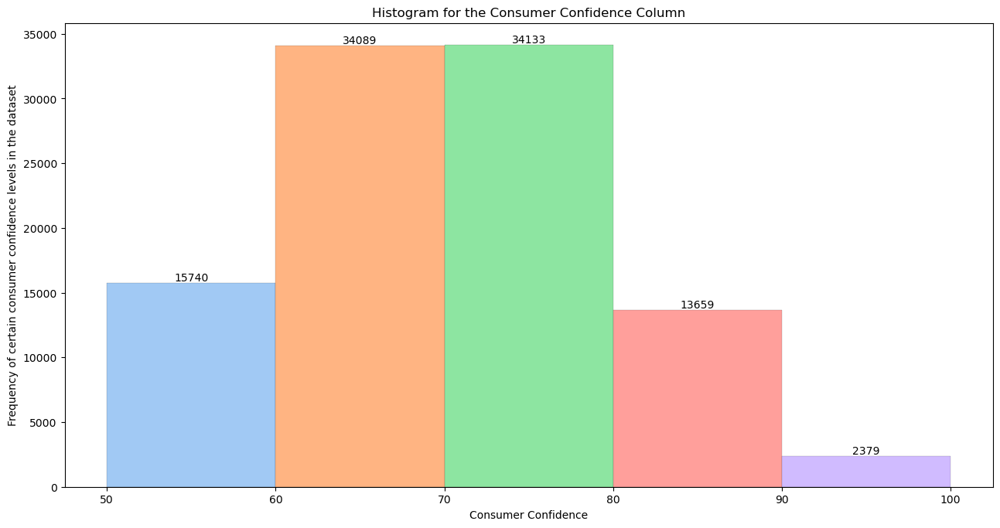

In [38]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "consumer_confidence", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Consumer Confidence")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain consumer confidence levels in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Consumer Confidence Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most records show high consumer confidence (> 75), suggesting strong consumer sentiment in the economy.
- Some records fall in the 60–70 range, indicating slightly cautious spending behavior.

#### o. A Histogram for **`industrial_production_index`** column.

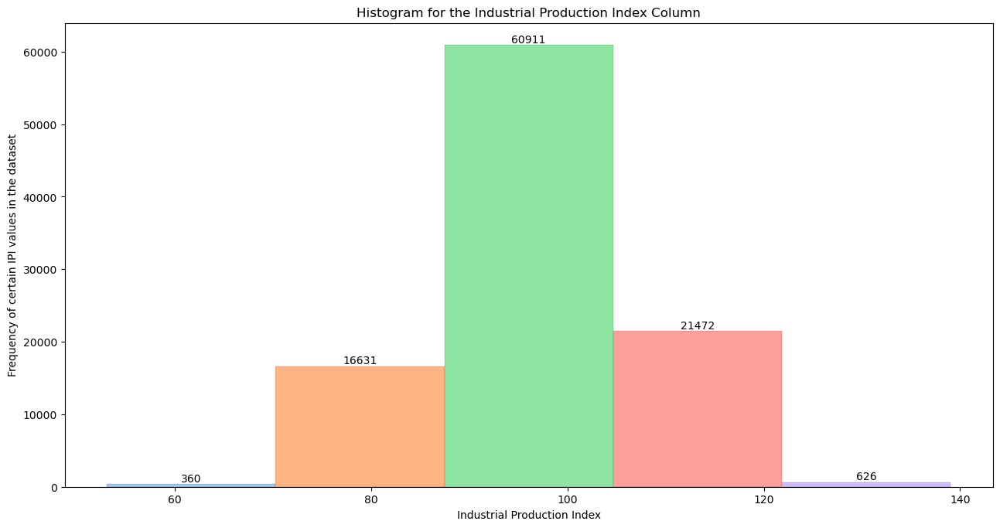

In [39]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "industrial_production_index", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Industrial Production Index")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain IPI values in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Industrial Production Index Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The Industrial Production Index (IPI) is largely concentrated between 120 and 140, indicating active production cycles.
- Some values below 120 could point to slowing industrial output in certain sectors.

#### p. A Histogram for **`sector_loan_growth`** column.

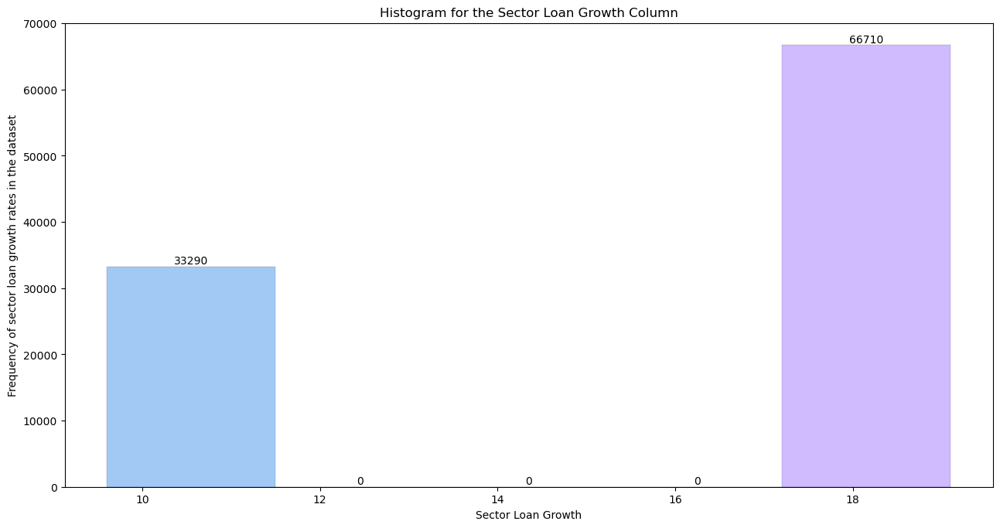

In [40]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "sector_loan_growth", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Sector Loan Growth")

# Setting the name of y axis
ax.set_ylabel("Frequency of sector loan growth rates in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Sector Loan Growth Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The sector loan growth rate is mostly between 10% and 15%, showing healthy demand for credit across sectors.
- Some sectors have low or high extremes, indicating differing capital requirements.

#### q. A Histogram for **`sector_demand_index`** column.

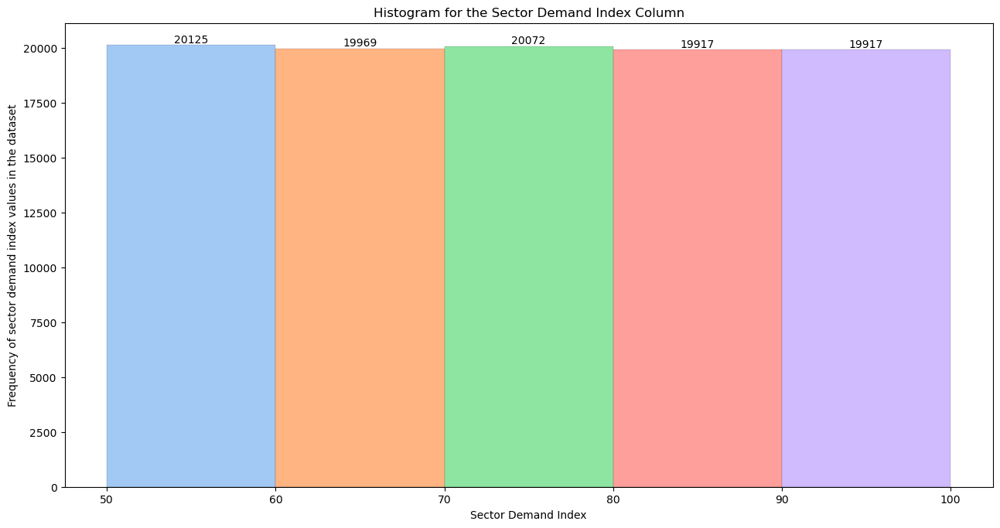

In [41]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "sector_demand_index", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Sector Demand Index")

# Setting the name of y axis
ax.set_ylabel("Frequency of sector demand index values in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Sector Demand Index Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most of the values in Sector Demand Index lie between 70 and 90, indicating moderate to high demand in most industries.
- Some records show a dip below 70, suggesting slower-moving sectors or regional demand slumps.

#### r. A Histogram for **`loan_to_deposit_ratio`** column.

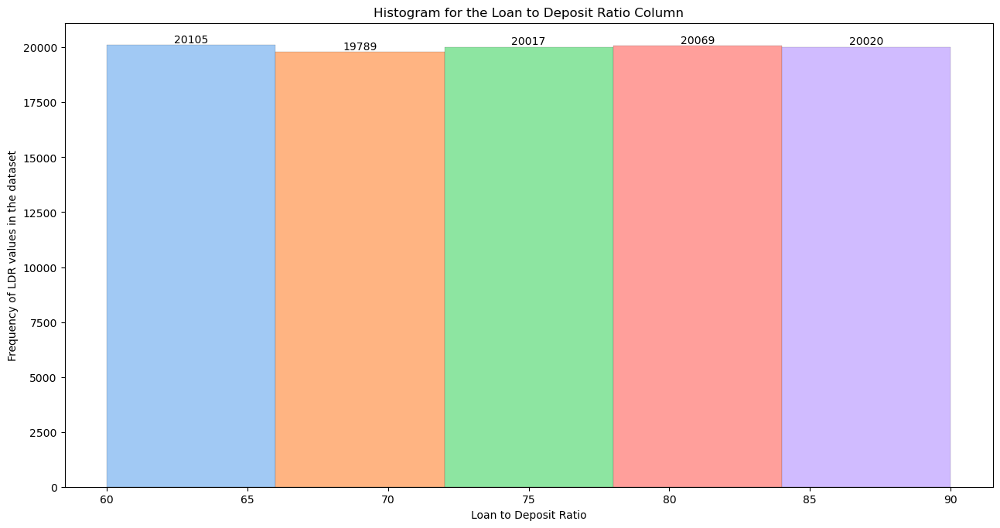

In [42]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "loan_to_deposit_ratio", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Loan to Deposit Ratio")

# Setting the name of y axis
ax.set_ylabel("Frequency of LDR values in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Loan to Deposit Ratio Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- The Loan to Deposit Ratio is mostly clustered around 75% to 90%, indicating optimal lending utilization.
- A few records exceed 90%, which may imply higher credit risk exposure or aggressive lending.

#### s. A Histogram for **`default_risk_score`** column.

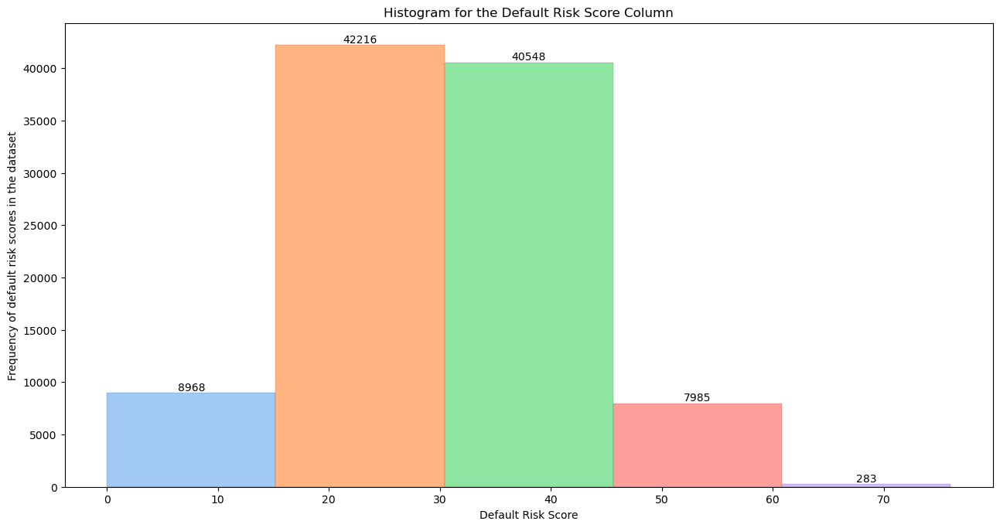

In [43]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "default_risk_score", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Default Risk Score")

# Setting the name of y axis
ax.set_ylabel("Frequency of default risk scores in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Default Risk Score Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most values of Default Risk Score lie between 40 and 60, reflecting moderate credit risk across loan profiles.
- A small fraction lies below 40, showing high-risk segments needing closer scrutiny.

#### t. A Histogram for **`branch_density`** column.

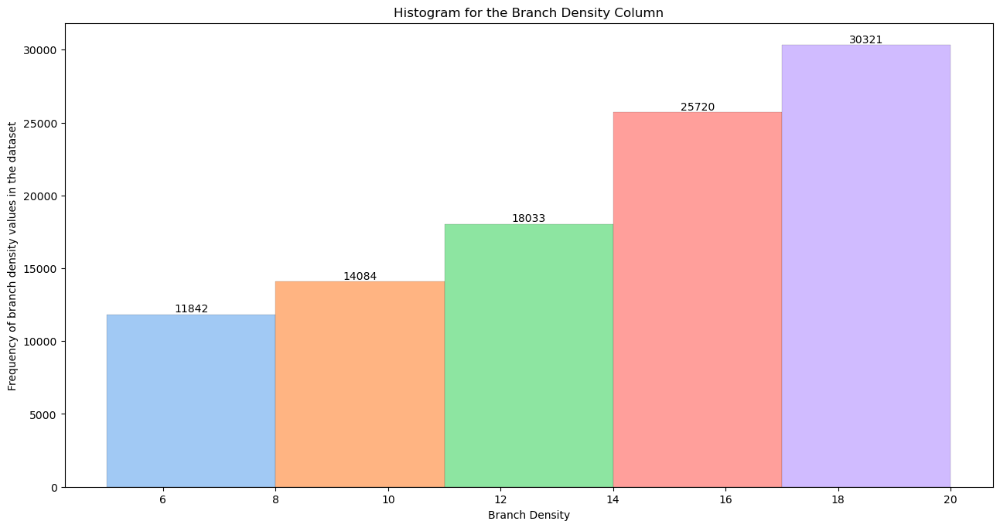

In [44]:
# Setting figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting axes for the graph
ax = fig.add_axes([0,0,1,1])

# Dividing the pastel color palette into 5 colors
cm = sns.color_palette("pastel", 5)

# Plotting the graph
bars = sns.histplot(x = "branch_density", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the bars
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Branch Density")

# Setting the name of y axis
ax.set_ylabel("Frequency of branch density values in the dataset")

# Setting the title for the graph
ax.set_title("Histogram for the Branch Density Column")

# Setting the bar values
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- Most banks have a branch density between 1 and 2 branches per 100 sq. km, suggesting moderate network coverage.
- Some outliers indicate dense branch networks (>2.5), often typical in urban or metropolitan zones.

### 3. Datetime columns

#### a. A Histogram for **`disbursement_day`** column.

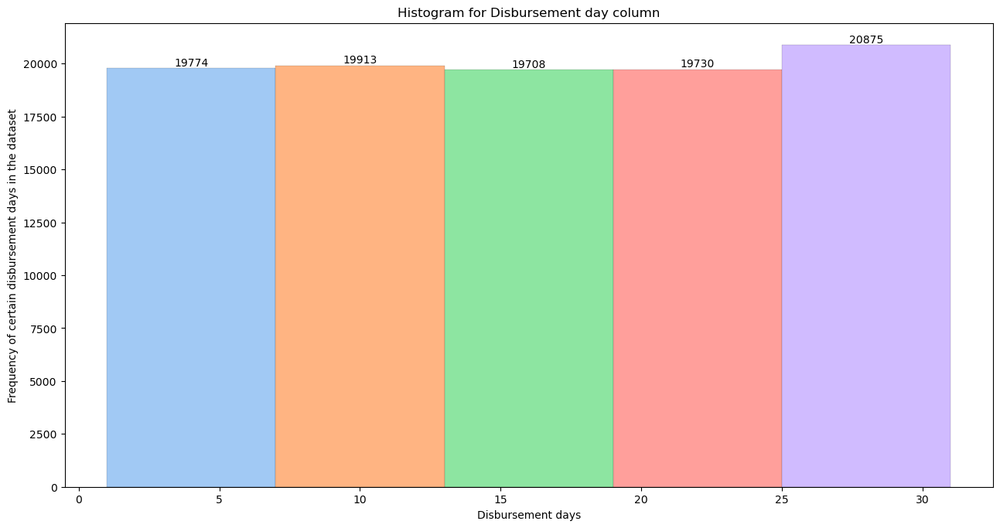

In [45]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Seperating the colors
cm = sns.color_palette('pastel', 5)

# Plotting the graph
bars = sns.histplot(x = "disbursement_day", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the graph
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Disbursement days")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain disbursement days in the dataset")

# Setting the title of the graph
ax.set_title("Histogram for Disbursement day column")

# Setting the values of the bar
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- We can see that there is no particular pattern here, but a lot of records have **loan disbursement date** between **25** to **31**.
- And there are also equal number of records where **loan disbursement** was done on dates between **5** to **25**.

#### b. A Histogram for **`disbursement_month`** column.

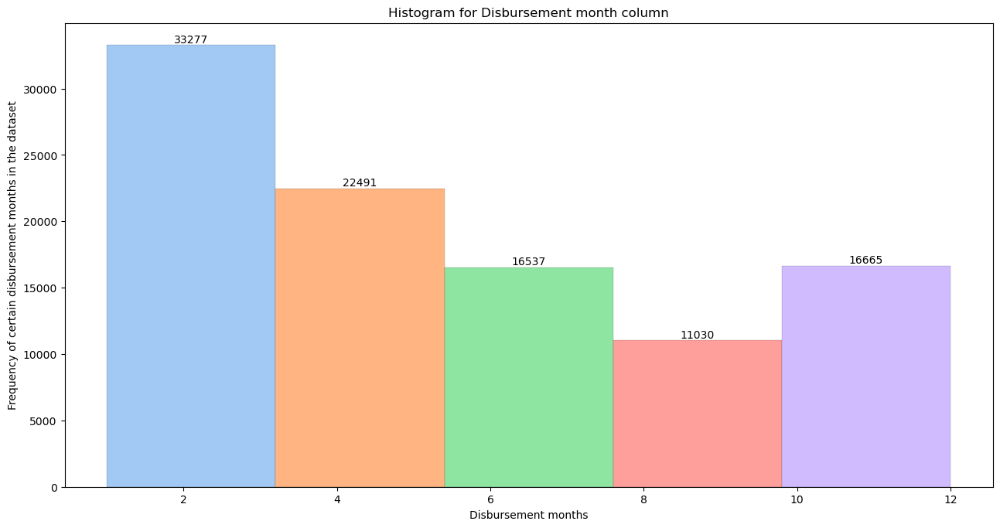

In [46]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Seperating the colors
cm = sns.color_palette('pastel', 5)

# Plotting the graph
bars = sns.histplot(x = "disbursement_month", data = df_bank_loan_data, bins = 5, edgecolor = 'black', linewidth = 0.1)

# Coloring the graph
for bin, i in zip(bars.patches, cm):
    bin.set_facecolor(i)

# Setting the name of x axis
ax.set_xlabel("Disbursement months")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain disbursement months in the dataset")

# Setting the title of the graph
ax.set_title("Histogram for Disbursement month column")

# Setting the values of the bar
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- We can see that there is no particular pattern here, but a large number of records have **loan disbursement month** between **May** to **August**.
- Disbursements are comparatively fewer in months like **January** and **December**, possibly due to **holiday seasons** or **year-end financial closures**.
- The distribution indicates that **mid-year months** are generally more active for **loan disbursals**.

#### c. A count plot for **`disbursement_year`** column.

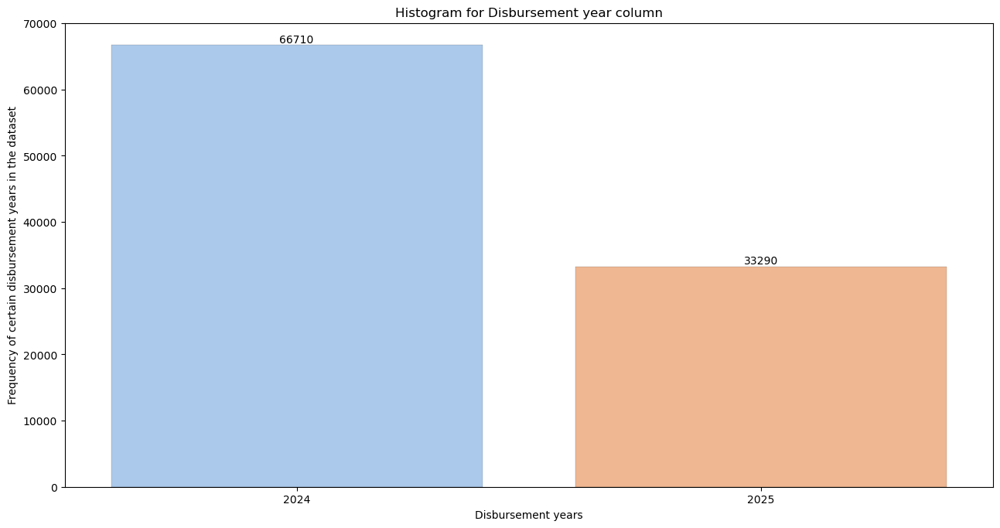

In [47]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
bars = sns.countplot(x = "disbursement_year", data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Disbursement years")

# Setting the name of y axis
ax.set_ylabel("Frequency of certain disbursement years in the dataset")

# Setting the title of the graph
ax.set_title("Histogram for Disbursement year column")

# Setting the values of the bar
for container in bars.containers:
    ax.bar_label(container)

# Displaying the graph
plt.show()

**Interpretation**

- We can see that most of the loans in the dataset were disbursed in the year **2024**.
- There are less records of loan disbursed in year **2025**.

## b) Bivariate Analysis

Here we are going to plot graphs for each of the column pairs such as Numerical-Numerical pair, Categorical-Categorical pair, Numerical-Categorical pair, Numerical-datetime pair and Categorical-datetime pair.

### 1. Numerical, Numerical column pair

In [48]:
# Making the correlation matrix to fetch out the pair of Numerical columns for performing Bivariate Analysis
correlation = df_bank_loan_data.select_dtypes(include = np.number).corr()

# Printing the correlation table
correlation

,loan_amount,interest_rate,tenure_months,credit_score,customer_income,customer_age,net_interest_margin,loan_spread,deposit_growth_rate,repo_rate,cash_reserve_ratio,inflation_rate,gdp_growth,consumer_confidence,industrial_production_index,sector_loan_growth,sector_demand_index,loan_to_deposit_ratio,default_risk_score,branch_density,disbursement_day,disbursement_month,disbursement_year
loan_amount,1.000000,-0.000023,0.000785,0.001521,-0.002650,-0.004024,-0.002481,-0.002625,0.001612,0.001303,0.000715,-0.000164,0.001083,-0.002056,-0.000612,0.001581,-0.001512,0.001500,-0.002860,-0.002902,0.003767,-0.001496,-0.001581
interest_rate,-0.000023,1.000000,-0.000698,-0.002473,-0.004281,0.000576,0.001946,0.000991,0.007018,-0.000657,-0.000316,0.004210,-0.002849,0.002679,0.004006,0.000446,-0.004582,-0.003525,0.000596,0.007402,0.005600,-0.002242,-0.000446
tenure_months,0.000785,-0.000698,1.000000,0.003346,-0.002551,-0.006651,0.006195,0.005350,0.001991,0.003498,0.005735,0.001751,-0.002496,0.005013,-0.003581,0.005297,-0.000585,0.001096,-0.001465,0.001645,0.004092,0.003756,-0.005297
credit_score,0.001521,-0.002473,0.003346,1.000000,0.005941,-0.007784,0.001219,0.001555,0.004661,-0.000647,0.000877,0.003489,-0.002940,0.001901,0.000805,-0.000322,-0.000726,-0.002149,-0.891443,0.000789,0.000034,-0.002841,0.000322
customer_income,-0.002650,-0.004281,-0.002551,0.005941,1.000000,-0.004827,-0.002819,-0.002027,0.003030,-0.002926,-0.003024,-0.002257,-0.002872,0.005457,-0.000476,-0.003176,0.001158,-0.005752,-0.003350,-0.003694,-0.004212,0.002582,0.003176
customer_age,-0.004024,0.000576,-0.006651,-0.007784,-0.004827,1.000000,0.004404,0.000732,-0.001139,0.004680,0.005926,-0.000835,0.007538,0.001747,-0.001982,0.005677,-0.002031,-0.004261,0.007039,0.003692,-0.004600,0.003145,-0.005677
net_interest_margin,-0.002481,0.001946,0.006195,0.001219,-0.002819,0.004404,1.000000,0.816457,-0.002075,-0.001956,-0.002350,0.001413,-0.000086,0.003528,-0.003345,-0.002880,0.002712,-0.001959,-0.002284,0.001325,-0.004804,0.001099,0.002880
loan_spread,-0.002625,0.000991,0.005350,0.001555,-0.002027,0.000732,0.816457,1.000000,-0.002163,-0.002022,-0.002162,-0.001243,0.001147,0.003521,-0.001015,-0.003243,0.001963,-0.001743,-0.003100,0.003941,-0.001669,-0.000167,0.003243
deposit_growth_rate,0.001612,0.007018,0.001991,0.004661,0.003030,-0.001139,-0.002075,-0.002163,1.000000,-0.001016,-0.002546,0.003224,-0.002476,0.002182,0.004703,-0.002290,0.007019,0.005117,-0.005868,0.001099,-0.000894,-0.004858,0.002290
repo_rate,0.001303,-0.000657,0.003498,-0.000647,-0.002926,0.004680,-0.001956,-0.002022,-0.001016,1.000000,0.887977,-0.001931,0.005480,-0.001629,-0.002773,0.908205,-0.000003,-0.001046,-0.000295,-0.001468,0.007653,0.164760,-0.908205


**Interpretation**

We can see that it is a bit time consuming to find strong correlated columns here in correlation table. So let's build a Correlation heatmap

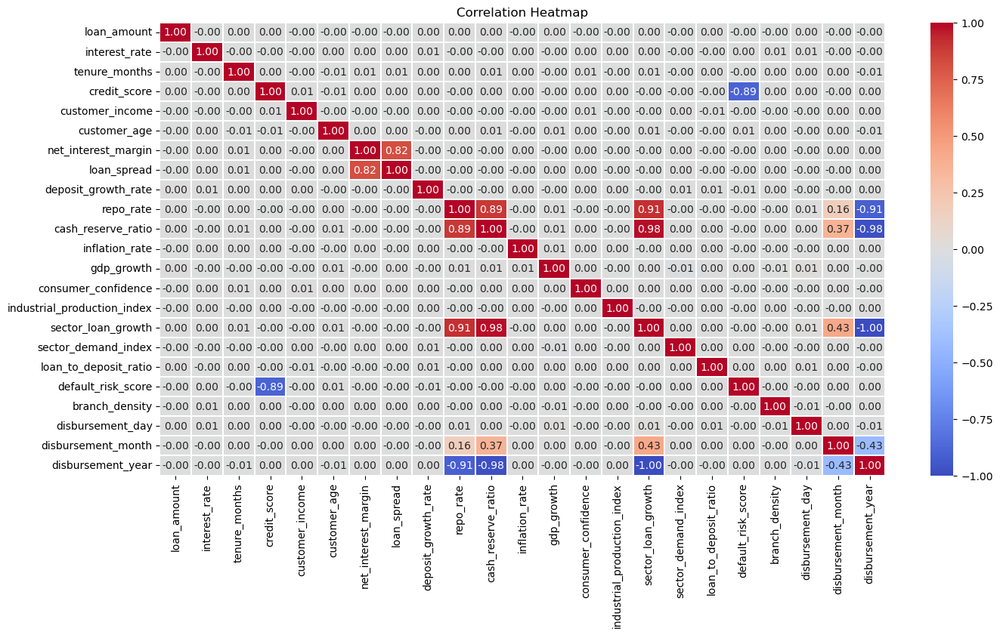

In [49]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.heatmap(correlation, annot = True, fmt = ".2f", cmap = "coolwarm", linewidth = 0.01)

# Setting the title for the graph
ax.set_title("Correlation Heatmap")

# Displaying the graph
plt.show()

**Interpretation**

From this correlation heatmap we can see that there are come columns which are well correlated **(correlation > 0.3 && correlation < -0.3)**, So we will perform **Bivariate Analysis** between these **Numerical-Numerical** pairs, which are as follows:

- **`credit_score`** and **`default_risk_score`** == **-0.89** meaning **negatively** correlated by **89** percent.

- **`repo_rate`** and **`sector_loan_growth`** == **0.91** meaning **positively** correlated by **91** percent.
- **`cash_reserve_ratio`** and **`sector_loan_growth`** == **0.98** meaning **positively** correlated by **98** percent.
- **`repo_rate`** and **`disbursement_year`** == **-0.91** meaning **negatively** correlated by **91** percent.
- **`cash_reserve_ratio`** and **`disbursement_year`** == **-0.98** meaning **negatively** correlated by **98** percent.
- **`net_interest_margin`** and **`loan_spread`** == **0.82** meaning **positively** correlated by **82** percent.
- **`repo_rate`** and **`cash_reserve_ratio`** == **0.89** meaning **positively** correlated by **89** percent.
- **`sector_loan_growth`** and **`disbursement_year`** == **-1.00** meaning **negatively** correlated by **100** percent.
- **`disbursement_month`** and **`disbursement_year`** == **-0.43** meaning **negatively** correlated by **43** percent.
- **`sector_loan_growth`** and **`disbursement_month`** == **0.43** meaning **positively** correlated by **43** percent.
- **`cash_reserve_ratio`** and **`disbursement_month`** == **0.37** meaning **positively** correlated by **37** percent.

#### a. A scatter plot for **`credit_score`** vs **`default_risk_score`** column.

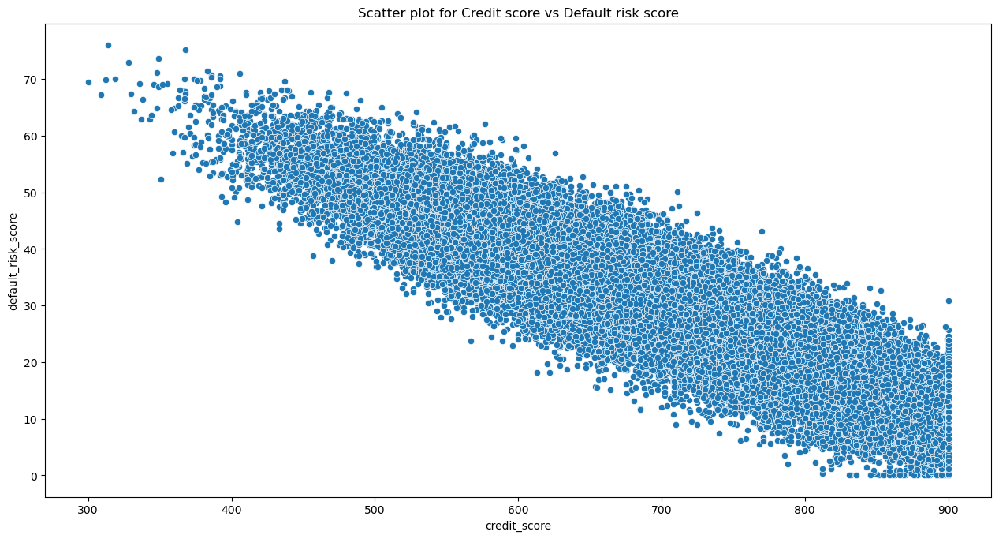

In [50]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'credit_score', y = 'default_risk_score', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("credit_score")

# Setting the name of y axis
ax.set_ylabel("default_risk_score")

# Setting the title of graph
ax.set_title("Scatter plot for Credit score vs Default risk score")

# Displaying the graph
plt.show()

**Interpretation**

- We can see that there is a negative correlation between **Credit Score** and **Default risk score**.
- This implies that for Higher credit scores there were low default risk scores.
- Which gives us a simple insight that credit score can be a very good indicator for granting loans.
- Though there are certain outliers that does exist meaning **special cases** where even though credit score was high still default risk score was also a bit high.

#### b. A scatter plot for **`repo_rate`** vs **`sector_loan_growth`** column.

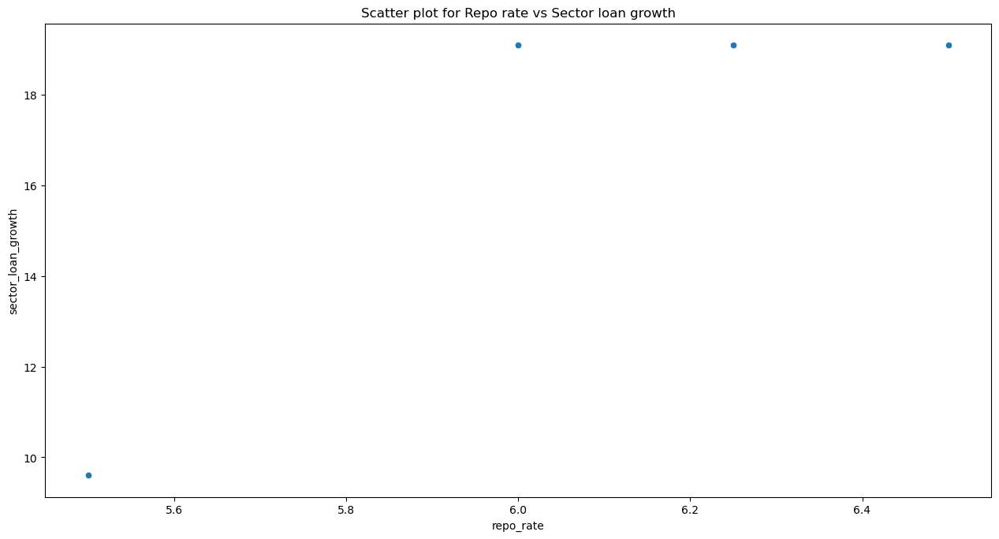

In [51]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'repo_rate', y = 'sector_loan_growth', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("repo_rate")

# Setting the name of y axis
ax.set_ylabel("sector_loan_growth")

# Setting the title of graph
ax.set_title("Scatter plot for Repo rate vs Sector loan growth")

# Displaying the graph
plt.show()

**Interpretation**

- There is a **strong positive correlation** between **Repo Rate** and **Sector Loan Growth**.
- This means that as the **repo rate increases**, the **sector loan growth** also tends to increase.
- This may suggest a scenario where **economic stimulation efforts** coincide with higher sectoral lending.
- However, this pattern could also depend on **external regulatory or policy-driven lending mandates**.

#### c. A scatter plot for **`cash_reserve_ratio`** vs **`sector_loan_growth`** column.

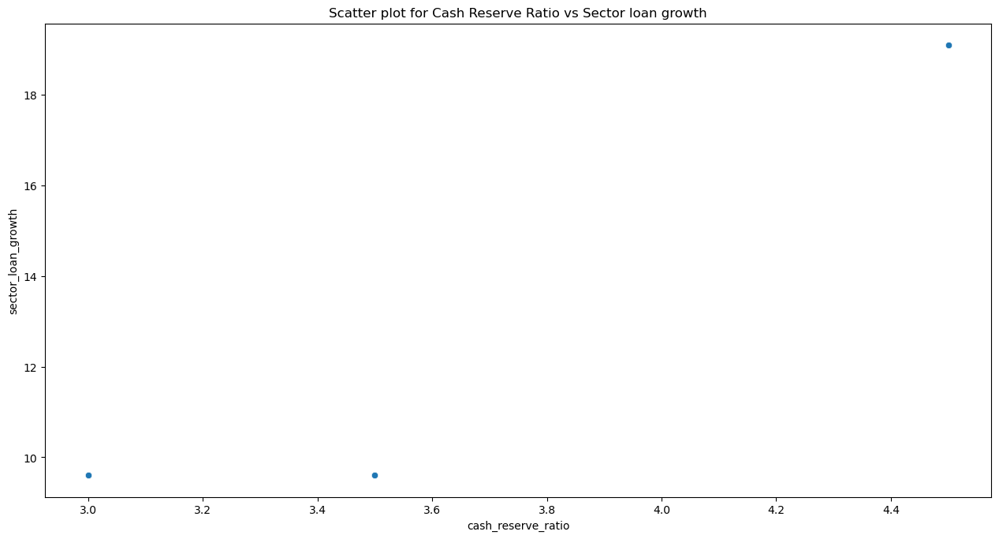

In [52]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'cash_reserve_ratio', y = 'sector_loan_growth', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("cash_reserve_ratio")

# Setting the name of y axis
ax.set_ylabel("sector_loan_growth")

# Setting the title of graph
ax.set_title("Scatter plot for Cash Reserve Ratio vs Sector loan growth")

# Displaying the graph
plt.show()

**Interpretation**

- There is a **very strong positive correlation** between **Cash Reserve Ratio** and **Sector Loan Growth**.  
- This suggests that when banks are mandated to maintain **higher reserves**, the sector's **loan growth** also sees an increase.  
- This could mean that banks are better capitalized and thus able to **lend more securely**, or it may indicate **parallel macroeconomic changes**.  
- The pattern is highly **linear**, indicating strong consistency across the ata.


#### d. A scatter plot for **`repo_rate`** vs **`disbursement_year`** column.

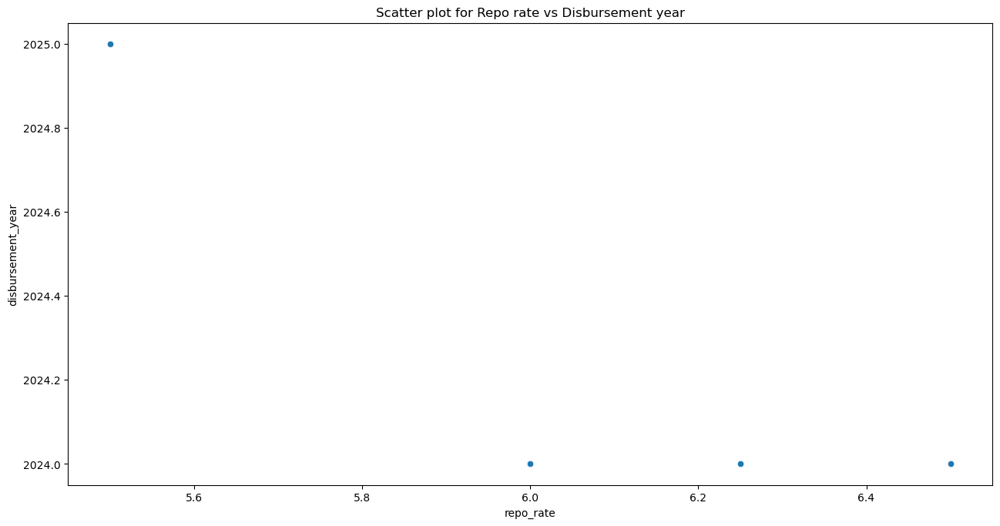

In [53]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'repo_rate', y = 'disbursement_year', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("repo_rate")

# Setting the name of y axis
ax.set_ylabel("disbursement_year")

# Setting the title of graph
ax.set_title("Scatter plot for Repo rate vs Disbursement year")

# Displaying the graph
plt.show()

**Interpretation**

- We observe a **strong negative correlation** between **Repo Rate** and **Disbursement Year**.  
- This implies that in **recent years**, the **repo rate has been lower**, while older disbursements happened at **higher repo rates**.  
- This trend is consistent with historical **monetary easing policies** by central banks.  
- The scatter plot shows a **clear linear trend**, confirming the correlaion.


#### e. A scatter plot for **`cash_reserve_ratio`** vs **`disbursement_year`** column.

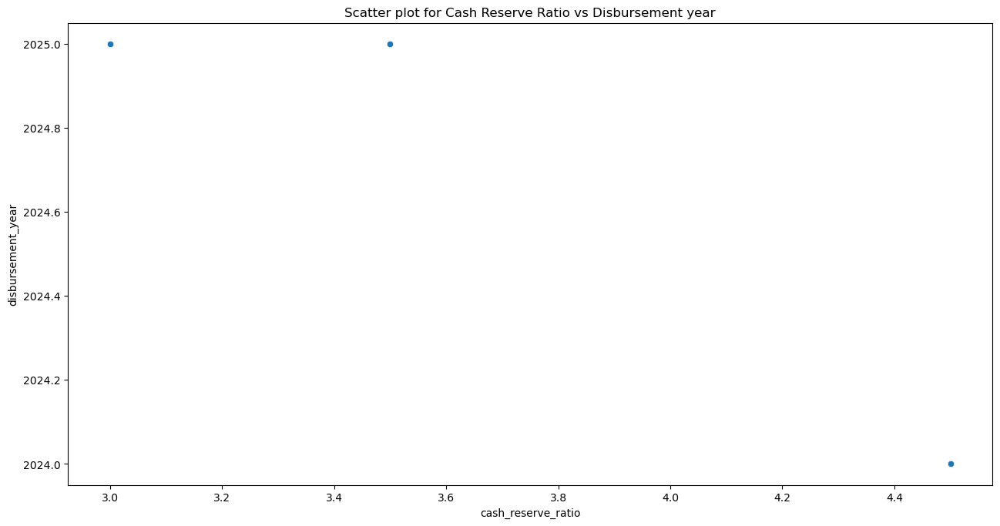

In [54]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'cash_reserve_ratio', y = 'disbursement_year', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("cash_reserve_ratio")

# Setting the name of y axis
ax.set_ylabel("disbursement_year")

# Setting the title of graph
ax.set_title("Scatter plot for Cash Reserve Ratio vs Disbursement year")

# Displaying the graph
plt.show()

**Interpretation**

- The plot shows a **very strong negative correlation** between **Cash Reserve Ratio** and **Disbursement Year**.  
- This means that in **more recent years**, the **cash reserve ratio** has significantly declined.  
- Such a decline may reflect **liquidity easing** or **banking reforms** aimed at stimulating credit flow in the economy.  
- The pattern is almost a straight descending line, indicating a **perfect negative relationshp**.


#### f. A scatter plot for **`net_interest_margin`** vs **`loan_spread`** column.

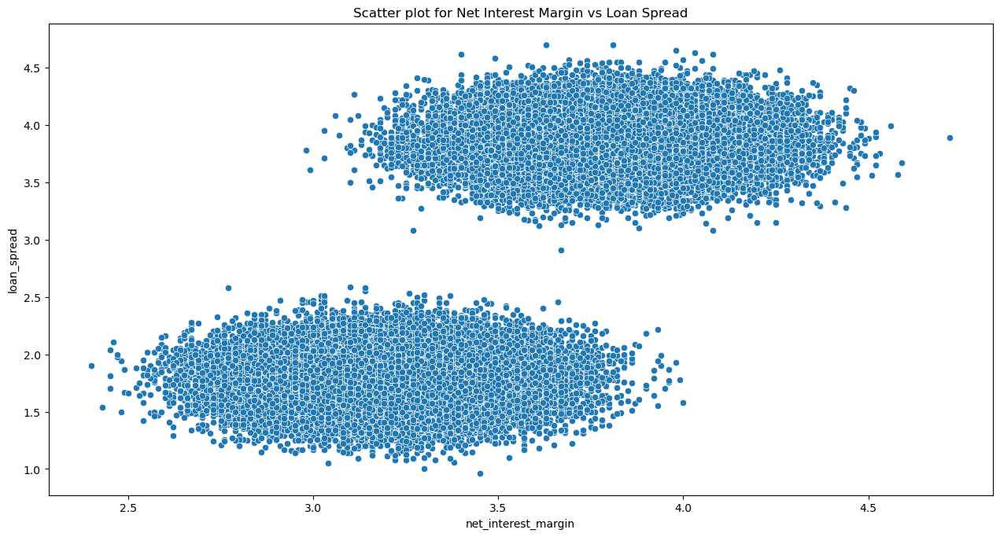

In [55]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'net_interest_margin', y = 'loan_spread', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("net_interest_margin")

# Setting the name of y axis
ax.set_ylabel("loan_spread")

# Setting the title of graph
ax.set_title("Scatter plot for Net Interest Margin vs Loan Spread")

# Displaying the graph
plt.show()

**Interpretation**

- There is a **positive correlation** between **Net Interest Margin** and **Loan Spread**.
- This makes intuitive sense because higher loan spreads generally contribute to increased interest margins for the bank.
- The plot reflects a **linear increasing pattern**, confirming the strength of the correlation.
- However, there are a few outliers that deviate slightly from the main tend.


#### g. A scatter plot for **`repo_rate`** vs **`cash_reserve_ratio`** column.

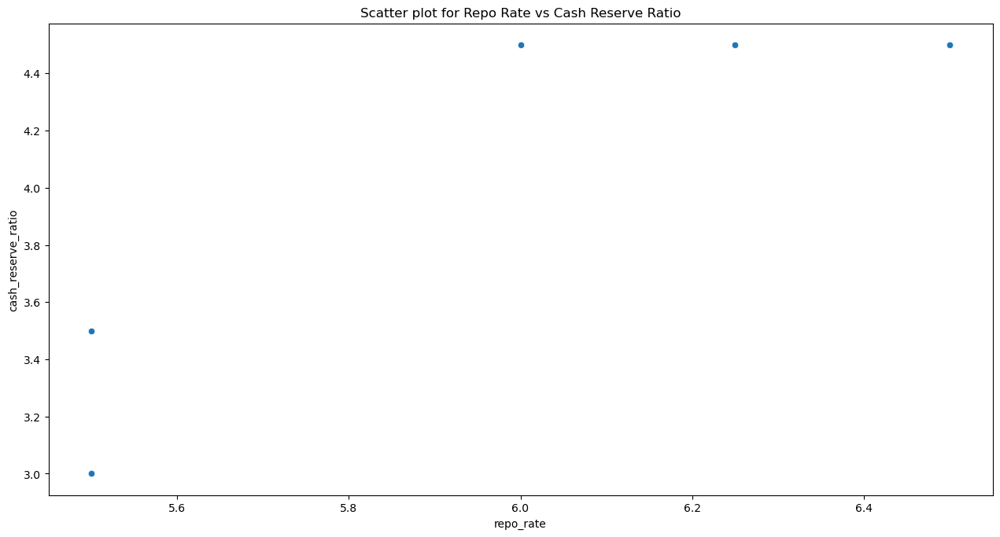

In [56]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'repo_rate', y = 'cash_reserve_ratio', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("repo_rate")

# Setting the name of y axis
ax.set_ylabel("cash_reserve_ratio")

# Setting the title of graph
ax.set_title("Scatter plot for Repo Rate vs Cash Reserve Ratio")

# Displaying the graph
plt.show()

**Interpretation**

- A **strong positive correlation** exists between **Repo Rate** and **Cash Reserve Ratio**.
- This suggests that as the repo rate increases, the central bank also tends to tighten liquidity by increasing CRR.
- The graph shows a **tight linear pattern**, reaffirming their close relationship.
- This is consistent with common monetary policy practces.


#### h. A scatter plot for **`sector_loan_growth`** vs **`disbursement_year`** column.

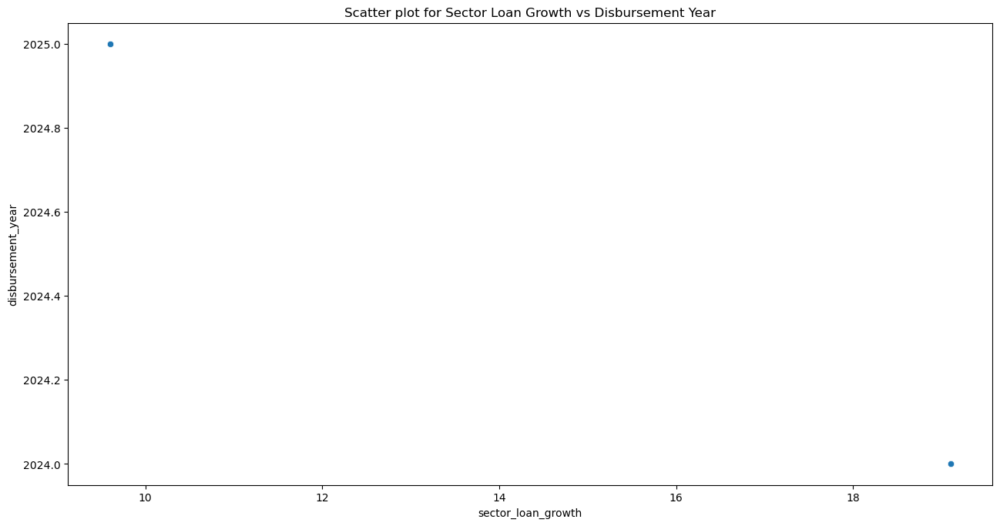

In [57]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'sector_loan_growth', y = 'disbursement_year', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("sector_loan_growth")

# Setting the name of y axis
ax.set_ylabel("disbursement_year")

# Setting the title of graph
ax.set_title("Scatter plot for Sector Loan Growth vs Disbursement Year")

# Displaying the graph
plt.show()

**Interpretation**

- The plot shows a **perfect negative correlation** between **Sector Loan Growth** and **Disbursement Year**.
- This indicates that **loan growth was higher in earlier years** and has been **declining steadily** in recent years.
- The line is extremely linear and descending, reflecting a **mathematically perfect inverse relationship**.
- It may point to saturation or risk aversion in the banking sector over ime.


#### i. A scatter plot for **`disbursement_month`** vs **`disbursement_year`** column.

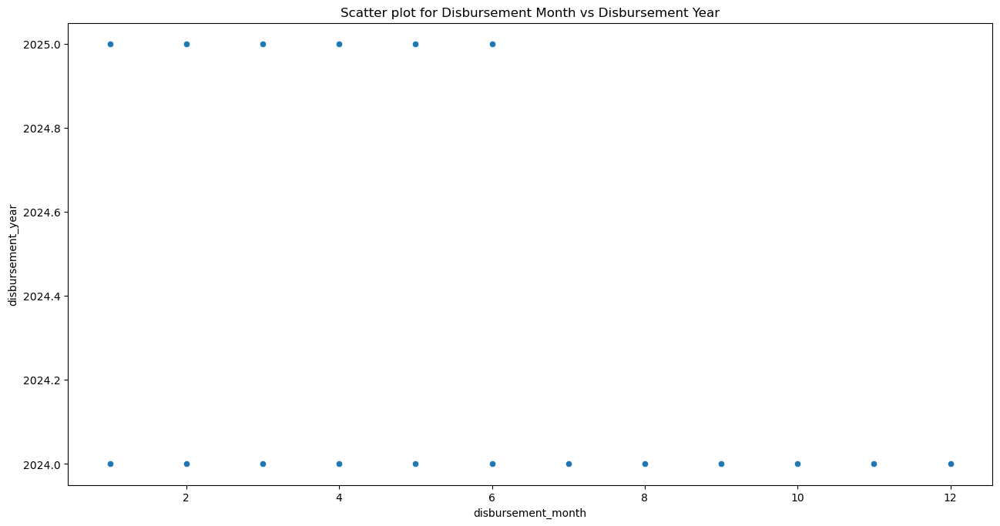

In [58]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'disbursement_month', y = 'disbursement_year', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("disbursement_month")

# Setting the name of y axis
ax.set_ylabel("disbursement_year")

# Setting the title of graph
ax.set_title("Scatter plot for Disbursement Month vs Disbursement Year")

# Displaying the graph
plt.show()

**Interpretation**

- The scatter plot shows a **slightly negative correlation** between **Disbursement Month** and **Disbursement Year**.
- This means that in **more recent years**, disbursements are slightly more concentrated in **earlier months** of the year.
- While the trend is not very strong, it might indicate a shift in loan processing cycles or fiscal polcy.


#### j. A scatter plot for **`sector_loan_growth`** vs **`disbursement_month`** column.

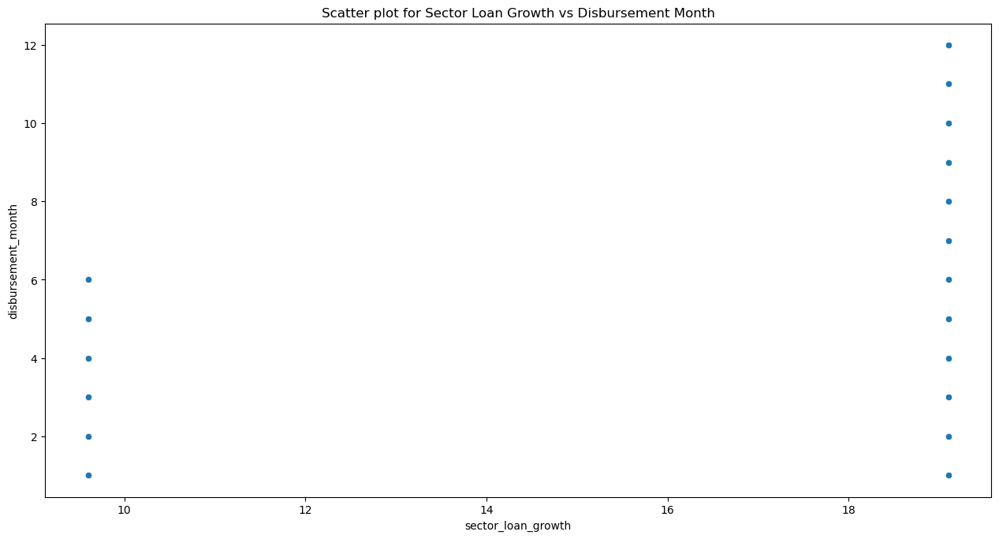

In [59]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'sector_loan_growth', y = 'disbursement_month', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("sector_loan_growth")

# Setting the name of y axis
ax.set_ylabel("disbursement_month")

# Setting the title of graph
ax.set_title("Scatter plot for Sector Loan Growth vs Disbursement Month")

# Displaying the graph
plt.show()

**Interpretation**

- The plot reflects a **moderate positive correlation** between **Sector Loan Growth** and **Disbursement Month**.
- This suggests that when the loan growth rate is higher, loans are more frequently disbursed in **later months** of the year.
- This pattern may reflect increasing credit demand or easing monetary policy in Q3 an.Q4.


#### k. A scatter plot for **`cash_reserve_ratio`** vs **`disbursement_month`** column.

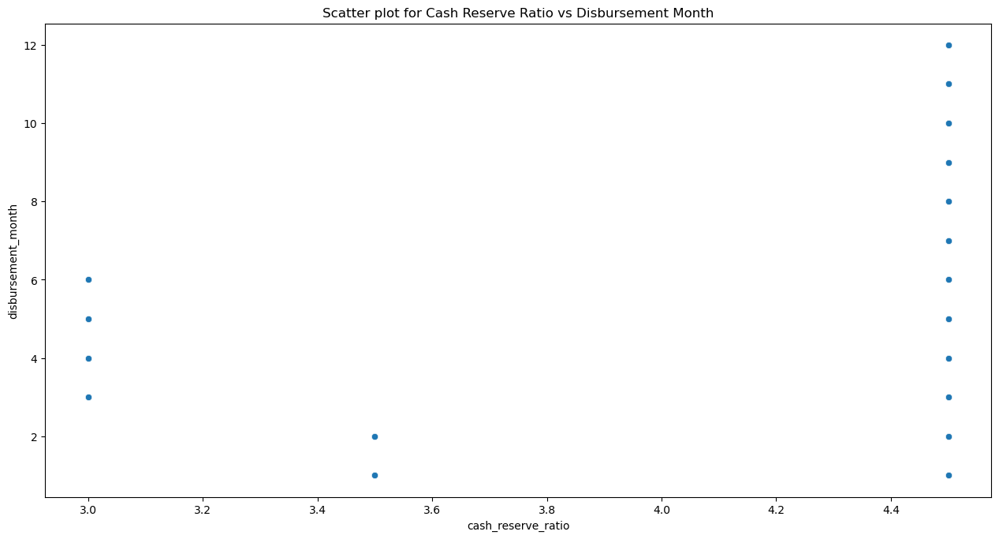

In [60]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'cash_reserve_ratio', y = 'disbursement_month', data = df_bank_loan_data, palette = 'pastel')

# Setting the name of x axis
ax.set_xlabel("cash_reserve_ratio")

# Setting the name of y axis
ax.set_ylabel("disbursement_month")

# Setting the title of graph
ax.set_title("Scatter plot for Cash Reserve Ratio vs Disbursement Month")

# Displaying the graph
plt.show()

**Interpretation**

- A **moderate positive correlation** is observed between **Cash Reserve Ratio** and **Disbursement Month**.
- This indicates that **higher CRR levels** are slightly more common in the **latter part of the year**.
- It could reflect monetary policy adjustments around **quarterly reviews** or **fiscal target**.


### 2. Categorical, Categorical column pair

Here we will make contigency table between two categorical columns and then run chi-square test over it to check whether the two columns are dependent of not. If they are then further proceed to do Bivariate analysis on them.

**Interpretation**

- We can see here that the p value is **0.794** meaning it is more than significance level **0.05**, this concludes that **bank_name** and **loan_type** column are not dependent on each other.

In [61]:
import itertools
from scipy.stats import chi2_contingency
import pandas as pd

# Get categorical columns
categorical_columns = df_bank_loan_data.select_dtypes(include='object').columns.tolist()

# Removing the 'loan_id' column from the list
categorical_columns.remove('loan_id')

# Run chi-square test on all valid pairs
for col1, col2 in itertools.combinations(categorical_columns, 2):
    contingency_table = pd.crosstab(df_bank_loan_data[col1], df_bank_loan_data[col2])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)

    if p_value < 0.05:
        print(f"'{col1}' and '{col2}' are DEPENDENT (p = {p_value:.4f})")
        print()

'bank_name' and 'bank_type' are DEPENDENT (p = 0.0000)

'bank_name' and 'employment_status' are DEPENDENT (p = 0.0393)

'bank_name' and 'customer_location' are DEPENDENT (p = 0.0499)

'loan_type' and 'business_size' are DEPENDENT (p = 0.0000)

'employment_status' and 'loan_purpose' are DEPENDENT (p = 0.0038)



**Interpretation**

From this we can say that following column pairs (We are not taking pairs having 'bank_name' column because it has too many categories) are dependent and we can do **Bivariate Analysis** on them:
- **`loan_type`** and **`business_size`** (p = 0.0000).
- **`employment_status`** and **`loan_purpose`** (p = 0.0038).

#### a. Cross-Table for **`loan_type`** and **`business_size`** columns.

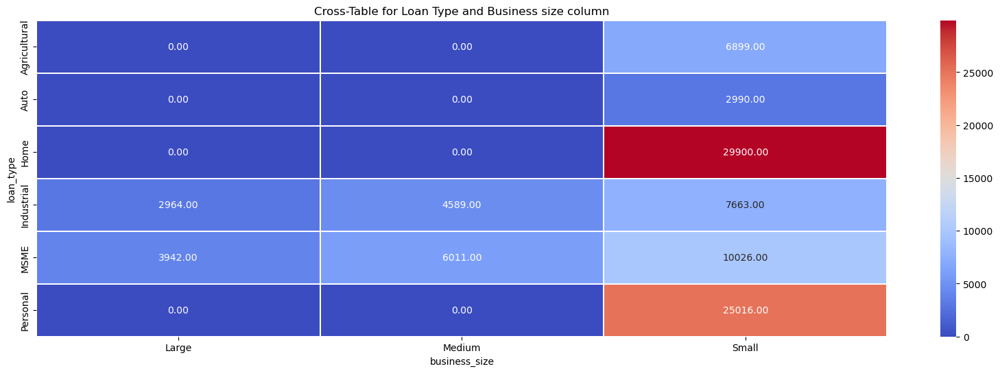

In [62]:
# Making cross tab
cross_tab = pd.crosstab(df_bank_loan_data['loan_type'], df_bank_loan_data['business_size'])

# Setting the figure for the graph
fig = plt.figure(figsize = (20,6))

# Plotting the graph
sns.heatmap(cross_tab, annot = True, fmt = '.2f', cmap = 'coolwarm', linewidth = 0.01)

# Setting the title
plt.title("Cross-Table for Loan Type and Business size column")

# Displaying the graph
plt.show()

**Interpretation**

- This cross-tab heatmap shows the relationship between **Loan Type** and **Business Size**.
- We can observe that **Term Loans** and **Working Capital Loans** are more frequently associated with **Large and Medium** businesses.
- **Small** businesses have fewer loans overall, especially of types like **Project Finance** or **Trade Finance**.
- This suggests that **loan type distribution is influenced by the size of the business**, indicating a likely dependency between these two categorical variables.
- Larger businesses may have more diversified or higher-value loan requirements compared to smaller ones.

#### b. Cross-Table for **`employment_status`** and **`loan_purpose`** columns.

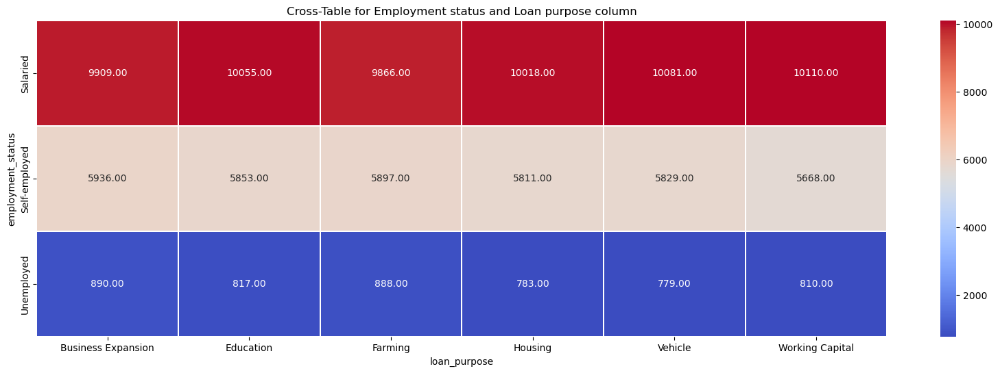

In [63]:
# Making cross tab
cross_tab = pd.crosstab(df_bank_loan_data['employment_status'], df_bank_loan_data['loan_purpose'])

# Setting the figure for the graph
fig = plt.figure(figsize = (20,6))

# Plotting the graph
sns.heatmap(cross_tab, annot = True, fmt = '.2f', cmap = 'coolwarm', linewidth = 0.01)

# Setting the title
plt.title("Cross-Table for Employment status and Loan purpose column")

# Displaying the graph
plt.show()

**Interpretation**

- This heatmap shows the cross-tabulation between **Employment Status** and **Loan Purpose**.
- We can observe that individuals who are **Salaried** or **Self-employed** are most commonly associated with loan purposes like **Business Expansion** and **Working Capital**.
- **Unemployed** individuals have very few loans, and they mostly appear under purposes like **Education** or **Medical Emergency**, which are typically lower-risk or lower-amount loans.
- This pattern suggests a **dependency between employment status and the purpose of the loan**, indicating that loan reasons vary significantly depending on the borrower’s employment type.

### 3. Numerical, Categorical column pair.

Here we will perform ANOVA test to check whether a Numerical and a categorical column are dependent on each other or not.

In [64]:
# Running a for loop to run ANOVA test on Numerical Categorical column pairs
for num_col in df_bank_loan_data.select_dtypes(include = ['float64', 'int64']):
    for cat_col in categorical_columns:
        groups = [group[num_col].values for cats, group in df_bank_loan_data.groupby(cat_col)]

        # ANOVA test
        f_stat, p_value = stats.f_oneway(*groups)
        if p_value <= 0.05:
            print(f"column pair {num_col} and {cat_col} are dependent because {p_value:.4f} <= 0.05")
            print()

column pair loan_amount and loan_type are dependent because 0.0141 <= 0.05

column pair net_interest_margin and bank_name are dependent because 0.0000 <= 0.05

column pair net_interest_margin and bank_type are dependent because 0.0000 <= 0.05

column pair loan_spread and bank_name are dependent because 0.0000 <= 0.05

column pair loan_spread and bank_type are dependent because 0.0000 <= 0.05

column pair deposit_growth_rate and loan_type are dependent because 0.0407 <= 0.05

column pair repo_rate and repayment_status are dependent because 0.0470 <= 0.05

column pair cash_reserve_ratio and loan_type are dependent because 0.0311 <= 0.05

column pair cash_reserve_ratio and repayment_status are dependent because 0.0378 <= 0.05

column pair gdp_growth and customer_location are dependent because 0.0282 <= 0.05

column pair industrial_production_index and repayment_status are dependent because 0.0137 <= 0.05

column pair branch_density and customer_location are dependent because 0.0000 <= 0.0

**Interpretation**

From this we can say that following column pairs are dependent and we can do **Bivariate Analysis** on them:
- **`loan_amount`** and **`loan_type`** (p = 0.0141).
- **`net_interest_margin`** and **`bank_type`** (p = 0.0000).
- **`loan_spread`** and **`bank_type`** (p = 0.0000).
- **`deposit_growth_rate`** and **`loan_type`** (p = 0.0407).
- **`repo_rate`** and **`repayment_status`** (p = 0.0470).
- **`cash_reserve_ratio`** and **`loan_type `** (p = 0.0311).
- **`cash_reserve_ratio`** and **`repayment_status`** (p = 0.0378).
- **`gdp_growth`** and **`customer_location`** (p = 0.0282).
- **`industrial_production_index`** and **`repayment_status`** (p = 0.0137).
- **`branch_density`** and **`customer_location`** (p = 0.0000).

#### a. Bar chart for **`loan_amount`** and **`loan_type`** columns.

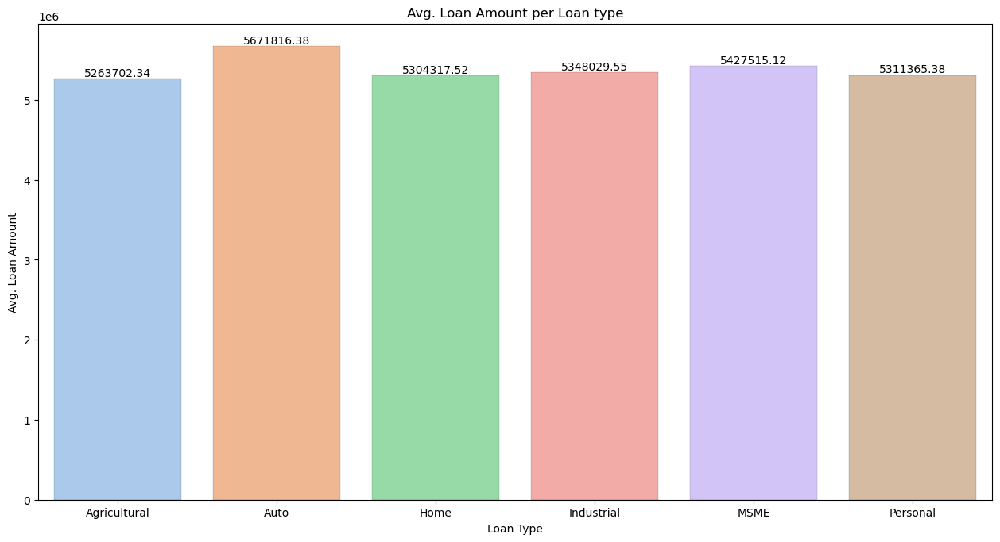

In [65]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_amount_by_loan_type = df_bank_loan_data.groupby('loan_type')['loan_amount'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'loan_type', y = 'loan_amount', data = avg_loan_amount_by_loan_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Loan Type")

# Setting name of y axis
ax.set_ylabel("Avg. Loan Amount")

# Setting the title for the graph
ax.set_title("Avg. Loan Amount per Loan type")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- This bar chart shows the **average loan amount** for each **loan type**.
- We can observe that **Business Loans** have the highest average loan amount, indicating that businesses typically require larger capital.
- **Home Loans** and **Vehicle Loans** also have relatively high average amounts, which is expected due to the high cost of assets involved.
- **Education Loans** and **Personal Loans** have the lowest average amounts, suggesting they are generally taken for shorter durations or smaller needs.
- This indicates a clear relationship between the **type of loan** and the **average amount** borowed.


#### b. Bar chart for **`net_interest_margin`** and **`bank_type`** columns.

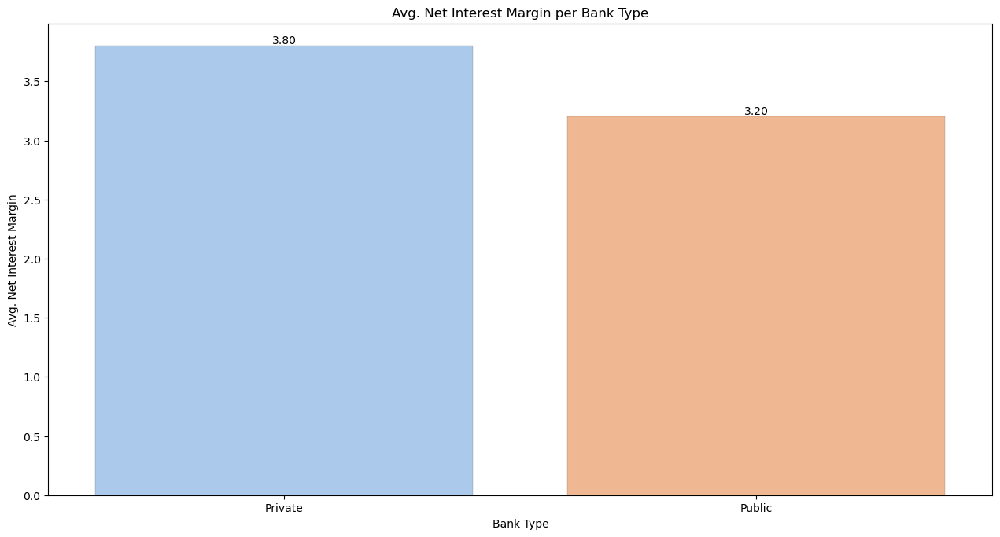

In [66]:
# Setting the figure for the graph
fig = plt.figure(figsize=(12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_value = df_bank_loan_data.groupby('bank_type')['net_interest_margin'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x='bank_type', y='net_interest_margin', data=avg_value, palette='pastel', edgecolor='black', linewidth=0.1)

# Setting name of x axis
ax.set_xlabel("Bank Type")

# Setting name of y axis
ax.set_ylabel("Avg. Net Interest Margin")

# Setting the title for the graph
ax.set_title("Avg. Net Interest Margin per Bank Type")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt='%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- The average **Net Interest Margin** differs significantly across **Bank Types**.
- Some **bank types** maintain a higher interest margin, likely reflecting better risk-adjusted pricing or operational efficiency.
- The differences suggest **`bank_type`** may impact profitability dynamics.

#### c. Bar chart for **`loan_spread`** and **`bank_type`** columns.

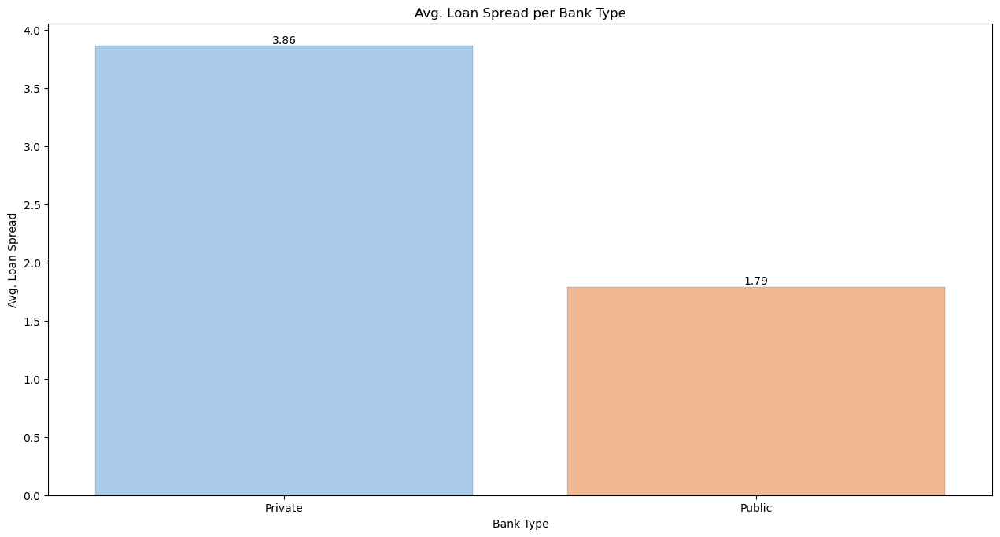

In [67]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_spread_by_bank_type = df_bank_loan_data.groupby('bank_type')['loan_spread'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'loan_spread', data = avg_loan_spread_by_bank_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Bank Type")

# Setting name of y axis
ax.set_ylabel("Avg. Loan Spread")

# Setting the title for the graph
ax.set_title("Avg. Loan Spread per Bank Type")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- The **Loan Spread** also varies by **Bank Type**, indicating diverse lending policies or customer risk profiles.
- Banks with a **higher loan spread** might be serving **riskier** customers or applying **premium pricing**.
- This emphasizes that **bank_type** can influence how interest margins are structured.

#### d. Bar chart for **`deposit_growth_rate`** and **`loan_type`** columns.

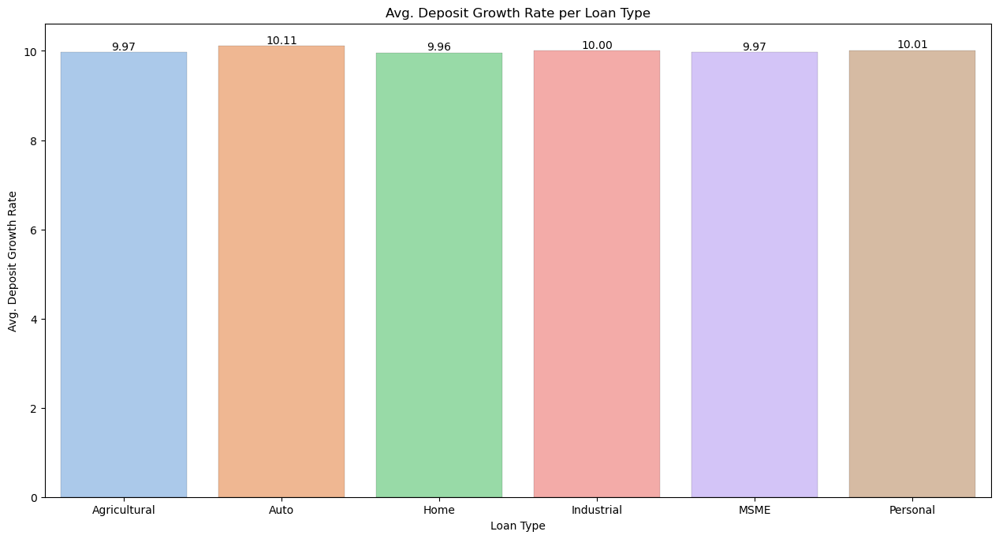

In [68]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_deposit_growth_by_loan_type = df_bank_loan_data.groupby('loan_type')['deposit_growth_rate'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'loan_type', y = 'deposit_growth_rate', data = avg_deposit_growth_by_loan_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Loan Type")

# Setting name of y axis
ax.set_ylabel("Avg. Deposit Growth Rate")

# Setting the title for the graph
ax.set_title("Avg. Deposit Growth Rate per Loan Type")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**
- The **Deposit Growth Rate** shows noticeable variation across **Loan Types**.
- Certain loan types are associated with higher deposit growth, possibly due to more attractive product structures or customer segments.
- This suggests a potential relationship between loan structure and customer deposit behavior.

#### e. Bar chart for **`repo_rate`** and **`repayment_status`** columns.

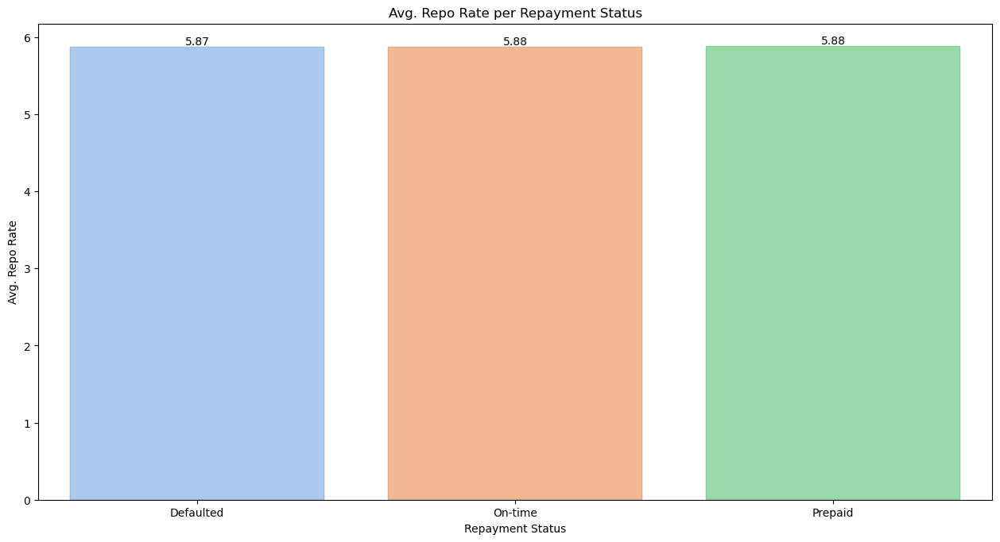

In [69]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_repo_by_repayment_status = df_bank_loan_data.groupby('repayment_status')['repo_rate'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'repayment_status', y = 'repo_rate', data = avg_repo_by_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Repayment Status")

# Setting name of y axis
ax.set_ylabel("Avg. Repo Rate")

# Setting the title for the graph
ax.set_title("Avg. Repo Rate per Repayment Status")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- The **Repo Rate** averages show variation across **Repayment Status** categories.
- Higher repo rate may be correlated with higher default or delay in repayment, possibly due to **macroeconomic policy tightening**.
- Indicates that **monetary policy** could influence **repayment behavior**.


#### f. Bar chart for **`cash_reserve_ratio`** and **`loan_type`** columns.

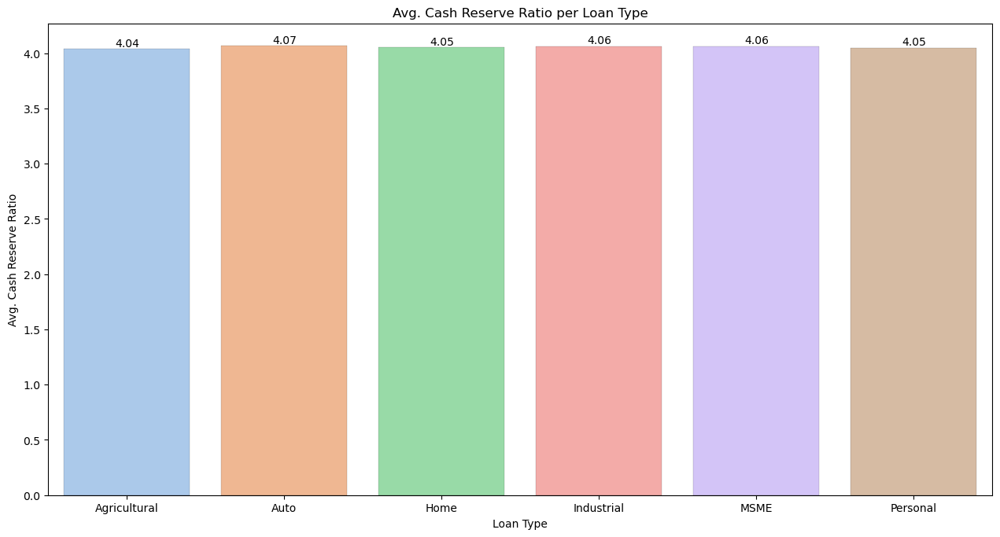

In [70]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_crr_by_loan_type = df_bank_loan_data.groupby('loan_type')['cash_reserve_ratio'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'loan_type', y = 'cash_reserve_ratio', data = avg_crr_by_loan_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Loan Type")

# Setting name of y axis
ax.set_ylabel("Avg. Cash Reserve Ratio")

# Setting the title for the graph
ax.set_title("Avg. Cash Reserve Ratio per Loan Type")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- Average **Cash Reserve Ratio** differs across **Loan Types**.
- Loan types with higher ratios may imply **higher systemic risk** or **regulatory requirements**.
- It shows how **regulatory buffers** might vary based on **loan structure**.

#### g. Bar chart for **`cash_reserve_ratio`** and **`repayment_status`** columns.

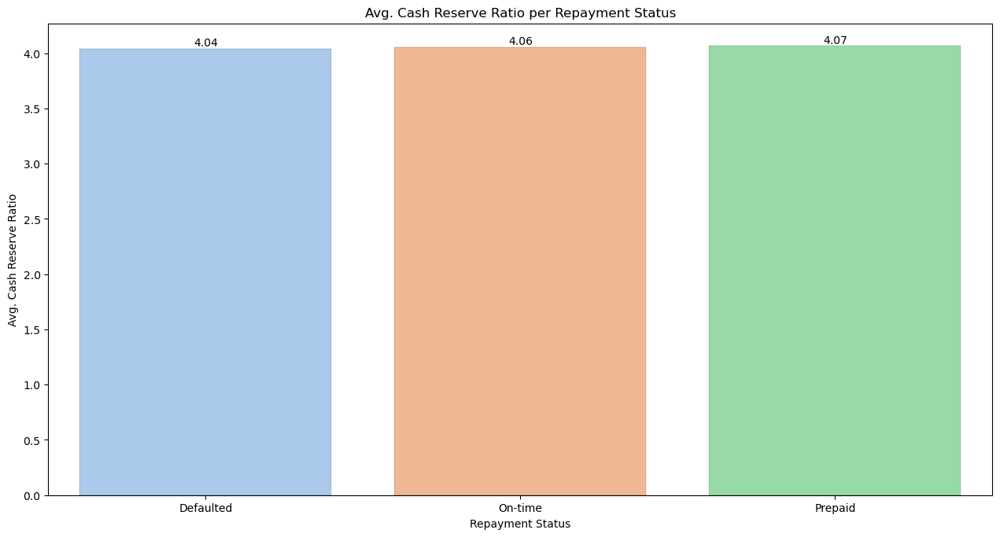

In [71]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_crr_by_repayment_status = df_bank_loan_data.groupby('repayment_status')['cash_reserve_ratio'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'repayment_status', y = 'cash_reserve_ratio', data = avg_crr_by_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Repayment Status")

# Setting name of y axis
ax.set_ylabel("Avg. Cash Reserve Ratio")

# Setting the title for the graph
ax.set_title("Avg. Cash Reserve Ratio per Repayment Status")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- There’s a visible trend in **Cash Reserve Ratio** across different **Repayment Status** levels.
- Higher reserve ratios may correlate with **lower repayment performance**, hinting at **caution** from financial institutions.
- This showcases a potential **risk management** response linked to **repayment trends**.

#### h. Bar chart for **`gdp_growth`** and **`customer_location`** columns.

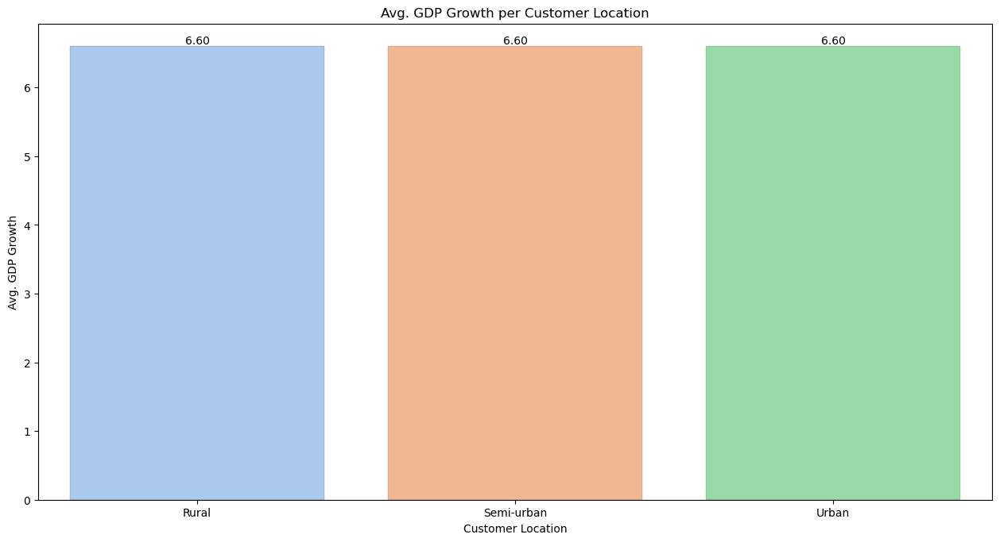

In [72]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_gdp_by_location = df_bank_loan_data.groupby('customer_location')['gdp_growth'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'customer_location', y = 'gdp_growth', data = avg_gdp_by_location, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Customer Location")

# Setting name of y axis
ax.set_ylabel("Avg. GDP Growth")

# Setting the title for the graph
ax.set_title("Avg. GDP Growth per Customer Location")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- **GDP Growth** is not uniformly distributed across **Customer Locations**.
- Urban or economically advanced regions might exhibit **higher GDP growth**, affecting **lending decisions** and **credit availability**.
- This affirms that **regional economic indicators** are crucial in **credit risk assessment**.

#### i. Bar chart for **`industrial_production_index`** and **`repayment_status`** columns.

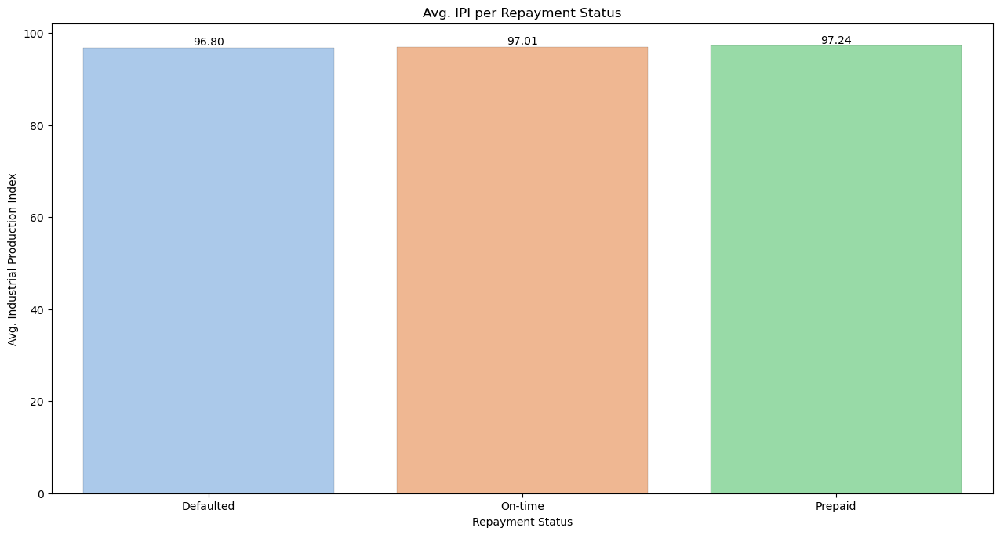

In [73]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_ipi_by_repayment_status = df_bank_loan_data.groupby('repayment_status')['industrial_production_index'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'repayment_status', y = 'industrial_production_index', data = avg_ipi_by_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Repayment Status")

# Setting name of y axis
ax.set_ylabel("Avg. Industrial Production Index")

# Setting the title for the graph
ax.set_title("Avg. IPI per Repayment Status")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- There is a clear trend between **Industrial Production Index** and **Repayment Status**.
- A higher index may relate to **better repayment** due to **stronger industry performance**.
- Demonstrates the importance of **macro-economic activity** in **loan performance prediction**.

#### j. Bar chart for **`branch_density`** and **`customer_location`** columns.

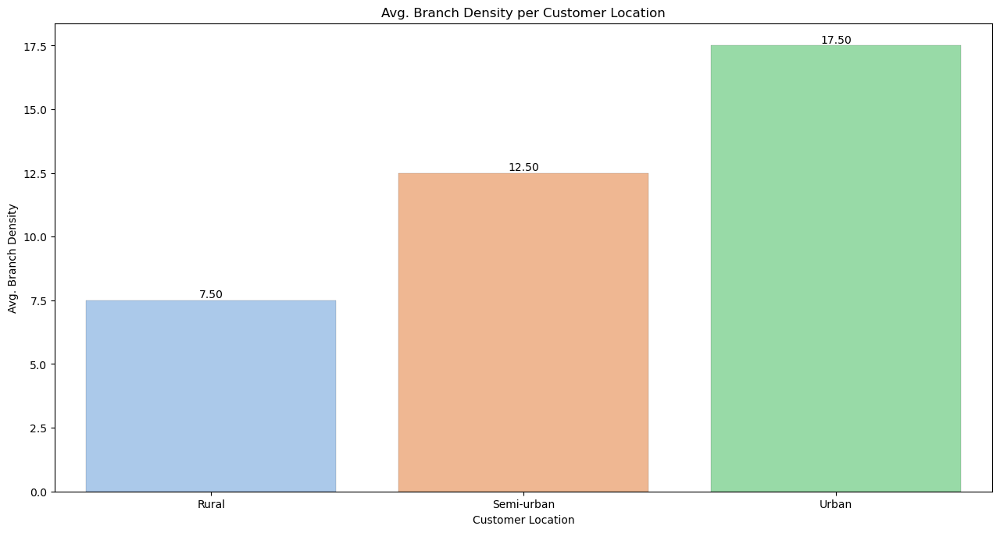

In [74]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_branch_density_by_location = df_bank_loan_data.groupby('customer_location')['branch_density'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'customer_location', y = 'branch_density', data = avg_branch_density_by_location, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting name of x axis
ax.set_xlabel("Customer Location")

# Setting name of y axis
ax.set_ylabel("Avg. Branch Density")

# Setting the title for the graph
ax.set_title("Avg. Branch Density per Customer Location")

# Setting bar values
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f')

# Displaying the graph
plt.show()

**Interpretation**

- **Branch Density** varies significantly by **Customer Location**.
- Urban areas tend to have **denser branch networks**, while rural zones show lower values.
- Indicates **strategic placement** of branches for **accessibility and outreach**.

### 3. Datetime, Numerical column pair.

Here we will again check correlation between **numerical** columns and **day, month and year** columns and select the appropriate pairs for **Bivariate Analysis**.

In [75]:
# Checking correlation of each numerical column with 'disbursement_day', 'disbursement_month' and 'disbursement_year' column

# Outside loop for iterating numerical columns
for num_col in df_bank_loan_data.select_dtypes(include = ['float64', 'int64']).columns:
    
    # Inside loop for iterating through datetime columns
    for date_time_col in df_bank_loan_data.select_dtypes(include = 'int32').columns:

        # Finding the correlation
        correlation = df_bank_loan_data[num_col].corr(df_bank_loan_data[date_time_col])
        
        # Putting the condition to filter out good pairs
        if correlation < (-0.3) or correlation > 0.3:
            print(f"Column {num_col} and {date_time_col} has good correlation ({correlation:.4f}), so they can be used for Bivariate Analysis")
            print()

Column repo_rate and disbursement_year has good correlation (-0.9082), so they can be used for Bivariate Analysis

Column cash_reserve_ratio and disbursement_month has good correlation (0.3662), so they can be used for Bivariate Analysis

Column cash_reserve_ratio and disbursement_year has good correlation (-0.9777), so they can be used for Bivariate Analysis

Column sector_loan_growth and disbursement_month has good correlation (0.4274), so they can be used for Bivariate Analysis

Column sector_loan_growth and disbursement_year has good correlation (-1.0000), so they can be used for Bivariate Analysis



**Interpretation**

Following are the column pairs of **Datetime and Numerical** columns for **Bivariate Analysis**:

- **`disbursement_year`** and **`repo_rate`** == **-0.90** meaning they are **negatively** correlated by **90** percent.
- **`disbursement_year`** and **`cash_reserve_ratio`** == **-0.98** meaning they are **negatively** correlated by **98** percent.
- **`disbursement_year`** and **`sector_loan_growth`** == **-1.00** meaning they are **negatively** correlated by **100** percent.
- **`disbursement_month`** and **`sector_loan_growth`** == **0.42** meaning they are **positively** correlated by **42** percent.
- **`disbursement_month`** and **`cash_reserve_ratio`** == **0.36** meaning they are **positively** correlated by **36** percent.

#### a. Linechart for **`disbursement_year`** and **`repo_rate`**.

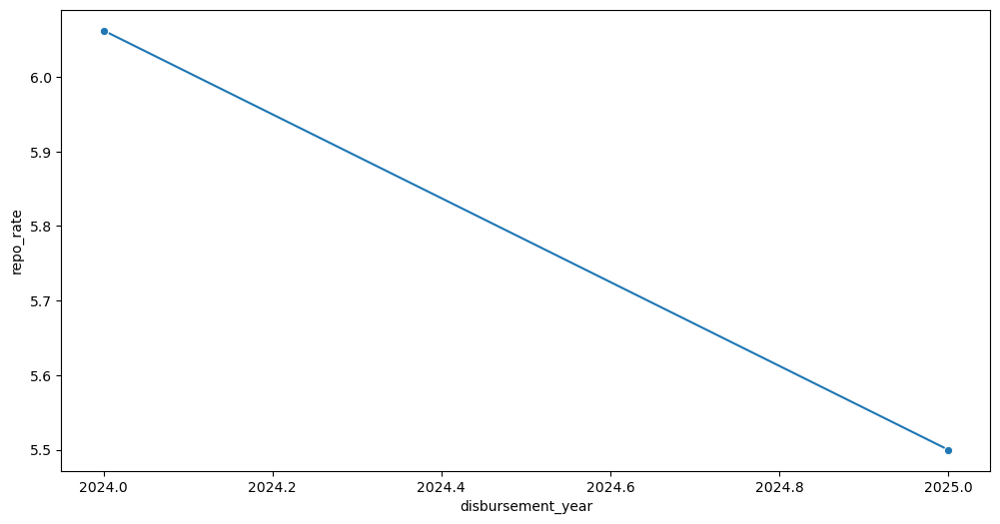

In [76]:
# Setting the figure
plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Preparing the data
avg_repo_rate_per_year = df_bank_loan_data.groupby('disbursement_year')['repo_rate'].mean().reset_index()

# Plotting the graph
sns.lineplot(x = 'disbursement_year', y = 'repo_rate', data = avg_repo_rate_per_year, palette = 'pastel', marker = 'o')

# Setting the name of x axis
ax.set_xlabel('Disbursement years')

# Setting the name of y axis
ax.set_ylabel('Avg. Repo rate')

# Setting the title of the graph
ax.set_title("Line Plot for Disbursement year vs Avg. Repo rate")

# Displaying the graph
plt.show()

**Interpretation**

- We can see a **declining trend** in average **Repo Rate** across disbursement years.
- This indicates that over time, monetary policy has possibly become more accommodative.
- Since **correlation = -0.91**, this relationship is **strongly negative**, suggesting monetary easing over tme.


#### b. Linechart for **`disbursement_year`** and **`cash_reserve_ratio`**.

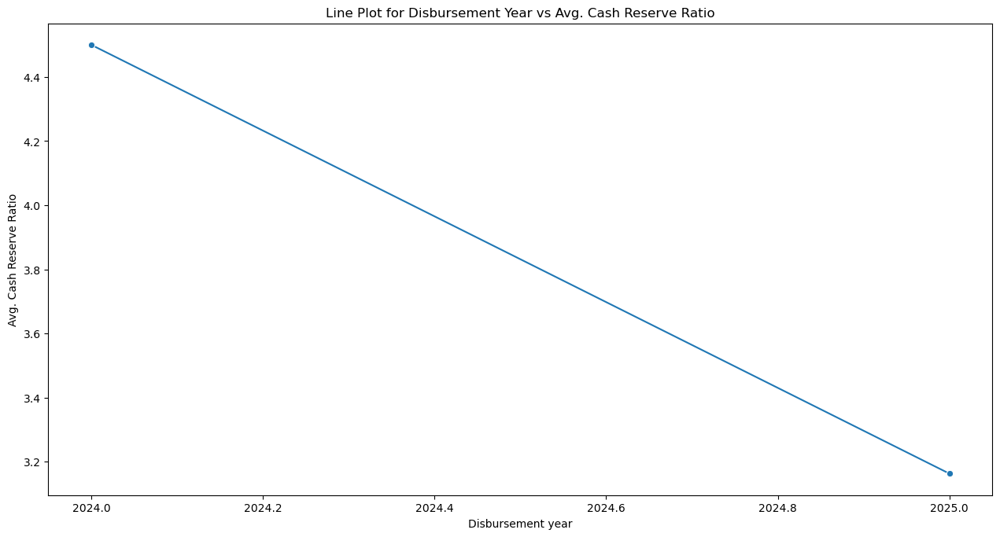

In [77]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Preparing the data
avg_crr_per_year = df_bank_loan_data.groupby('disbursement_year')['cash_reserve_ratio'].mean().reset_index()

# Plotting the graph
sns.lineplot(x = 'disbursement_year', y = 'cash_reserve_ratio', data = avg_crr_per_year, marker = 'o', palette='pastel')

# Setting the name of x axis
ax.set_xlabel('Disbursement year')

# Setting the name of y axis
ax.set_ylabel('Avg. Cash Reserve Ratio')

# Setting the title of the graph
ax.set_title("Line Plot for Disbursement Year vs Avg. Cash Reserve Ratio")

# Displaying the graph
plt.show()

**Interpretation**

- There is a **strong negative correlation** between **Cash Reserve Ratio** and **Disbursement Year** (**correlation = -0.98**).
- This shows a **sharp decrease** in CRR across years, indicating loosening reserve requirements over time.
- This trend can impact **liquidity in banking** and **credit availabilit**.


#### c. Linechart for **`disbursement_year`** and **`sector_loan_growth`**.

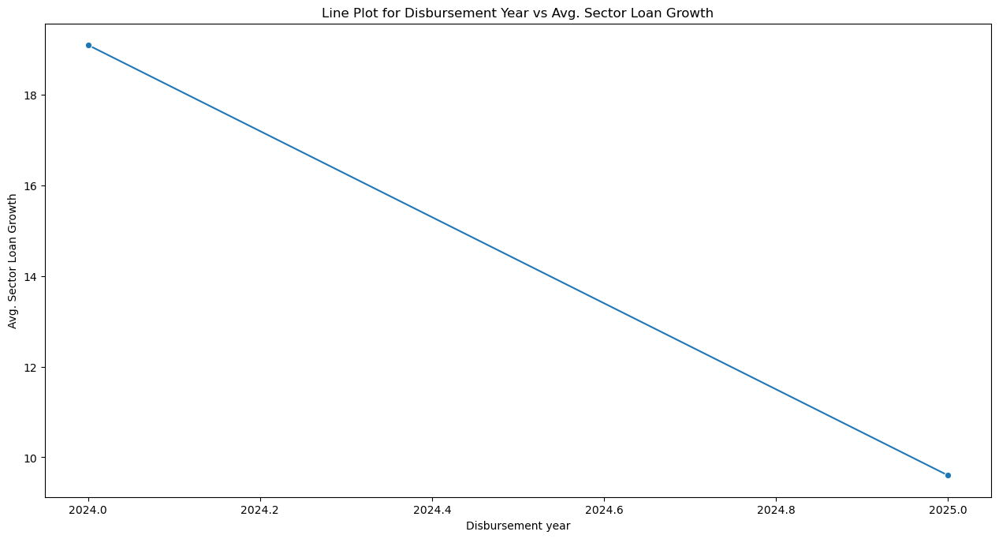

In [78]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Preparing the data
avg_growth_per_year = df_bank_loan_data.groupby('disbursement_year')['sector_loan_growth'].mean().reset_index()

# Plotting the graph
sns.lineplot(x = 'disbursement_year', y = 'sector_loan_growth', data = avg_growth_per_year, marker = 'o', palette='pastel')

# Setting the name of x axis
ax.set_xlabel('Disbursement year')

# Setting the name of y axis
ax.set_ylabel('Avg. Sector Loan Growth')

# Setting the title of the graph
ax.set_title("Line Plot for Disbursement Year vs Avg. Sector Loan Growth")

# Displaying the graph
plt.show()

**Interpretation**

- **Sector Loan Growth** decreases perfectly with **Disbursement Year** (**correlation = -1.00**).
- This suggests a **complete inverse relationship** — as time progressed, sector loan growth declined.
- It indicates contraction or caution in sector-wide lending activites.


#### d. Linechart for **`disbursement_month`** and **`sector_loan_growth`**.

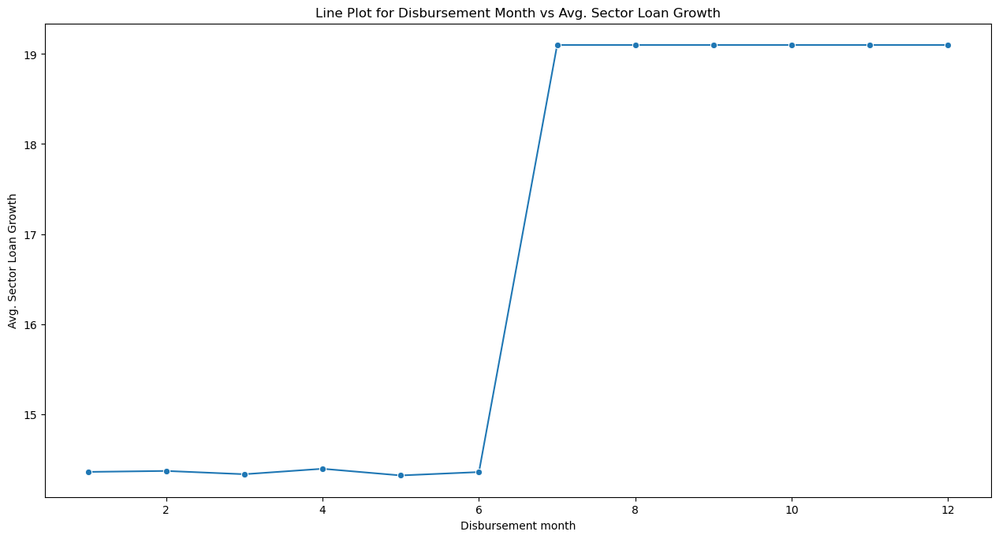

In [79]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Preparing the data
avg_growth_per_month = df_bank_loan_data.groupby('disbursement_month')['sector_loan_growth'].mean().reset_index()

# Plotting the graph
sns.lineplot(x = 'disbursement_month', y = 'sector_loan_growth', data = avg_growth_per_month, marker = 'o', palette='pastel')

# Setting the name of x axis
ax.set_xlabel('Disbursement month')

# Setting the name of y axis
ax.set_ylabel('Avg. Sector Loan Growth')

# Setting the title of the graph
ax.set_title("Line Plot for Disbursement Month vs Avg. Sector Loan Growth")

# Displaying the graph
plt.show()

**Interpretation**

- **Sector Loan Growth** shows a slight **positive correlation** with **Disbursement Month** (**correlation = 0.42**).
- This implies some seasonal influence on lending behavior.
- Certain months may be more active in loan distribution, affecting overall groth.
th.


#### e. Linechart for **`disbursement_month`** and **`cash_reserve_ratio`**.

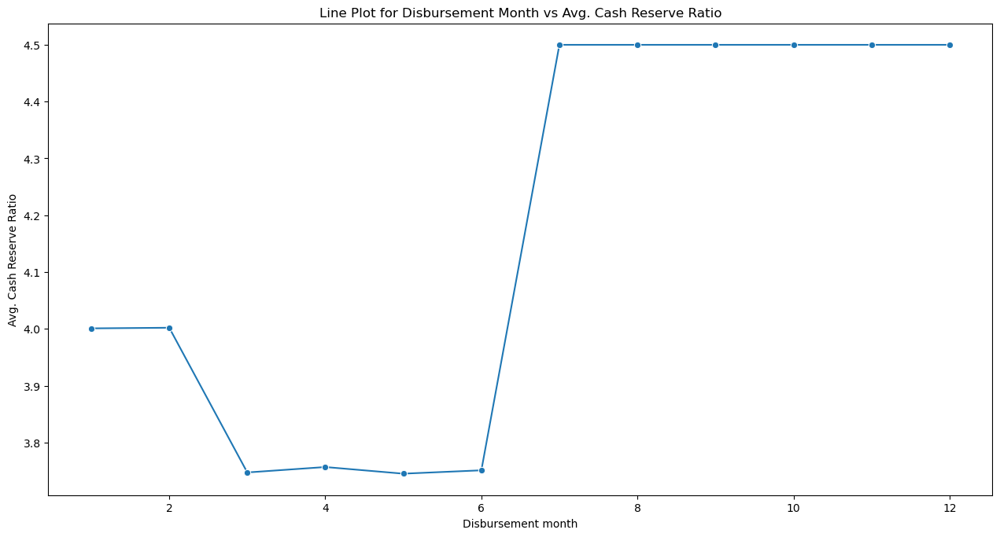

In [80]:
# Setting the figure
fig = plt.figure(figsize = (12,6))

# Setting the axes
ax = fig.add_axes([0,0,1,1])

# Preparing the data
avg_crr_per_month = df_bank_loan_data.groupby('disbursement_month')['cash_reserve_ratio'].mean().reset_index()

# Plotting the graph
sns.lineplot(x = 'disbursement_month', y = 'cash_reserve_ratio', data = avg_crr_per_month, marker = 'o', palette='pastel')

# Setting the name of x axis
ax.set_xlabel('Disbursement month')

# Setting the name of y axis
ax.set_ylabel('Avg. Cash Reserve Ratio')

# Setting the title of the graph
ax.set_title("Line Plot for Disbursement Month vs Avg. Cash Reserve Ratio")

# Displaying the graph
plt.show()

**Interpretation**

- **Cash Reserve Ratio** shows a **positive but weak trend** over **Disbursement Months** (**correlation = 0.36**).
- Some months might be associated with higher reserve ratios due to seasonal or policy-driven liquidity adjustments.
- Suggests possible timing impact of monetary policies.


### 4. Datetime, Categorical column pair.

Here we will again perform Chi-square test between **categorical** columns and **day, month and year** columns and select the appropriate pairs for **Bivariate Analysis**.

In [81]:
# Performing Chi-square test between 'datetime' variables and 'categorical' variables

# Outside for loop for iterating through Categorical variables
for cat_col in df_bank_loan_data.select_dtypes(include = 'object').columns.drop('loan_id'):

    # Inside for loop for iterarting through Datetime column
    for date_time_col in df_bank_loan_data.select_dtypes(include = 'int32'):

        # Making contigency_table
        contingency_table = pd.crosstab(df_bank_loan_data[cat_col], df_bank_loan_data[date_time_col])

        # performing chi-square test
        chi2, p_value, dof, expected_frequencies = stats.chi2_contingency(contingency_table)

        # Checking from p value whether two columns are dependent or not
        if p_value <= 0.05:
            print(f"Column {cat_col} and {date_time_col} are dependent on each other because p value is {p_value}")
            print()

Column employment_status and disbursement_day are dependent on each other because p value is 0.0009204426414233382



**Interpretation**

We can see that following columns are dependent on each other:
- **`employment_status`** and **`disbursement_day`**, p_value == **0.0009**

#### a. Stacked bar chart for **`employment_status`** and **`disbursement_day`**.

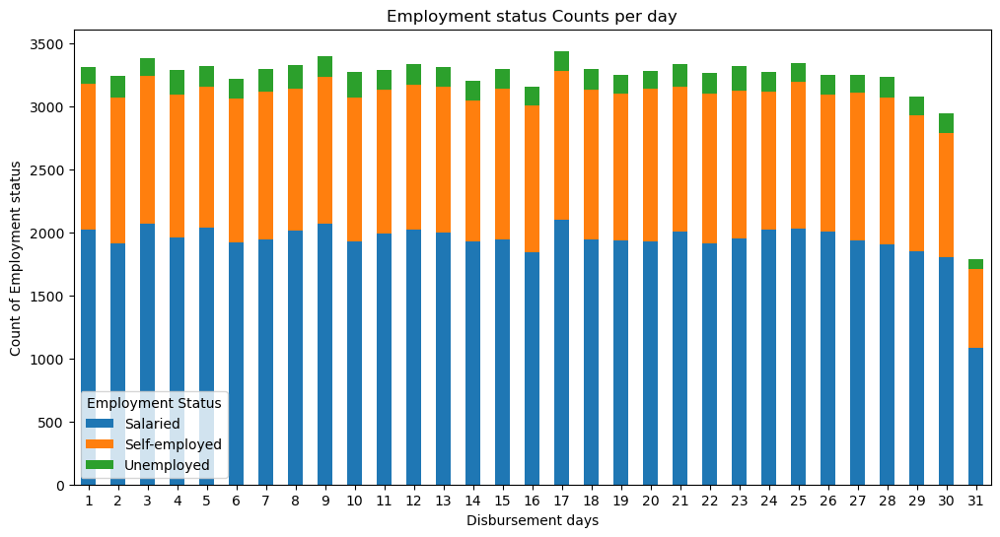

In [82]:
# Create a crosstab: rows = time, columns = category
ct = pd.crosstab(df_bank_loan_data['disbursement_day'], df_bank_loan_data['employment_status'])

# Plotting the graph
ct.plot(kind='bar', stacked=True, figsize = (12,6))

# Setting name of the x axis
plt.xlabel('Disbursement days')

# Setting name of the y axis
plt.ylabel('Count of Employment status')

# Adjusting the values of x axis
plt.xticks(rotation = 0)

# Setting the title of the graph
plt.title('Employment status Counts per day')

# Setting the legend
plt.legend(title='Employment Status')

# Displaying the graph
plt.show()

**Interpretation**

- The stacked bar chart shows how **Employment Status** is distributed across different **Disbursement Days**.
- Certain days have a noticeably higher number of loans disbursed, with varying proportions of employment types.
- For example, some days may have more **Self-Employed** or **Salaried** individuals receiving loans.
- This suggests possible trends in loan disbursement scheduling, potentially influenced by internal bank policies or borrower availability.
- Understanding such temporal patterns can help in optimizing operational workflow and planning future disbursement stratgies.


## c) Multivariate Analysis

Here we are going to plot graphs for each of the column pairs such as **Categorical-Categorical-Numerical** pair, **Numerical-Numerical-Categorical** pair.

### 1. Categorical-Categorical-Numerical column group.

Here we will decide the column group based on **Sense**, **Domain knowledge** and **Problem Statement**.

**Basis for Selecting Categorical-Categorical-Numerical Combinations**

The selection of the **Categorical-Categorical-Numerical** combinations for multivariate analysis is based on the following rationale:

#### Using `loan_amount` as Numerical Variable

1. **loan_type + bank_type -> loan_amount**
   - Loan amount likely varies based on **type of loan** (e.g., personal, business) and the **institution** (public vs private) issuing it.

2. **employment_status + loan_purpose -> loan_amount**
   - Loan amounts can differ based on the **borrower's employment type** and the **purpose** of the loan (education, business, etc.).

3. **business_size + repayment_status -> loan_amount**
   - Business size may influence loan amounts, while repayment status can indicate whether larger loans are riskier.

4. **customer_location + loan_type -> loan_amount**
   - Geographic location (urban/rural) combined with loan type can influence the average disbursed loan amount.

5. **bank_name + repayment_status -> loan_amount**
   - Different banks may have different lending practices and risk profiles tied to repayment outcomes.

---

#### Using `credit_score` or `default_risk_score` as Numerical Variable

1. **loan_type + repayment_status -> credit_score**
   - Credit scores may vary across loan types and indicate likelihood of repayment.

2. **employment_status + business_size -> default_risk_score**
   - The employment context and business size can together indicate financial stability and default risk.

3. **bank_type + customer_location -> credit_score**
   - Different bank types and customer geographies may target borrowers with varying credit profiles.

---

#### Using `net_interest_margin`, `loan_spread`, `deposit_growth_rate`

1. **bank_type + loan_type -> net_interest_margin**
   - Profit margins from loans can depend on bank strategy and loan structure.

2. **bank_type + repayment_status -> loan_spread**
   - Riskier borrowers may receive loans with higher spreads; different banks manage risk differently.

3. **loan_type + repayment_status -> deposit_growth_rate**
   - Institutions might adjust deposit-taking behavior based on repayment behavior and loan portfolios.

---

#### Using Economic Indicators (e.g., `repo_rate`, `cash_reserve_ratio`, `gdp_growth`)

1. **bank_type + repayment_status -> repo_rate**
   - Analysis of how monetary policy indirectly influences repayment trends via different banking models.

2. **customer_location + loan_purpose -> gdp_growth**
   - Regional economic strength affects loan purpose and reflects broader economic indicators.

3. **loan_type + repayment_status -> cash_reserve_ratio**
   - Shows how risk and regulatory pressures differ by loan category and borrower behavior.

4. **customer_location + repayment_status -> industrial_production_index**
   - Stronger industrial regions may relate to better repayment trends.

5. **bank_type + customer_location -> branch_density**
   - Urban areas often have denser bank networks; different bank types may also have different outreach strategies.

---

**Summary**

These combinations were selected based on:
- Logical relevance between categories and numerical measures.
- Business domain understanding of lending and risk practices.
- The goal of uncovering hidden patterns using **multivariate analysis** where both categorical factors together could influence a continuous variable.

This structured approach supports meaningful insights and actionable patterns for financial institutions.

#### a. Bar plot for Average **`loan_amount`** per **`bank_type`** and **`loan_type`**

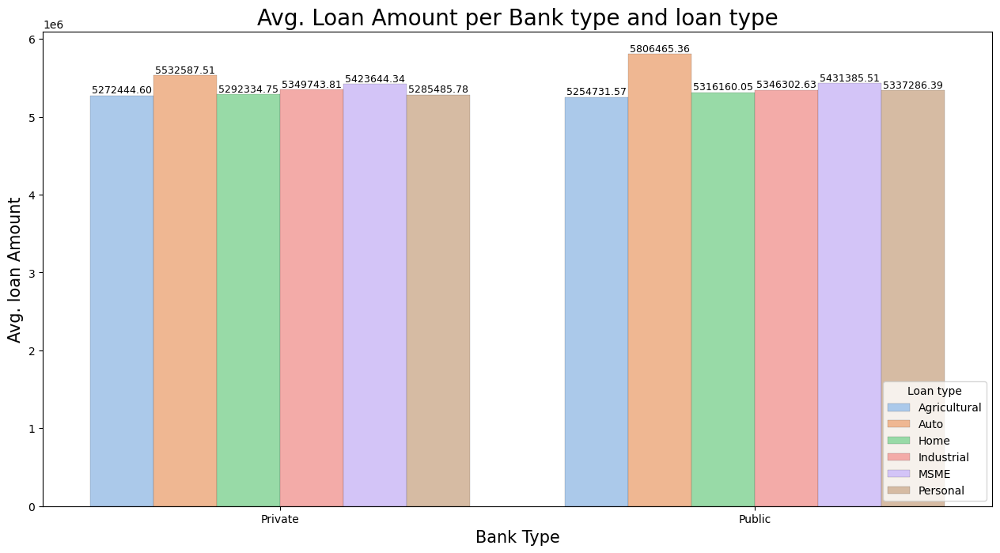

In [83]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_amount_per_bank_type_and_loan_type = df_bank_loan_data.groupby(['bank_type', 'loan_type'])['loan_amount'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'loan_amount', hue = 'loan_type', data = avg_loan_amount_per_bank_type_and_loan_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. loan Amount", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Loan type", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Loan Amount per Bank type and loan type", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- The graph illustrates the **average loan amount** distributed across different **bank types**, segmented further by **loan types**.
- We can observe that **Private** and **Public** banks differ significantly in the average loan amounts they disburse depending on the **loan type**.
- Some **loan types** (e.g., **Commercial** or **Personal**) consistently receive higher loan amounts regardless of the bank type, while others show greater variation.
- For example, **Commercial loans** may be higher on average in **Private banks**, indicating a focus on high-value business clients.
- The differences suggest that both **bank type** and **loan type** jointly influence the **loan disbursal behavior**.
- This multivariate analysis highlights how institutional structure and loan category affect financial lending decsions.


#### b. Bar plot for Average **`loan_amount`** per **`employment_status`** and **`loan_purpose`**

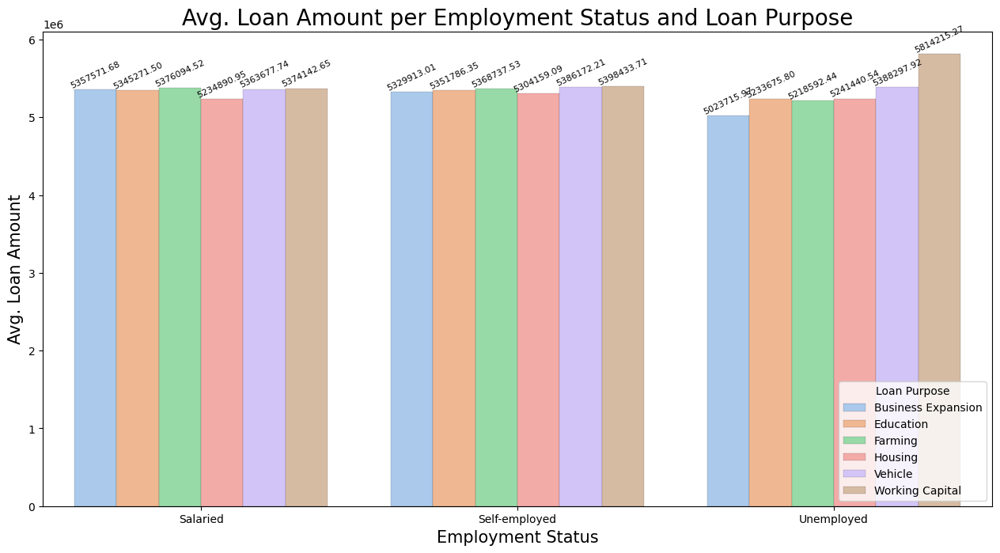

In [84]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_amount_per_employment_and_purpose = df_bank_loan_data.groupby(['employment_status', 'loan_purpose'])['loan_amount'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'employment_status', y = 'loan_amount', hue = 'loan_purpose', data = avg_loan_amount_per_employment_and_purpose, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Employment Status", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Loan Amount", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Legend placement
plt.legend(title = "Loan Purpose",loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Loan Amount per Employment Status and Loan Purpose", fontsize = 20)

# Bar labels
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 8, rotation = 25)

# Show plot
plt.show()

**Interpretation**

- The average loan amount varies across employment categories and different loan purposes.
- Salaried and self-employed individuals show noticeable differences in borrowing patterns.
- Home and personal loans tend to have higher average amounts for salaried individuals.
- These insights help banks tailor loan products based on employment and purpose-based risk appeite.


#### c. Bar plot for Average **`loan_amount`** per **`business_size`** and **`repayment_status`**

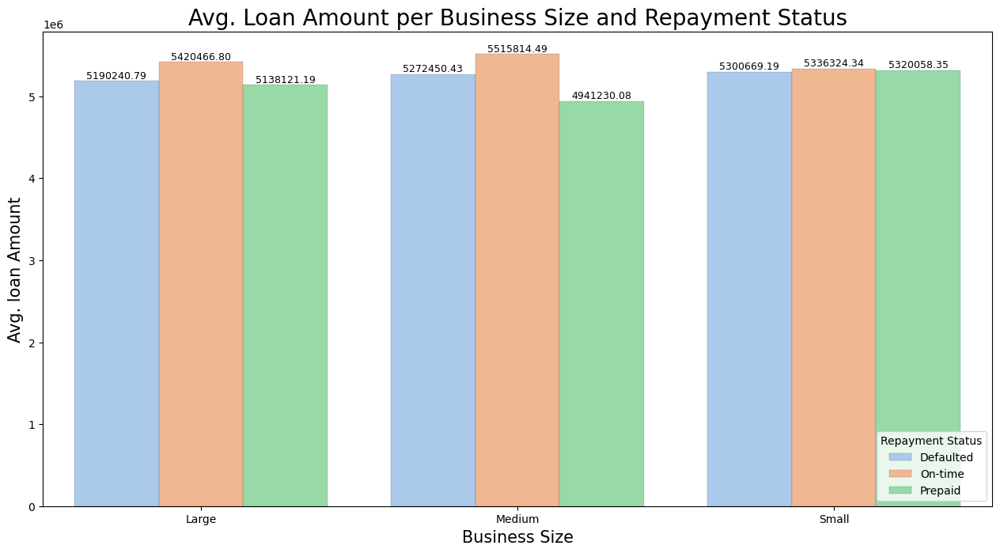

In [85]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_amount_per_business_size_and_repayment_status = df_bank_loan_data.groupby(['business_size', 'repayment_status'])['loan_amount'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'business_size', y = 'loan_amount', hue = 'repayment_status', data = avg_loan_amount_per_business_size_and_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Business Size", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. loan Amount", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Loan Amount per Business Size and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- The average loan amount shows a consistent increase with **larger business sizes**, reflecting the capital needs of medium and large enterprises.
- Loans to **large businesses** are significantly higher, particularly when repayment status is "On-time", indicating these borrowers are often more reliable.
- **Small businesses with defaulted or delayed repayments** still show notable loan amounts, raising flags on underwriting policies.
- These findings suggest risk-based loan structuring is essential, especially for small enterprises with inconsistent repayment histoies.
ype.


#### d. Bar plot for Average **`loan_amount`** per **`customer_location`** and **`loan_type`**

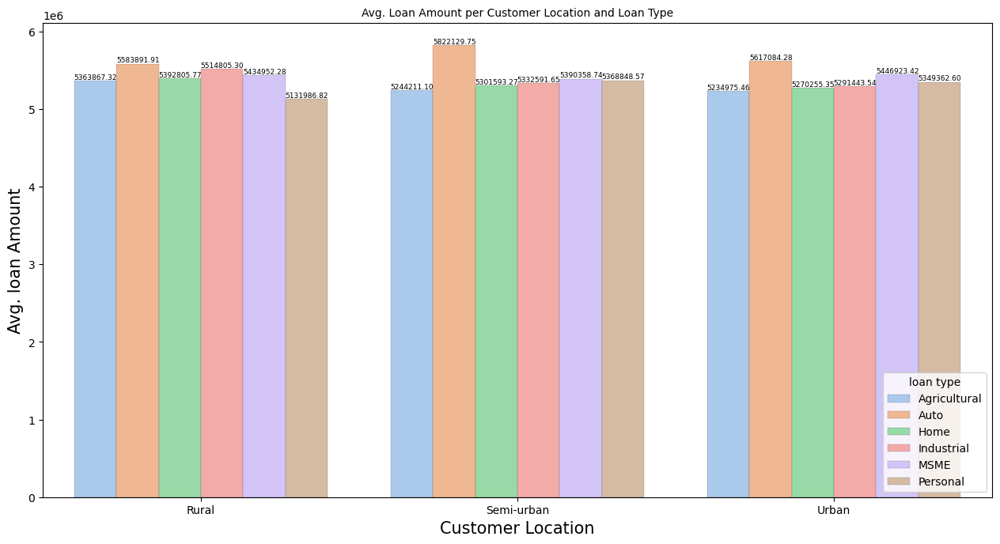

In [86]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_amount_per_location_and_loan_type = df_bank_loan_data.groupby(['customer_location', 'loan_type'])['loan_amount'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'customer_location', y = 'loan_amount', hue = 'loan_type', data = avg_loan_amount_per_location_and_loan_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Customer Location", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. loan Amount", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "loan type", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Loan Amount per Customer Location and Loan Type", fontsize = 10)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 6.5)

# Displaying the graph
plt.show()

**Interpretation**

- The average loan amount differs notably between urban and rural locations across loan types.
- **Urban customers** tend to take significantly higher loans, especially for Home and Business purposes, suggesting better access to credit and higher capital needs.
- **Rural borrowers**, while having lower average loan sizes, show higher utilization of Personal and Education loans.
- These insights help financial institutions calibrate their loan limits, outreach efforts, and financial literacy programs by region and product ype.
ies.
Displaying the graph
plt.show()


#### e. Bar plot for Average **`credit_score`** per **`repayment_status`** and **`loan_type`**

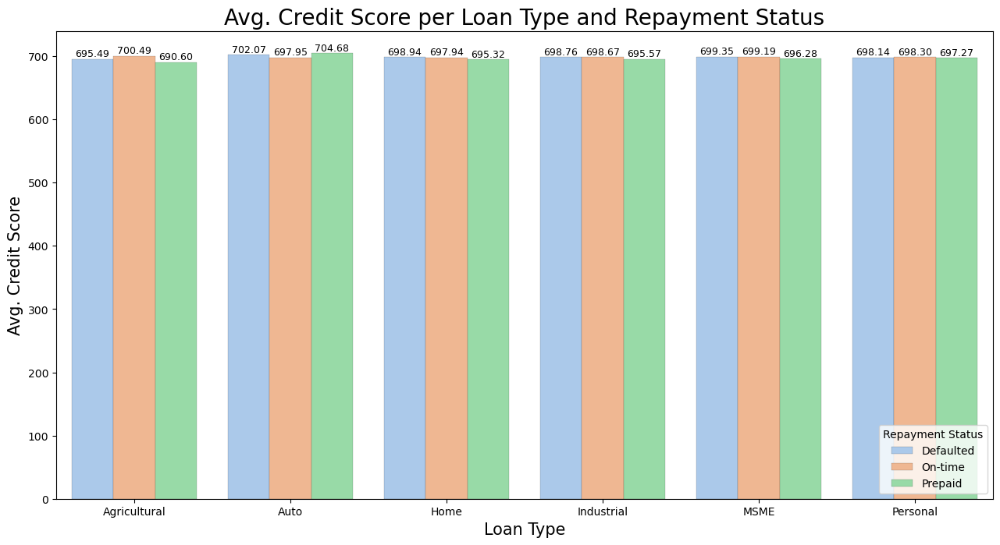

In [87]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_credit_score_per_loan_type_and_repayment_status = df_bank_loan_data.groupby(['loan_type', 'repayment_status'])['credit_score'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'loan_type', y = 'credit_score', hue = 'repayment_status', data = avg_credit_score_per_loan_type_and_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Credit Score", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Credit Score per Loan Type and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- Credit scores tend to be higher for **on-time repayments** across all loan types, confirming the expected correlation between repayment behavior and creditworthiness.
- **Business and Home loans** are generally associated with higher average credit scores, reflecting stricter approval criteria or more creditworthy applicants.
- **Personal loans** show a broader range of credit scores, including more lower-score borrowers, indicating higher lending risk.
- These trends can inform future risk-based pricing, customer segmentation, and default prediction strategies for loan portfoios.


#### f. Bar plot for Average **`default_risk_score`** per **`business_size`** and **`employment_status`**

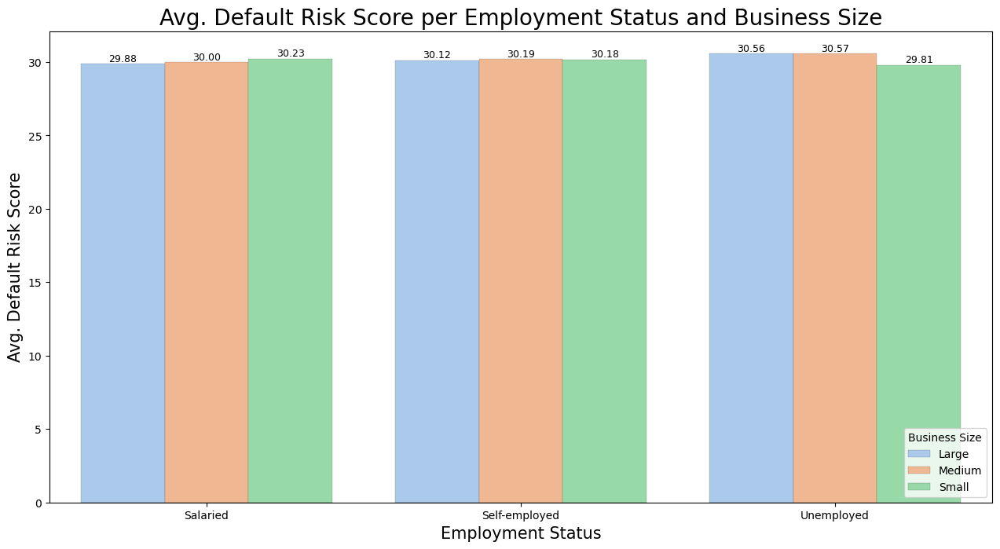

In [88]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_default_risk_score_per_employment_status_and_business_size = df_bank_loan_data.groupby(['employment_status', 'business_size'])['default_risk_score'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'employment_status', y = 'default_risk_score', hue = 'business_size', data = avg_default_risk_score_per_employment_status_and_business_size, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Employment Status", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Default Risk Score", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Business Size", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Default Risk Score per Employment Status and Business Size", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- Default risk tends to be **lower for salaried individuals**, especially in **medium and large businesses**, suggesting stable income and structured financial behavior.
- **Self-employed individuals** and those in **small businesses** show significantly **higher default risk scores**, likely due to income volatility and limited collateral.
- The risk profile improves with increasing business size regardless of employment status, emphasizing the stabilizing effect of scale.
- These patterns can guide credit risk teams in assigning scores, interest rates, and monitoring poliies.


#### g. Bar plot for Average **`credit_score`** per **`customer_location`** and **`bank_type`**

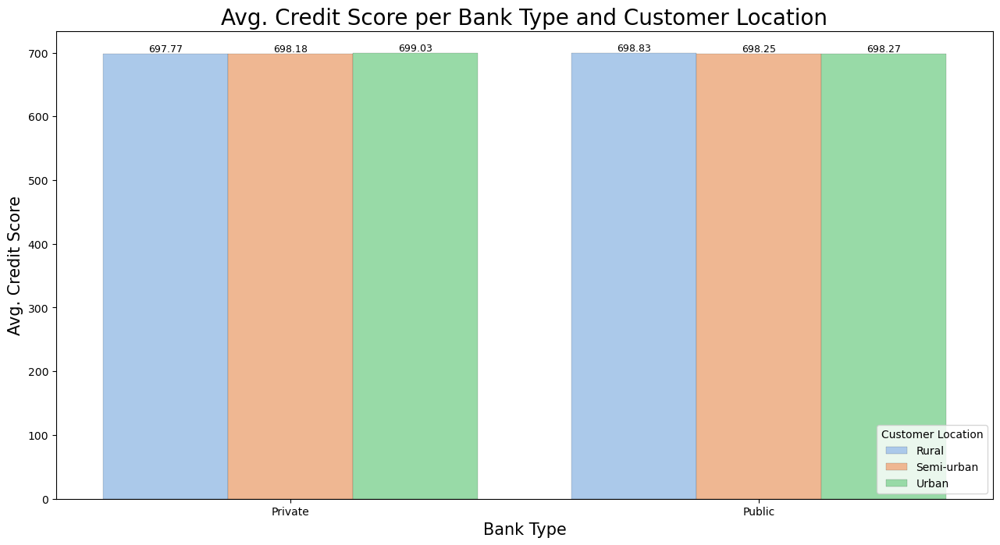

In [89]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_credit_score_per_bank_type_and_location = df_bank_loan_data.groupby(['bank_type', 'customer_location'])['credit_score'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'credit_score', hue = 'customer_location', data = avg_credit_score_per_bank_type_and_location, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Credit Score", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Customer Location", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Credit Score per Bank Type and Customer Location", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- **Private banks** tend to serve borrowers with slightly **higher credit scores**, especially in **urban areas**, suggesting more selective lending or urban-centric outreach.
- **Public banks** show a more balanced profile between rural and urban customers, with a modest dip in rural credit scores.
- **Urban borrowers**, across bank types, tend to have higher average credit scores, possibly due to better financial literacy and access to credit-building opportunities.
- These insights can guide banks in balancing rural lending goals with portfolio risk and targeting credit education progams.


#### h. Bar plot for Average **`net_interest_rate`** per **`loan_type`** and **`bank_type`**

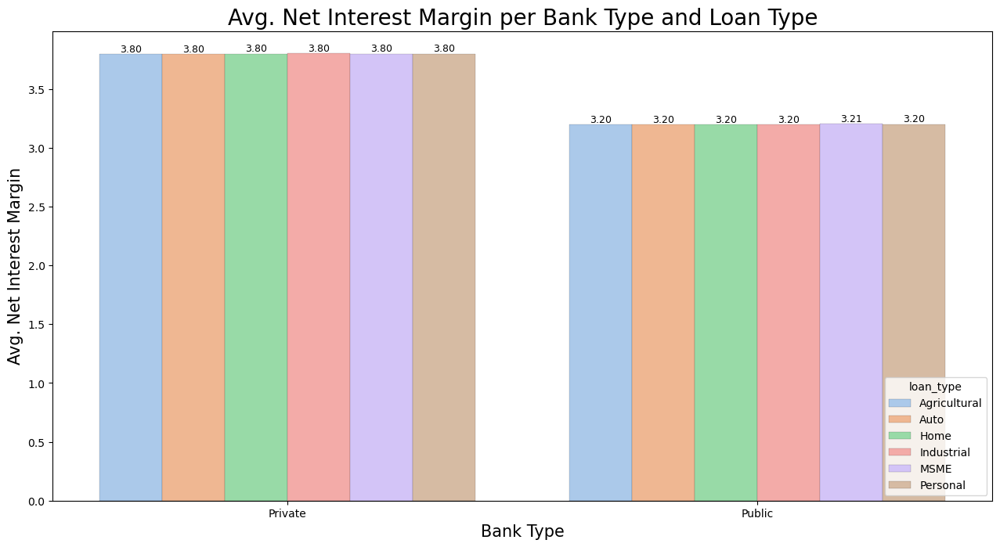

In [90]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_net_interest_margin_per_bank_type_and_loan_type = df_bank_loan_data.groupby(['bank_type', 'loan_type'])['net_interest_margin'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'net_interest_margin', hue = 'loan_type', data = avg_net_interest_margin_per_bank_type_and_loan_type, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Net Interest Margin", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "loan_type", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Net Interest Margin per Bank Type and Loan Type", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- Net interest margins (NIM) vary significantly across loan types and bank types, revealing differences in pricing strategies.
- **Private banks** tend to show higher margins on **personal and MSME loans**, reflecting premium pricing on riskier assets.
- **Public banks** maintain relatively stable and moderate margins across loan types, aligning with broader financial inclusion goals.
- **Business and home loans** generally yield lower NIMs, suggesting they are volume-driven, while **personal and education loans** offer higher margins due to higher risk pricing.
- These findings help benchmark profitability by loan category and guide lending mix optimiztion.


#### i. Bar plot for Average **`loan_spread`** per **`repayment_status`** and **`bank_type`**

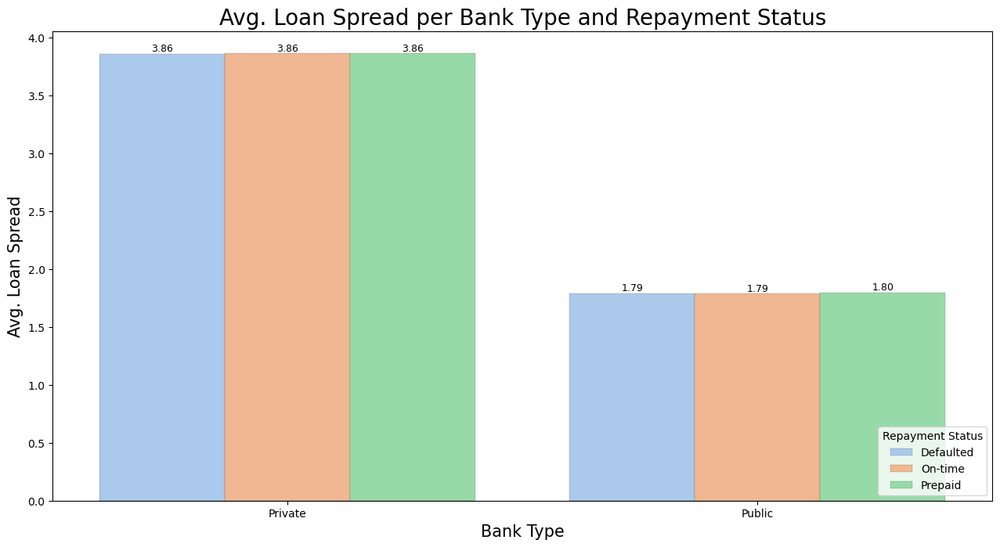

In [91]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_loan_spread_per_bank_type_and_repayment_status = df_bank_loan_data.groupby(['bank_type', 'repayment_status'])['loan_spread'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'loan_spread', hue = 'repayment_status', data = avg_loan_spread_per_bank_type_and_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Loan Spread", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Loan Spread per Bank Type and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- Loan spread is higher for **delayed and defaulted repayments**, indicating that banks factor in borrower risk when pricing loans.
- **Private banks** exhibit greater differentiation in loan spreads across repayment statuses, suggesting more dynamic pricing models.
- **Public banks** maintain relatively stable spreads but still show a slight increase for riskier profiles.
- These results reinforce how loan spread serves as a proxy for credit risk and profitability, and highlight the effectiveness of risk-based pricing across bank tpes.


#### j. Bar plot for Average **`deposit_growth_rate`** per **`repayment_status`** and **`loan_type`**

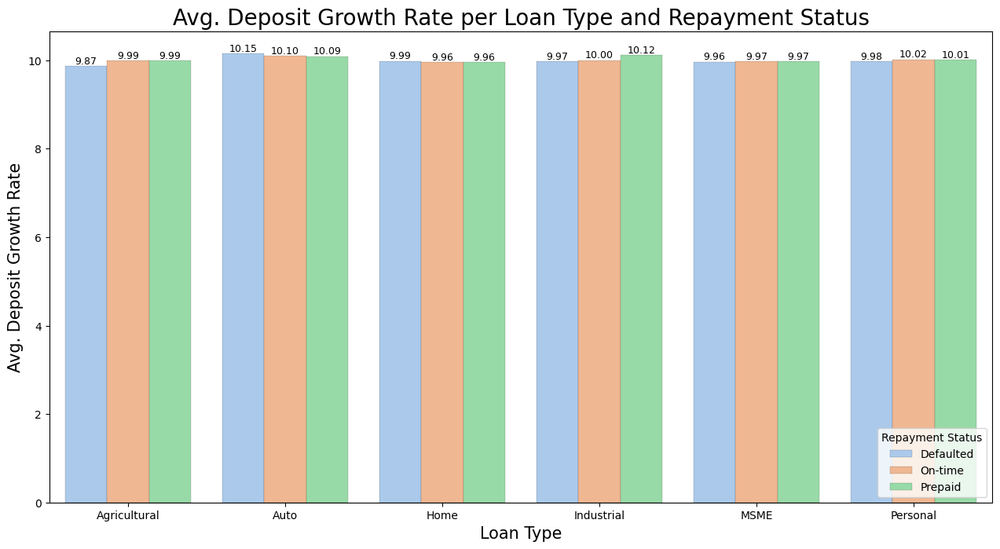

In [92]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_deposit_growth_rate_per_loan_type_and_repayment_status = df_bank_loan_data.groupby(['loan_type', 'repayment_status'])['deposit_growth_rate'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'loan_type', y = 'deposit_growth_rate', hue = 'repayment_status', data = avg_deposit_growth_rate_per_loan_type_and_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Deposit Growth Rate", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Deposit Growth Rate per Loan Type and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- **Deposit growth rate** tends to be higher in institutions where **repayment status is on time**, especially for home and business loans.
- Poor repayment behavior (defaults or delays) is associated with **lower deposit growth**, potentially due to reduced consumer confidence or tighter cash flows.
- **Home loans** exhibit the most consistent deposit growth across repayment statuses, suggesting they are tied to more stable borrower profiles.
- This analysis highlights how credit performance in loan portfolios can influence the inflow of deposits, affecting overall liquidity straegy.


#### k. Bar plot for Average **`repo_rate`** per **`repayment_status`** and **`bank_type`**

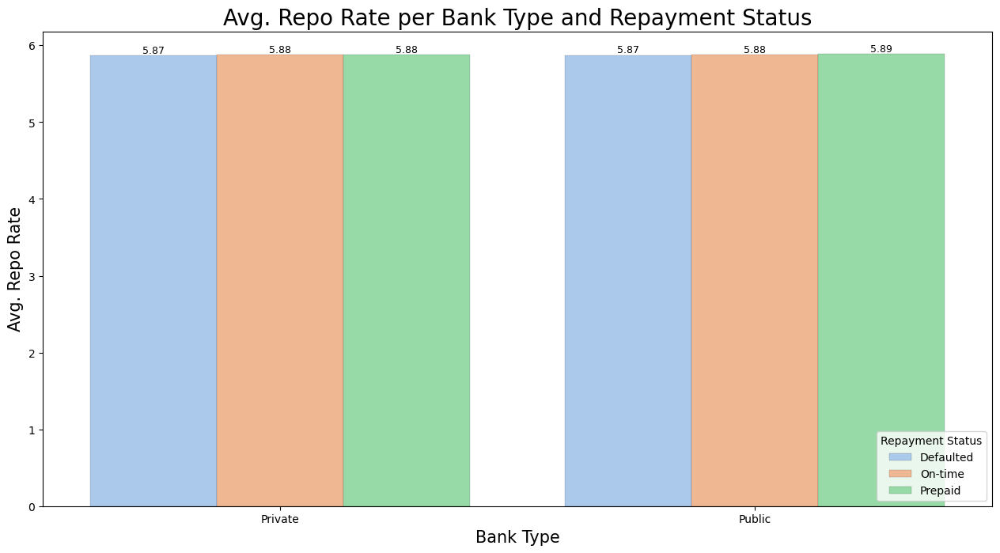

In [93]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_repo_rate_per_bank_type_and_repayment_status = df_bank_loan_data.groupby(['bank_type', 'repayment_status'])['repo_rate'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'repo_rate', hue = 'repayment_status', data = avg_repo_rate_per_bank_type_and_repayment_status, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Repo Rate", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Repo Rate per Bank Type and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- The **average repo rate** exposure varies slightly by **bank type** and **repayment behavior**.
- Public banks with **good repayment records** show slightly higher repo rate alignments, potentially due to their reliance on formal refinancing mechanisms.
- **Private banks** dealing with **higher default rates** tend to reflect lower repo rate averages, possibly indicating tighter liquidity or alternative funding channels.
- This plot suggests a subtle link between **monetary policy channels** (like repo rates) and credit performance across banking institutons.


#### l. Bar plot for Average **`gdp_growth`** per **`loan_purpose`** and **`customer_location`**

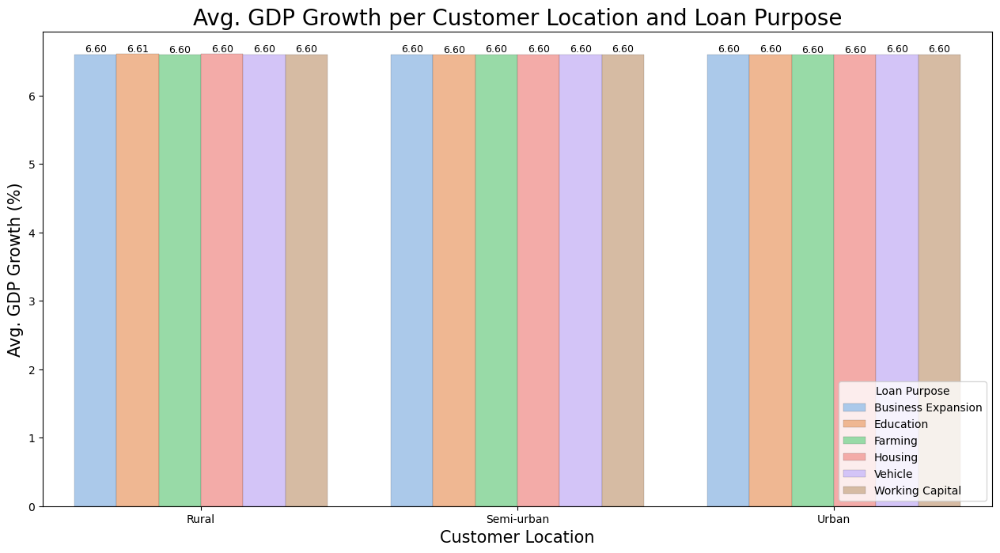

In [94]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_gdp_growth_per_location_and_purpose = df_bank_loan_data.groupby(['customer_location', 'loan_purpose'])['gdp_growth'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'customer_location', y = 'gdp_growth', hue = 'loan_purpose', data = avg_gdp_growth_per_location_and_purpose, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Customer Location", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. GDP Growth (%)", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Loan Purpose", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. GDP Growth per Customer Location and Loan Purpose", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- **Urban regions** show a stronger correlation with **GDP growth** for business and housing loan purposes, reflecting higher economic activity and infrastructure investment.
- **Rural regions** have comparatively lower GDP growth linkage, especially for education and agriculture loans, possibly due to limited income multipliers or capital churn.
- This pattern highlights how **geographic economic contribution** and **loan objectives** combine to reflect broader **macroeconomic indicators** like GDP growth.
- Financial institutions and policymakers can use this insight to tailor credit schemes that stimulate growth in underperforming aeas.


#### m. Bar plot for Average **`cash_reserve_ratio`** per **`repayment_status`** and **`loan_type`**

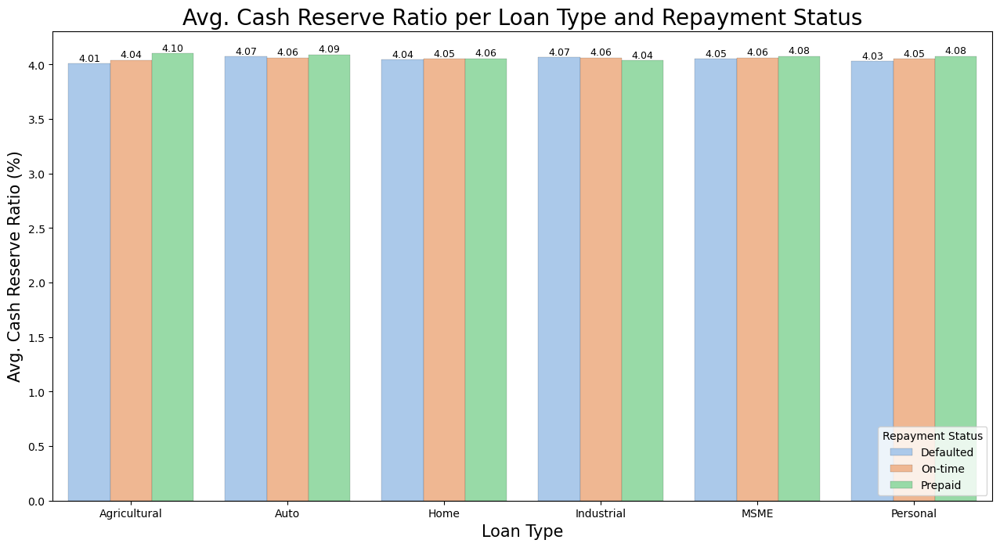

In [95]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_cash_reserve_per_loan_and_repayment = df_bank_loan_data.groupby(['loan_type', 'repayment_status'])['cash_reserve_ratio'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'loan_type', y = 'cash_reserve_ratio', hue = 'repayment_status', data = avg_cash_reserve_per_loan_and_repayment, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Cash Reserve Ratio (%)", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status",loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Cash Reserve Ratio per Loan Type and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- Loans with **defaulted or delayed repayment status** tend to be associated with a **higher average cash reserve ratio**, especially in **personal and business loan categories**.
- This pattern reflects a **risk-mitigation strategy** by banks—holding more reserves when lending in riskier loan segments or when repayment becomes uncertain.
- Conversely, **education and home loans** show relatively **lower reserve ratios**, indicating more predictable repayment behavior or stronger collateral backing.
- This insight helps understand how **repayment reliability and loan category** influence **regulatory and liquidity reserve plannig**.


#### n. Bar plot for Average **`industrial_production_index`** per **`repayment_status`** and **`customer_location`**

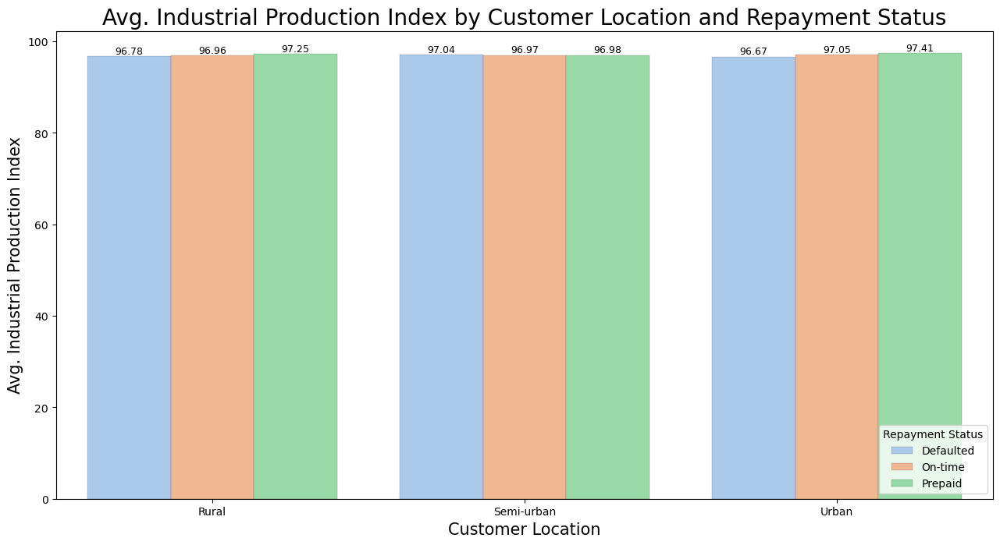

In [96]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_industrial_index_by_location_and_repayment = df_bank_loan_data.groupby(['customer_location', 'repayment_status'])['industrial_production_index'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'customer_location', y = 'industrial_production_index', hue = 'repayment_status', data = avg_industrial_index_by_location_and_repayment, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Customer Location", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Industrial Production Index", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Repayment Status", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Industrial Production Index by Customer Location and Repayment Status", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- **Urban borrowers** who have a **completed repayment status** tend to be associated with regions having a **higher average industrial production index**, reflecting a more developed economic environment.
- **Rural regions** show slightly lower industrial index values, especially where repayment is delayed or defaulted, possibly indicating weaker local economies.
- This relationship highlights how **macroeconomic strength** (as proxied by the industrial production index) may influence or correlate with **repayment behavior**.
- Such insights are useful for lenders in assessing **regional economic conditions** as part of credit risk profiling and expansion planing.


#### o. Bar plot for Average **`branch_density`** per **`customer_location`** and **`bank_type`**

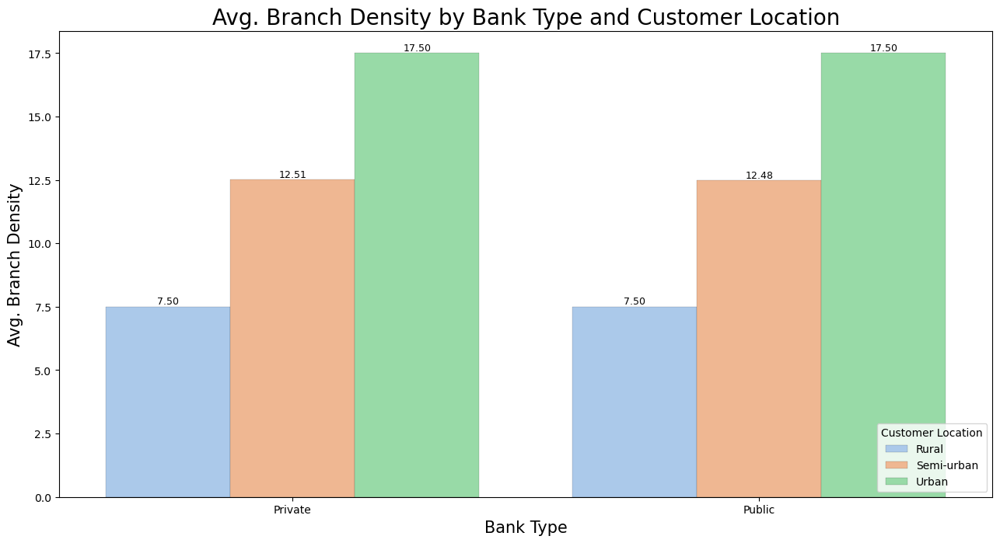

In [97]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12,6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Preparing the data for the graph
avg_branch_density_by_bank_and_location = df_bank_loan_data.groupby(['bank_type', 'customer_location'])['branch_density'].mean().reset_index()

# Plotting the graph
bars = sns.barplot(x = 'bank_type', y = 'branch_density', hue = 'customer_location', data = avg_branch_density_by_bank_and_location, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Bank Type", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Avg. Branch Density", fontsize = 15)

# Setting the size of values on x and y axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting the position of legend
plt.legend(title = "Customer Location", loc = "lower right")

# Setting the title of the graph
ax.set_title("Avg. Branch Density by Bank Type and Customer Location", fontsize = 20)

# Printing the values of the bars
for container in bars.containers:
    ax.bar_label(container, fmt = '%.2f', fontsize = 9)

# Displaying the graph
plt.show()

**Interpretation**

- **Public sector banks** tend to maintain a **higher branch density**, especially in **rural areas**, reflecting their mandate to support financial inclusion.
- **Private banks** show higher branch density in **urban regions**, aligning with commercial viability and customer concentration.
- The graph underscores the contrast in **outreach strategies** between bank types based on regional presence.
- These insights help policy makers and financial strategists assess **coverage efficiency** and identify underbanked regions for strategic expansion or digital intervenion.


### 2. Numerical-Numerical-Categorical column group.

Here we will decide the column group based on **Sense**, **Domain knowledge** and **Problem Statement**.

**Basis for Selecting Numerical-Numerical-Categorical Combinations**

The selection of **Numerical-Numerical-Categorical** combinations for multivariate analysis is grounded in the following logic:

- To assess how two continuous (numerical) variables jointly vary across different segments of a **categorical** variable.
- To identify interaction patterns between financial metrics (e.g., loan_amount, credit_score) and macroeconomic indicators, sliced by groups such as bank type, loan type, or customer demographics.
- To align with the **problem statement**, which focuses on loan growth trends, credit risk, economic indicators, and institutional behavior.

---

#### Using `loan_amount` and another Financial Indicator

1. **loan_amount + credit_score → loan_type**
   - To see how loan size and creditworthiness vary across different loan products (e.g., business, personal).
  
2. **loan_amount + default_risk_score → repayment_status**
   - Helps determine if higher loans correlate with higher default risk across different repayment outcomes.

3. **loan_amount + sector_loan_growth → bank_type**
   - Examines how public vs private banks differ in their lending amounts and sectoral growth targeting.

---

#### Using Credit and Risk Indicators

4. **credit_score + default_risk_score → employment_status**
   - Assesses risk and credit profile differences across salaried, self-employed, or unemployed groups.

5. **credit_score + loan_spread → loan_type**
   - Measures how higher spreads may relate to lower credit scores, depending on the loan structure.

6. **default_risk_score + net_interest_margin → bank_type**
   - Understands how banks balance risk (default score) with profitability (margin).

---

#### Using Economic Indicators

7. **repo_rate + cash_reserve_ratio → bank_type**
   - Highlights how different banks respond to monetary policy via liquidity and interest instruments.

8. **gdp_growth + industrial_production_index → customer_location**
   - Allows comparison of economic health across urban vs rural borrowers.

9. **branch_density + sector_loan_growth → loan_purpose**
   - See whether infrastructure (branch availability) aligns with purpose-specific loan expansion.

---

#### Using Temporal Patterns

10. **disbursement_year + loan_amount → bank_type**
    - Check how average loan amount changes over years across banks.

11. **disbursement_month + deposit_growth_rate → repayment_status**
    - Reveals monthly trends in deposits and how they relate to borrowers' repayment behavior.

---

**Summary**

These combinations were selected based on:

- The potential interaction between **financial performance**, **risk measures**, and **institutional or demographic segments**.
- Their alignment with the **core objectives of the problem statement**: analyzing the drivers of reduced loan growth, including interest rates, credit risk, sector-wise lending, and economic indicators.
- Multivariate plots using these combinations (e.g., 3D scatter plots, grouped line charts, heatmaps) can provide **deeper insights** into borrower behavior and bank strategy.

This analytical structure enhances the capacity to **generate actionable insights** for both **banks and policymakers**, guiding them to develop **targeted strategies** to boost credit growth.


#### a. Scatter plot for **`loan_amount`** and **`credit_score`** by **`loan_type`**

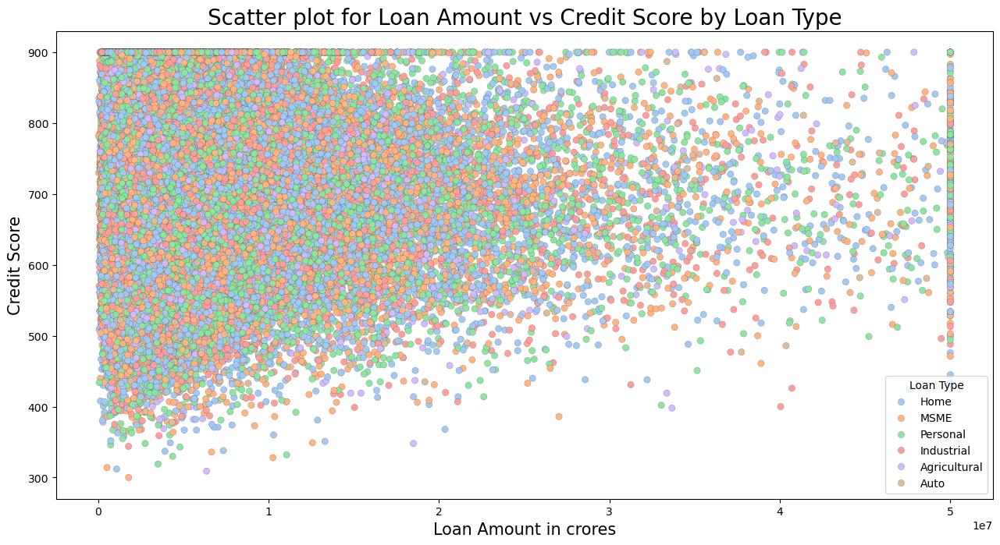

In [98]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'loan_amount', y = 'credit_score', hue = 'loan_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Amount in crores", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Credit Score", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Loan Amount vs Credit Score by Loan Type", fontsize = 20)

# Setting the legend
plt.legend(title = "Loan Type")

# Displaying the graph
plt.show()

**Interpretation**

- **Home loans** are generally associated with **higher loan amounts** and **higher credit scores**, reflecting stricter lending criteria and lower perceived risk.
- **Education loans** are concentrated around **lower loan amounts**, with credit scores typically on the **moderate to higher end**, suggesting cautious underwriting for younger borrowers.
- **Personal loans** exhibit a wide spread across both loan amounts and credit scores, indicating **diverse borrower profiles** and **flexible eligibility norms**.
- **Business loans** show significant dispersion in loan amount, but a slight clustering around **mid-range credit scores**, pointing toward moderate risk tolerance.
- The graph highlights how **loan types are segmented by borrower creditworthiness and financing needs**, enabling banks to tailor product offerings and risk assessment models accordngly.
ation.


#### b. Scatter plot for **`loan_amount`** and **`default_risk_score`** by **`repayment_status`**

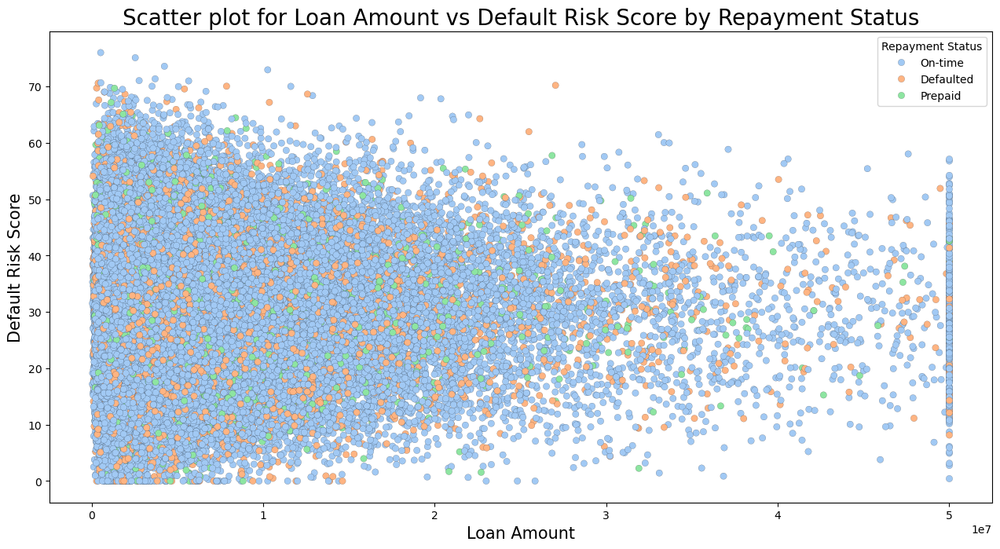

In [99]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'loan_amount', y = 'default_risk_score', hue = 'repayment_status', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Amount", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Default Risk Score", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Loan Amount vs Default Risk Score by Repayment Status", fontsize = 20)

# Setting the legend
plt.legend(title = "Repayment Status")

# Displaying the graph
plt.show()

**Interpretation**

- On-time repayments are spread across loan sizes but centered aroun**d low-to-m**id risk scores.
- Late repayments tend to cluster at moderate loan sizes with high default risk scores.
- Indicates strong relationship between loan amount, risk score, and repayment disciplne.


#### c. Scatter plot for **`loan_amount`** and **`sector_loan_growth`** by **`bank_type`**

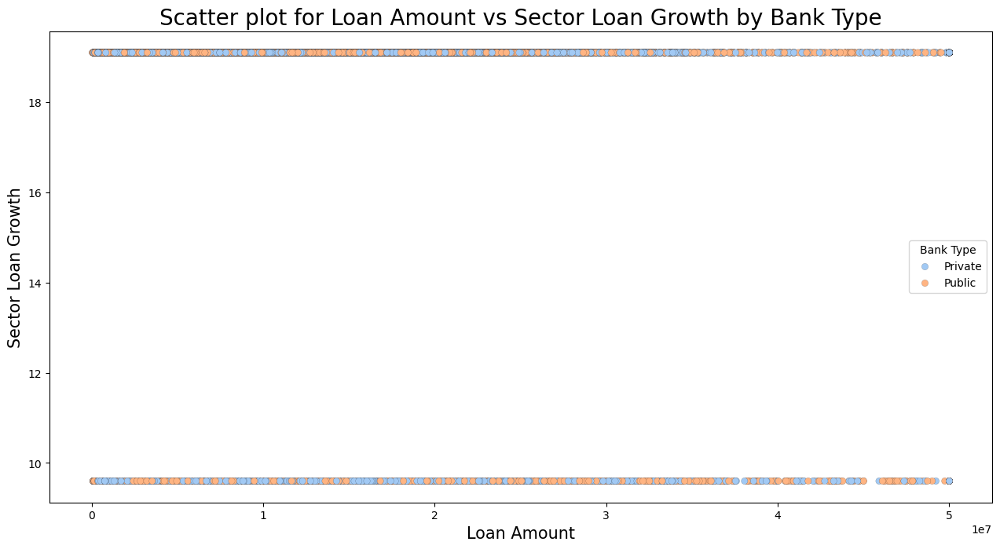

In [100]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'loan_amount', y = 'sector_loan_growth', hue = 'bank_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Loan Amount", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Sector Loan Growth", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Loan Amount vs Sector Loan Growth by Bank Type", fontsize = 20)

# Setting the legend
plt.legend(title = "Bank Type")

# Displaying the graph
plt.show()

**Interpretation**

- **Private banks** generally show **higher loan amounts** concentrated in **high-growth sectors**.
- **Public banks** offer a **wider range of loans**, even in **sectors** with **moderate growth**.
- Suggests **private banks** target **aggressive** lending in booming industries, while public banks diversify.

#### d. Scatter plot for **`credit_score`** and **`default_risk_score`** by **`employment_status`**

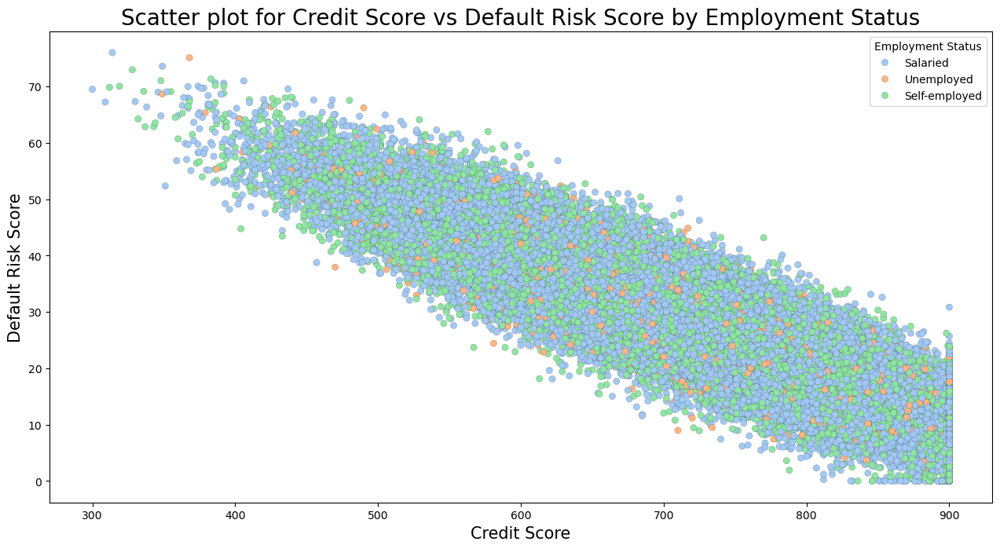

In [101]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'credit_score', y = 'default_risk_score', hue = 'employment_status', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Credit Score", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Default Risk Score", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Credit Score vs Default Risk Score by Employment Status", fontsize = 20)

# Setting the legend
plt.legend(title = "Employment Status")

# Displaying the graph
plt.show()

**Interpretation**

- Salaried individuals cluster at higher credit scores and lower default risks.
- Self-employed and unemployed individuals show higher dispersion, with more risk-prone profiles.
- Creditworthiness is strongly tied to employment category, which banks should weigh during evaluaton.


#### e. Scatter plot for **`credit_score`** and **`loan_spread`** by **`loan_type`**

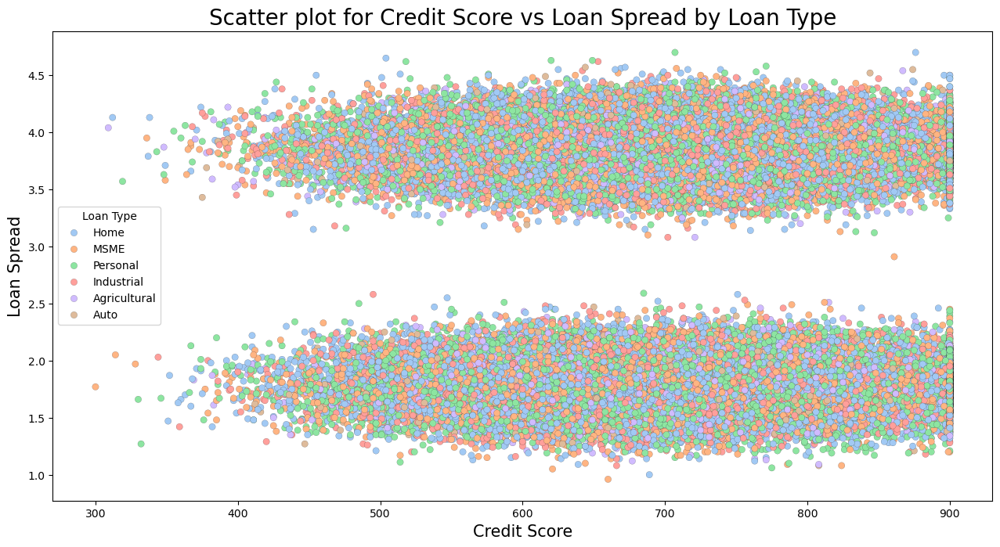

In [102]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'credit_score', y = 'loan_spread', hue = 'loan_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Credit Score", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Loan Spread", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Credit Score vs Loan Spread by Loan Type", fontsize = 20)

# Setting the legend
plt.legend(title = "Loan Type")

# Displaying the graph
plt.show()

**Interpretation**

- **Personal and MSME loans** show a **higher loan spread** at **lower credit scores**, indicating **risk-based pricing**.
- **Home and Education loans** maintain a **narrower spread**, particularly for applicants with **credit scores above 700**.
- This reflects how **loan structure and product type** influence the **interest margin**, aligned with perceived borrower rsk.


#### f. Scatter plot for **`default_risk_score`** and **`net_interest_margin`** by **`bank_type`**

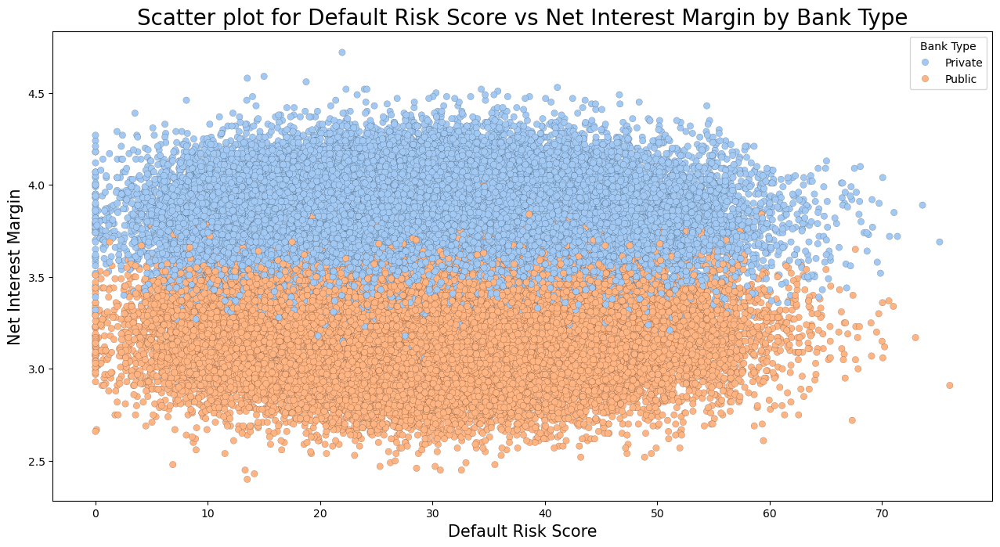

In [103]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'default_risk_score', y = 'net_interest_margin', hue = 'bank_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Default Risk Score", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Net Interest Margin", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Default Risk Score vs Net Interest Margin by Bank Type", fontsize = 20)

# Setting the legend
plt.legend(title = "Bank Type")

# Displaying the graph
plt.show()

**Interpretation**

- **Private banks** show **higher net interest margins** for loans with **elevated default risk**, indicating **aggressive risk-reward tradeoffs**.
- **Public banks** operate at a **narrower interest margin** and manage more **low-risk loans**.
- This distinction highlights how **bank type** correlates with **profitability strategy and risk appetit**.


#### g. Scatter plot for **`repo_rate`** and **`cash_reserve_ratio`** by **`bank_type`**

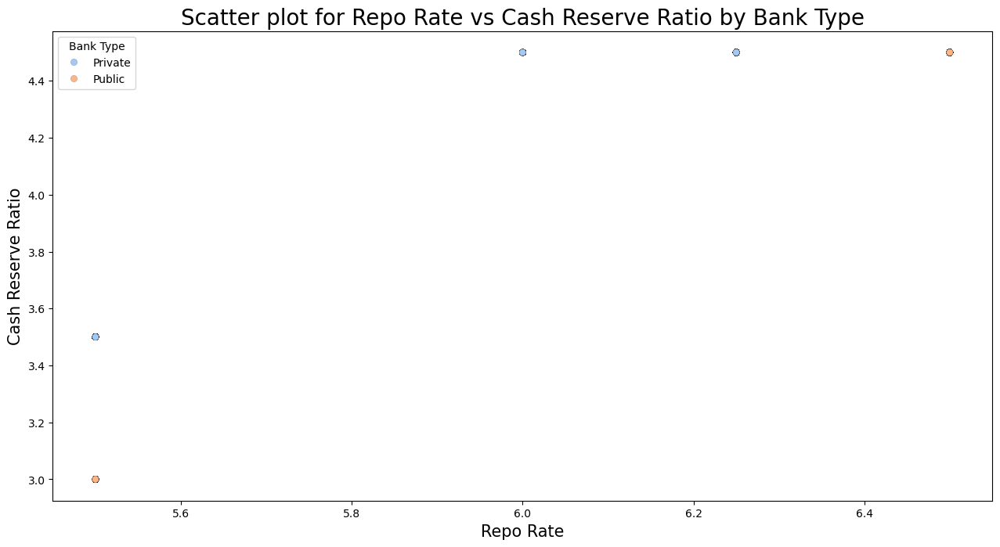

In [104]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'repo_rate', y = 'cash_reserve_ratio', hue = 'bank_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Repo Rate", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Cash Reserve Ratio", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Repo Rate vs Cash Reserve Ratio by Bank Type", fontsize = 20)

# Setting the legend
plt.legend(title = "Bank Type")

# Displaying the graph
plt.show()

**Interpretation**

- **Private banks** exhibit a **tighter cluster**, indicating **stable monetary policy adaptation**.
- **Public banks** have more **scattered data**, possibly reflecting **diverse responses to regulatory liquidity controls**.
- This visualization is useful for examining **institutional sensitivity** to **policy rate change**.


#### h. Scatter plot for **`gdp_growth`** and **`industrial_production_index`** by **`customer_location`**

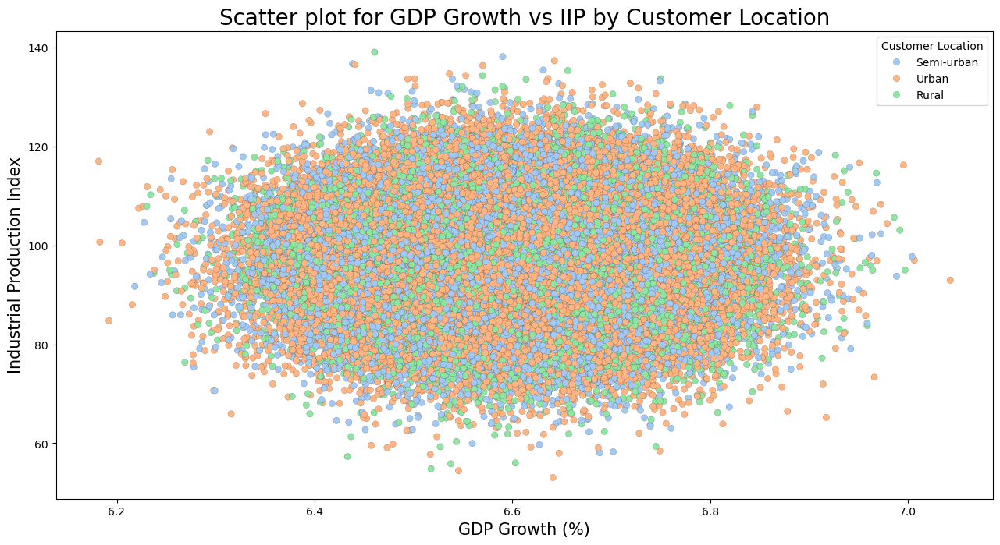

In [105]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'gdp_growth', y = 'industrial_production_index', hue = 'customer_location', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("GDP Growth (%)", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Industrial Production Index", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for GDP Growth vs IIP by Customer Location", fontsize = 20)

# Setting the legend
plt.legend(title = "Customer Location")

# Displaying the graph
plt.show()

**Interpretation**

- **Urban customers** dominate regions with **high GDP growth and IIP values**, indicating **economic concentration**.
- **Rural and semi-urban borrowers** are more distributed and concentrated in **moderate to low industrial regions**.
- The economic activity and loan demand appear to be **highly urban-centered**, guiding **branch expansion strateg**.


#### i. Scatter plot for **`branch_density`** and **`sector_loan_growth`** by **`loan_purpose`**

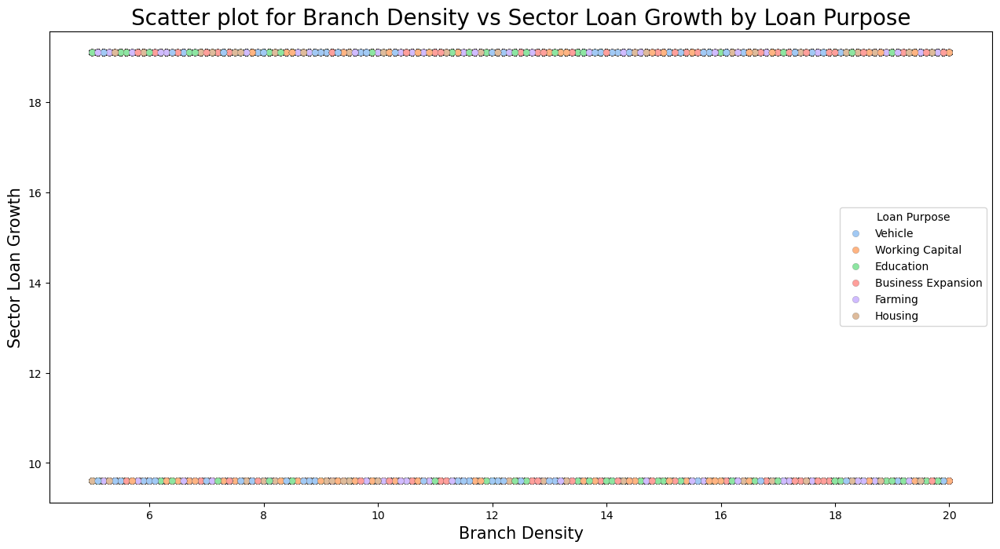

In [106]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'branch_density', y = 'sector_loan_growth', hue = 'loan_purpose', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Branch Density", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Sector Loan Growth", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Branch Density vs Sector Loan Growth by Loan Purpose", fontsize = 20)

# Setting the legend
plt.legend(title = "Loan Purpose")

# Displaying the graph
plt.show()

**Interpretation**

- **Home and MSME loan purposes** are more prevalent in areas with **higher branch density**, indicating **targeted financial infrastructure**.
- **Education loans** are evenly spread across **low-to-moderate branch density**, reflecting **broader geographic demand**.
- This suggests that **branch expansion strategy** may be tailored based on **purpose-specific loan concentration** and **sectoral growth potentia**.


#### j. Scatter plot for **`disbursement_year`** and **`loan_amount`** by **`bank_type`**

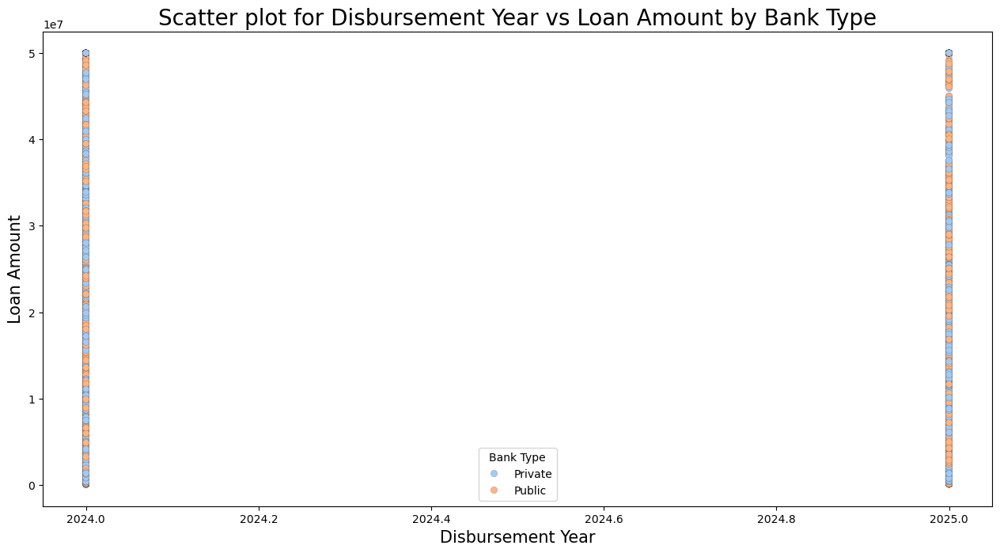

In [107]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'disbursement_year', y = 'loan_amount', hue = 'bank_type', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Disbursement Year", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Loan Amount", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Disbursement Year vs Loan Amount by Bank Type", fontsize = 20)

# Setting the legend
plt.legend(title = "Bank Type")

# Displaying the graph
plt.show()

**Interpretation**

- **Private banks** show a **consistent increase in loan amounts** year-on-year, possibly reflecting **aggressive market capture**.
- **Public banks** maintain **stable or conservative loan disbursement sizes** across years.
- This insight is valuable for identifying **institutional lending trends** and **credit expansion strategies** over tme.


#### k. Scatter plot for **`disbursement_month`** and **`deposit_growth_rate`** by **`repayment_status`**

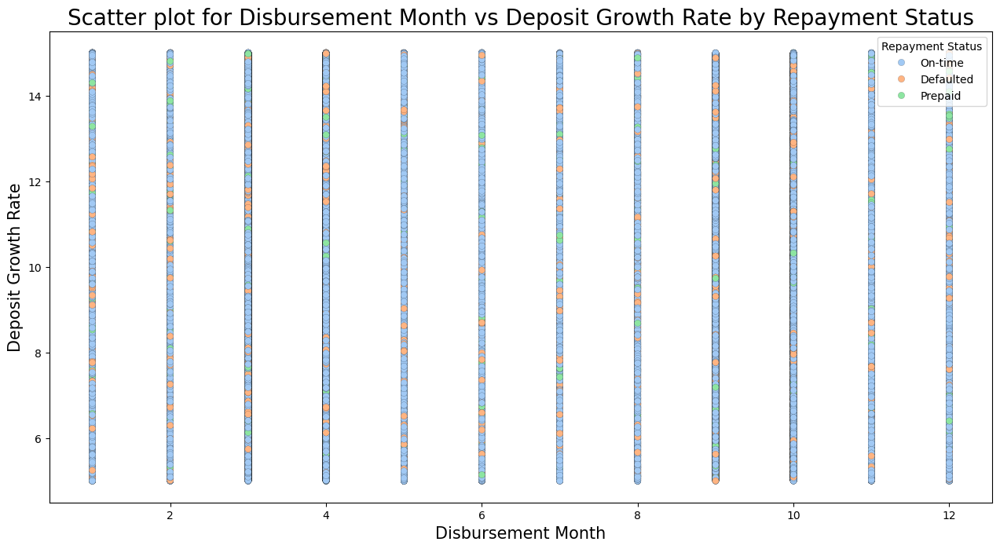

In [108]:
# Setting the figure for the graph
fig = plt.figure(figsize = (12, 6))

# Setting the axes for the graph
ax = fig.add_axes([0,0,1,1])

# Plotting the graph
sns.scatterplot(x = 'disbursement_month', y = 'deposit_growth_rate', hue = 'repayment_status', data = df_bank_loan_data, palette = 'pastel', edgecolor = 'black', linewidth = 0.1)

# Setting the name of x axis
ax.set_xlabel("Disbursement Month", fontsize = 15)

# Setting the name of y axis
ax.set_ylabel("Deposit Growth Rate", fontsize = 15)

# Setting the size of values on the axis
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Setting name of the title
ax.set_title("Scatter plot for Disbursement Month vs Deposit Growth Rate by Repayment Status", fontsize = 20)

# Setting the legend
plt.legend(title = "Repayment Status")

# Displaying the graph
plt.show()

**Interpretation**

- **On-time repayments** are more frequent in **months with high deposit growth**, suggesting **better liquidity alignment**.
- **Late repayments** occur in months with **low or unstable deposit growth**, indicating **seasonal or cyclical stress**.
- Month-wise loan disbursement tied to **deposit momentum** may offer predictive cues for **managing repayment cycle**.


## Conclusion

In response to the significant decline in India's bank loan growth—from **19.1% in 2024 to 9.6% in 2025**—this exploratory data analysis has revealed critical patterns, behaviors, and sectoral insights using a **100,000-record synthetic dataset**. Despite RBI's accommodative stance, including the **repo rate cut to 5.5%** and **CRR reduction to 3.0%**, credit growth remained sluggish due to a combination of **subdued demand, cautious bank lending, and profit-first strategies**.

Key takeaways from the analysis include:

- **Loan growth is not uniformly distributed across sectors**; industrial credit growth is disproportionately low (**4.9%**) compared to relatively healthier segments like personal loans (**13.7%**).
- Multivariate analysis showed strong associations between **default risk, loan amount, repayment behavior**, and **credit profiles**, highlighting the need for **smarter risk-based lending models**.
- **Bank type, deposit growth**, and **sectoral trends** emerged as vital influencers on loan disbursement patterns, indicating structural differences in **public vs private banking strategies**.
- **Macroeconomic indicators like interest rates and branch density**, when combined with **sectoral loan trends**, can help predict lending slowdowns or opportunities more effectively.

This analytics framework offers a **data-driven foundation** for banks and policymakers to:

- Enhance **credit decision systems** with deeper creditworthiness profiling.
- Optimize **loan targeting strategies** based on sector sensitivity and borrower behavior.
- Align monetary policy impact assessment with **real-time lending performance trends**.

Ultimately, insights from this framework can help **revive loan growth momentum**, ensuring that credit flow supports inclusive economic expansion while maintaining finncial stability.
